### # compare performance (25.01.21)
---
  - in : clinvar2021.dbNSFP.out.score

#==================================================

### mount

In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


### import library

In [5]:
import os
import pandas as pd
import numpy as np

from sklearn.preprocessing import Binarizer
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

from sklearn.metrics import precision_recall_curve,classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix, roc_auc_score
from sklearn.metrics import roc_curve, auc, matthews_corrcoef, average_precision_score

import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.graphics.mosaicplot import mosaic
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import math
from scipy.stats import gmean #기하평균

In [6]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

### current_fold

In [7]:
fold_here = '/content/drive/MyDrive/github/compare_pathogenic_tool'

os.chdir(fold_here)
print(f'Current Folder : {os.getcwd()}')

Current Folder : /content/drive/MyDrive/github/compare_pathogenic_tool


## make_fold

In [8]:
def make_folder(fold_here, fold_name):
    out_fold = fold_here + '/' + fold_name
    if not os.path.exists(out_fold):
        print("make:",out_fold)
        os.makedirs(out_fold)
    else:
        print("exist:",out_fold)

    return(out_fold)

In [9]:
out_fold = make_folder(fold_here, '03.result')
#os.listdir(out_fold)

exist: /content/drive/MyDrive/github/compare_pathogenic_tool/03.result


## read_data

In [119]:
para = {'prefix':'clinvar2021',
        'inFold':'00.data', 'inFile':'.dbNSFP.out.score',}
para['in'] = para['inFold'] + '/' + para['prefix'] + para['inFile']

df_score=pd.read_csv(para['in'], sep="\t", index_col = False, low_memory=False)
print(df_score.shape)
print('!!! Check [.] : ',df_score.isin(['.']).sum().sum())

# fillna => 0
df_score.loc[:, '1000Gp3_AF':'gnomAD_genomes_AF'] = df_score.loc[:, '1000Gp3_AF':'gnomAD_genomes_AF'].fillna(0)
df_score[df_score['gnomAD_exomes_AF']==0].head(1)
#df_score.head(1)

(8684, 113)
!!! Check [.] :  0


,#chr,pos(1-based),ref,alt,aaref,aaalt,aapos,genename,Ensembl_geneid,Ensembl_transcriptid,Ensembl_proteinid,VEP_canonical,cds_strand,refcodon,codonpos,Uniprot_acc(HGNC/Uniprot),Uniprot_id(HGNC/Uniprot),Entrez_gene_id,CCDS_id,Refseq_id,clinvar_id,clinvar_clnsig,clinvar_review,SIFT_score,SIFT_pred,SIFT4G_score,SIFT4G_pred,Polyphen2_HDIV_score,Polyphen2_HDIV_pred,Polyphen2_HVAR_score,Polyphen2_HVAR_pred,LRT_score,LRT_pred,LRT_Omega,MutationTaster_score,MutationTaster_pred,MutationAssessor_score,MutationAssessor_pred,FATHMM_score,FATHMM_pred,PROVEAN_score,PROVEAN_pred,VEST4_score,MetaSVM_score,MetaSVM_pred,MetaLR_score,MetaLR_pred,MetaRNN_score,MetaRNN_pred,M-CAP_score,M-CAP_pred,REVEL_score,MutPred_score,MVP_score,gMVP_score,MPC_score,PrimateAI_score,PrimateAI_pred,DEOGEN2_score,DEOGEN2_pred,BayesDel_addAF_score,BayesDel_addAF_pred,BayesDel_noAF_score,BayesDel_noAF_pred,ClinPred_score,ClinPred_pred,LIST-S2_score,LIST-S2_pred,VARITY_R_score,VARITY_ER_score,ESM1b_score,ESM1b_pred,EVE_score,EVE_Class75_pred,AlphaMissense_score,AlphaMissense_pred,PHACTboost_score,MutFormer_score,MutScore_score,CADD_raw,DANN_score,fathmm-MKL_coding_score,fathmm-MKL_coding_pred,fathmm-XF_coding_score,fathmm-XF_coding_pred,Eigen-raw_coding,GenoCanyon_score,LINSIGHT,GERP++_NR,GERP++_RS,GERP_91_mammals,phyloP100way_vertebrate,phyloP470way_mammalian,phyloP17way_primate,phastCons100way_vertebrate,phastCons470way_mammalian,phastCons17way_primate,SiPhy_29way_pi,SiPhy_29way_logOdds,bStatistic,1000Gp3_AF,TWINSUK_AF,ALSPAC_AF,UK10K_AF,ESP6500_AA_AF,ESP6500_EA_AF,ExAC_AF,gnomAD_exomes_AF,gnomAD_genomes_AF,yes,num,clnSig2,varType
4,1,1527718,A,G,N,S,502,ATAD3A,ENSG00000197785,ENST00000378755,ENSP00000368030,YES,+,AAC,2,Q9NVI7,ATD3A_HUMAN,55210.0,CCDS31;CCDS53259;CCDS53260,NM_018188;NM_001170535,1685550,5,M,0.004,D,0.006,D,1.0,D,0.995,D,0.0,D,0.0,1;1;1,D;D;D,4.035,H,-1.81,D,-4.12,D,0.827,1.058,D,0.9218,D,0.988439,D,0.54658,D,0.893,0.906,0.973646,0.871635,1.187778,0.554751,T,0.702464,D,0.2344,D,0.098923,D,0.99636,D,0.974503,D,0.316597,0.258572,-9.9,D,0.816024,P,0.3197,B,0.930435,0.014355,0.401,3.921156,0.998581,0.95587,D,0.889191,D,0.737925,0.999924,NaN,4.42,4.42,4.62,5.907,9.273,-0.129,1.0,1.0,0.122,1.0:0.0:0.0:0.0,13.0488,846.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,4,1,m


In [61]:
df_score['varType'].value_counts()

,count
varType,
m,5669
n,2957
i,53
t,5


In [107]:
_tmp = df_score[df_score['clnSig2'].isin([1,0]) & df_score['LINSIGHT'].notna()].copy()
_tmp.shape
for _af in [1,0.01,0.005,0.001,0.0005,0.0001,0]:
  print(_tmp[(_tmp['gnomAD_exomes_AF']<_af) | (_tmp['gnomAD_exomes_AF'].isna())]['clnSig2'].nunique())
  print(_af,"na \t", _tmp[(_tmp['gnomAD_exomes_AF']<_af) | (_tmp['gnomAD_exomes_AF'].isna())].shape[0])
  print(_af,"\t", _tmp[(_tmp['gnomAD_exomes_AF']<_af)].shape[0])

2
1 na 	 19
1 	 15
2
0.01 na 	 18
0.01 	 14
2
0.005 na 	 17
0.005 	 13
2
0.001 na 	 17
0.001 	 13
2
0.0005 na 	 15
0.0005 	 11
2
0.0001 na 	 12
0.0001 	 8
1
0 na 	 4
0 	 0


## def count_varType(_df,_para)


In [12]:
def count_varType(_df,_para):
    print("=== DEF: count_varType()")
    _var = _para['varType']
    _clnsig = _para['clnsig']
    _return = None

    for _k in ['All', 0, 1]: #clnsig
        if _k == 'All':
            _des = _df[_var].value_counts().to_frame(name='count')
        else:
            _des = _df.loc[_df[_clnsig] == _k, _var].value_counts().to_frame(name='count')
            _des[f'{_k}_ratio1'] = (_des['count'] / _df[_df[_clnsig]==_k].shape[0]) * 100

        _des[f'{_k}_ratio'] = (_des['count'] / _df.shape[0]) * 100
        _des.rename(columns={'count': f'{_k}_count'}, inplace=True)
        _des.reset_index(inplace=True)

        if _return is None:
            _return = _des
        else:
            _return = pd.merge(_return, _des, on=_var, how='outer')

    _return = _return.fillna(0)
    _total = ['total'] + list(_return.select_dtypes(include=['number']).sum().values)
    _return.loc[_return.shape[0]] = _total

    return(_return)

In [13]:
para.update({'varType':'varType', 'clnsig':'clnSig2'})

count_varType(df_score[df_score['clnSig2'].isin([0,1])], para)

=== DEF: count_varType()


,varType,All_count,All_ratio,0_count,0_ratio1,0_ratio,1_count,1_ratio1,1_ratio
0,i,53.0,0.632383,19.0,0.353291,0.226703,34.0,1.132201,0.405680
1,m,5396.0,64.383725,3868.0,71.922648,46.152010,1528.0,50.882451,18.231715
2,n,2927.0,34.924233,1490.0,27.705467,17.778308,1437.0,47.852148,17.145925
3,t,5.0,0.059659,1.0,0.018594,0.011932,4.0,0.133200,0.047727
4,total,8381.0,100.000000,5378.0,100.000000,64.168954,3003.0,100.000000,35.831046


## Preprocess (toolName)
```
def preprocess_extract_tool_name(_df)
  def preprocess_parameter_tool()
  def preprocess_map_predType(_df)
  def preprocess_calc_count_min_max(_df,_summary,_row)
```

In [14]:
#%%writefile 02_script/compare.py
#import pandas as pd

def preprocess_parameter_tool():
    _suffix = {'_coding_score':'score','_raw':'score','-raw_coding':'score','_score':'score',
               '_coding_pred':'pred','_Class75_pred':'pred','_pred':'pred'}

    _cat = {'ClinPred':2, 'MetaRNN':2, 'REVEL':2, 'gMVP':1, 'MVP':2, 'CADD':2, 'DEOGEN2':2,
       'MetaSVM':2, 'MetaLR':2, 'MutPred':1, 'VEST4':1, 'M-CAP':2, 'MutationAssessor':1,
            'MutationTaster':1,'PROVEAN':1,
       'FATHMM':1, 'Polyphen2_HVAR':1, 'SIFT4G':1, 'SIFT':1, 'Polyphen2_HDIV':1, 'LIST-S2':1,
       'PrimateAI':1, 'MPC':2, 'DANN':2, 'fathmm-MKL':1, 'fathmm-XF':1, 'LRT' : 1,
            'GenoCanyon':1,'Eigen':2, 'BayesDel_addAF':2, 'BayesDel_noAF':2,
            'VARITY_R':2,'VARITY_ER':2,'AlphaMissense':2,'ESM1b':2,'EVE':2,'LINSIGHT':2,
            'MutFormer':2,'MutScore':2,'PHACTboost':2}

    _cutoff = {
        'SIFT':0.05,#0.051,
        'SIFT4G':0.049, #0.05,
        'Polyphen2_HDIV':0.452, 'Polyphen2_HVAR':0.446,
        'MutationAssessor':1.935, 'FATHMM':-1.5,#-1.49,
        'PROVEAN':-2.5, 'MetaSVM':0,
        'MetaLR':0.4999, 'MetaRNN':0.5, 'M-CAP':0.025, 'PrimateAI':0.803,
        'DEOGEN2':0.5, 'ClinPred':0.5, 'LIST-S2':0.85,
        'fathmm-MKL':0.5,'fathmm-XF':0.5,
        'VEST4':0.5,'MutPred':0.75, 'MVP':0.7,
        #'CADD':20, 'DANN':0.99,'REVEL':0.4,
        'CADD':0, 'DANN':0.5,'REVEL':0.5,
        'gMVP':0.5, 'MPC':0.5, 'VARITY_R':0.5,
        'Eigen':0.5, 'GenoCanyon':0.5,
        'BayesDel_addAF':0.0692655, 'BayesDel_noAF':-0.0570105,
        'ESM1b':-7.5, 'MutFormer':0.8838, 'MutScore':0.5, 'MutationTaster':0.5,
        'AlphaMissense':0.5, 'EVE':0.5, 'LINSIGHT':0.5,'LRT':0.5,'PHACTboost':0.5, 'VARITY_ER':0.5,
    }

    _minus = {'SIFT':1, 'SIFT4G':1, 'FATHMM':1, 'PROVEAN':1,'ESM1b':1}

    return(_suffix, _cat, _cutoff, _minus)

def preprocess_map_predType(_df):
    _predType = sorted(_df.iloc[:,1].unique())
    _predDict = {}

    if _predType == ['D', 'T'] or _predType == ['D', 'N'] or _predType == ['D', 'N', 'U']:
        _predDict = {'D':1,'T':0,'N':0,'U':-1}
    elif _predType == ['B','D','P'] or _predType == ['B','P','U'] or _predType == ['A','B','P']:
        _predDict = {'D':2,'P':1,'B':0,'U':-1,'A':-1}
    elif _predType == ['H','L','M','N']:
        _predDict = {'H':2,'M':1,'L':0,'N':-1}
    else:
        print(f"!!! Not Mapping(predType) : {_predType}")
        return(_df, _predType)

    _df.iloc[:,1] = _df.iloc[:,1].map(_predDict)
    return(_df, _predType)

def preprocess_calc_count_min_max(_df,_summary,_row):
    _list = ['all'] + (list(_df[_row.pred].unique()) if _row.pred in _df.columns else [])

    for _k in _list:
        _tmp = _df.copy()
        _prefix = ''

        if _k != 'all':
            _prefix = f'_{_k}'
            _tmp = _df[_df[_row.pred]==_k].copy().reset_index(drop=True)

        _calc = {f'N{_prefix}':lambda x: x.count(),
                 f'Min{_prefix}':lambda x: x.min(),
                 f'Max{_prefix}':lambda x: x.max()}

        for _k,_v in _calc.items():
            _summary.loc[_row.Index, _k] = _v(_tmp[_row.score])

    return(_summary)

def preprocess_extract_tool_name(_df):
    _cols = _df.loc[:,'SIFT_score':'LINSIGHT'].columns.tolist()
    _suffix, _cat, _cutoff, _minus = preprocess_parameter_tool()

    _results = []
    for _ori in _cols:
        _col = _ori
        _type = ''

        for _k,_v in _suffix.items():
          if _col.endswith(_k):
            _col = _col.replace(_k, '')
            _type = _v
            break

        if _ori == 'LINSIGHT':
          _type = 'score'
        elif _ori == 'LRT_Omega' or _col == 'MutationTaster':
          continue

        _results.append({'tool': _col, 'type': _type, 'col': _ori})

    _tmp = pd.DataFrame(_results)
    _tmp = _tmp.pivot(index='tool', columns='type', values='col').reset_index()

##########################################################################

    for _map, _col, _base in [(_cat, "cat", 0), (_cutoff, "cutoff", -999), (_minus, "minus", '')]:
      _tmp[_col] = _tmp['tool'].map(_map).fillna(_base)
      if (_tmp[_col] == _base).any():
        print(f"*** No({_col}): {_tmp.loc[_tmp[_col] == _base, 'tool'].tolist()}")

##########################################################################

    _tmp['predType'] = ''
    for _row in _tmp.itertuples():
      _tm = _df[[_row.score]].copy()
      _tm = _tm[_tm[_row.score] != '.']
      if pd.notna(_row.pred):
          _tm = _df[[_row.score, _row.pred]].copy()
          _tm = _tm.dropna(subset=[_row.score]).reset_index(drop=True)
          _tm[_row.score] = _tm[_row.score].astype(float)

          _tm, _predType = preprocess_map_predType(_tm)
          _tmp.loc[_row.Index, 'predType'] = ', '.join(_predType)

      _tmp.loc[_row.Index, 'Miss'] = _df.shape[0] - _tm.shape[0]
      _tmp = preprocess_calc_count_min_max(_tm,_tmp,_row)

##########################################################################

    #_tmp['cat'] = _tmp['cat'].astype('category')
    _cols = ['tool','cat','cutoff','minus','score','pred','predType','N','Miss','Min','Max']
    _tmp = _tmp.sort_values(by=['cat','tool']).reset_index(drop=True)
    return (_tmp)

In [15]:
# exe & save
df_tools = preprocess_extract_tool_name(df_score)
print(df_tools.shape)
display(df_tools.head())

para.update({'outFold':'03.result', 'outFile':'.tool.summary.csv'})
para['out'] = para['outFold'] + '/' + para['prefix'] + para['outFile']
print("!!! Save : ", para['out'])
df_tools.to_csv(para['out'], sep='\t', index=False)
#count_varType(df)

*** No(minus): ['AlphaMissense', 'BayesDel_addAF', 'BayesDel_noAF', 'CADD', 'ClinPred', 'DANN', 'DEOGEN2', 'EVE', 'Eigen', 'GenoCanyon', 'LINSIGHT', 'LIST-S2', 'LRT', 'M-CAP', 'MPC', 'MVP', 'MetaLR', 'MetaRNN', 'MetaSVM', 'MutFormer', 'MutPred', 'MutScore', 'MutationAssessor', 'PHACTboost', 'Polyphen2_HDIV', 'Polyphen2_HVAR', 'PrimateAI', 'REVEL', 'VARITY_ER', 'VARITY_R', 'VEST4', 'fathmm-MKL', 'fathmm-XF', 'gMVP']
(39, 23)


type,tool,pred,score,cat,cutoff,minus,predType,Miss,N,Min,Max,N_0,Min_0,Max_0,N_-1,Min_-1,Max_-1,N_1,Min_1,Max_1,N_2,Min_2,Max_2
0,FATHMM,FATHMM_pred,FATHMM_score,1,-1.50,1.0,"D, T",3484.0,5200.0,-12.400000,6.9100,2944.0,-1.490000,6.910000,NaN,NaN,NaN,2256.0,-12.400000,-1.5000,NaN,NaN,NaN
1,GenoCanyon,NaN,GenoCanyon_score,1,0.50,,,0.0,8679.0,0.000001,1.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,LIST-S2,LIST-S2_pred,LIST-S2_score,1,0.85,,"D, T",4123.0,4561.0,0.002307,0.9999,2246.0,0.002307,0.849515,NaN,NaN,NaN,2315.0,0.850115,0.9999,NaN,NaN,NaN
3,LRT,LRT_pred,LRT_score,1,0.50,,"D, N, U",623.0,8061.0,0.000000,1.0000,3298.0,0.000000,1.000000,365.0,0.0,1.0,4398.0,0.000000,0.0010,NaN,NaN,NaN
4,MutPred,NaN,MutPred_score,1,0.75,,,0.0,2624.0,0.017000,1.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


!!! Save :  03.result/clinvar2021.tool.summary.csv


#### ref: example

In [ ]:
_results = []
_name = 'FATHMM'
_tmp = df[[f'{_name}_score',f'{_name}_pred']].copy()
_tmp = _tmp.dropna(subset=[f'{_name}_score']).reset_index(drop=True)

_tmp[f'{_name}_score'] = _tmp[f'{_name}_score'].astype(float)
print(_tmp[f'{_name}_score'].min(), _tmp[f'{_name}_score'].max())
#_tmp.iloc[:,1].astype('object')

_temp = _tmp.groupby(f'{_name}_pred').agg({f'{_name}_score': ['count','min', 'max']})
_temp.columns=['N','Min','Max']
_colLists = [f'{_j}_{_i}' for _i in _temp.columns.tolist() for _j in _temp.index.tolist()]

_temp = _temp.stack().reset_index(drop=True)
_temp = pd.DataFrame([[_name]+_temp.values.tolist()], columns = ['tool']+_colLists)
_results.append(_temp)
pd.concat(_results, axis=0)


-12.4 6.91


,tool,D_N,T_N,D_Min,T_Min,D_Max,T_Max
0,FATHMM,2256.0,-12.4,-1.5,2944.0,-1.49,6.91


#==================================================

## Def: calc_performance(_df, cutoff, _minus)

In [16]:
def calc_performance(_df, _cutoff, _minus):
    y_true = _df.iloc[:,0].values.reshape(-1,1)
    y_prob = _df.iloc[:,1].values.reshape(-1,1)

    binarizer = Binarizer(threshold = _cutoff) # cutoff< => 1
    _pred = binarizer.fit_transform(y_prob).astype('int')

    if _minus == 1:
        _pred = 1 - _pred
        y_prob = -y_prob

    _df['pred'] = _pred

    # Calculate confusion matrix and metrics
    tn, fp, fn, tp = confusion_matrix(y_true, _pred).ravel() # (int64, int64)

    # Handle edge cases where denominators may be zero
    def safe_divide(n, d):
        return n / d if d > 0 else 0.0

    if _df.shape[1] == 4:
        _df,_predType = calc_map_predType(_df, _df.columns[2])
        _diff = _df[_df.iloc[:,3] != _df.iloc[:,4]].shape[0]
        print("\t=> Diff(tool_pred & _pred): ",_diff, "\t", _predType)

        if _diff > 0:
            display(_df[_df.iloc[:,3] != _df.iloc[:,4]].head(1))
            display(pd.crosstab(_df.iloc[:,3], _df.iloc[:,4], margins=True, margins_name="Total"))
    else:
        print("\t=> No pred")
    #auc = roc_auc_score(y, thres_pred)
    #auprc = average_precision_score(y, thres_pred)

    metrics = {
        'Cutoff' : _cutoff,
        'Accuracy': accuracy_score(y_true, _pred),
        'Precision': precision_score(y_true, _pred), #tp/(tp+fp)
        'Recall': recall_score(y_true, _pred), #tp/(tp+fn) sensitivity
        'F1-score': f1_score(y_true, _pred), # 2*precision*recall / (precision+recall)
        'MCC': matthews_corrcoef(y_true, _pred),
        'AUC': roc_auc_score(y_true, y_prob),
        'AUPRC': average_precision_score(y_true, y_prob),
        'Specificity': safe_divide(tn, tn + fp),
        'G-mean': gmean([recall_score(y_true, _pred), safe_divide(tn, tn + fp)]), #math.sqrt(recall * specificity)
        'PPV': safe_divide(tp, tp + fp),
        'NPV': safe_divide(tn, tn + fn),
        'FNR': safe_divide(fn, tp + fn),
        'FPR': safe_divide(fp, tn + fp),
        'TN': tn, 'FP': fp, 'FN': fn, 'TP': tp
    }

    # Prepare the result DataFrame
    _temp = pd.DataFrame([metrics])

    return (round(_temp,4), _df)

# test ###############################################################################
def test_calc_performance(df):
    _tmp = df.loc[df['clnSig2'] != -1,['clnSig2','ClinPred_score','ClinPred_pred']]
    _tmp = _tmp.dropna(subset=['ClinPred_score']).reset_index(drop=True)

    _tm,_tmp = calc_performance(_tmp, 0.5, '')
    display(_tm.head(1))
    display(_tmp.head(1))

#test_calc_performance(df)

## Def: calc_map_predType(_df, _col)

In [17]:
def calc_map_predType(_df, _col):
    #print('!!!Def: calc_map_predType')

    _predType = sorted(_df[_col].unique())
    _predDict = {}

    if _predType == ['D', 'T'] or _predType == ['D', 'N'] or _predType == ['D', 'N', 'U']:
        _predDict = {'D':1,'T':0,'N':0,'U':-1}
    elif _predType == ['B','D','P'] or _predType == ['B','P','U'] or _predType == ['A','B','P']:
        _predDict = {'D':1,'P':1,'B':0,'U':-1,'A':-1}
    elif _predType == ['H','L','M','N']:
        _predDict = {'H':1,'M':1,'L':0,'N':0}
    else:
        print(f"!!! Not Mapping(predType) : {_predType}")
        return(_df, _predType)

    _df['tool_pred'] = _df[_col].map(_predDict)

    return(_df, _predType)

# test ###############################################################################
def test_calc_map_predType(df):
    _df, _predType =calc_map_predType(df[['SIFT_pred']].dropna(),'SIFT_pred')
    _df.head()
    _predType

#test_calc_map_predType(df)

## Def : plot : dist(kde), mosaic, confusion
```
def plot_score_dist(_df, _row, _para, _ax)
    _para={'title':'', 'save_png':'', 'true_pred':''}
def plot_mosaic(_df, _para, _ax)
    _para={'title':'', 'save_png':'', 'true_pred':'', 'tool_pred':''}
def plot_confusion_matrix(_df, _para, _ax)
    _para={'title':'', 'save_png':'', 'true_pred':'', 'tool_pred':''}

```

In [ ]:
def plot_score_dist(_df, _row, _para, _ax):
    print("!!! plot_score_dist")

    _title = _para['title']
    _png_fold = _para['png_fold']

    if _ax == '':
        fig, _ax = plt.subplots(1,1, figsize=(4,3), dpi=150)

    _palette = {1: '#dd8452', 0: '#4c72b0'}

    sns.kdeplot(data = _df, x = _row.score,  hue = _para['true_pred'],
                fill = False, legend = False, ax = _ax, #palette = _palette
                )

    _ax.axvline(x=_row.cutoff, color='r', linestyle=':',)
    _ax.set_xlabel('Score', fontsize=8)
    _ax.set_ylabel('Density', fontsize=8)
    _ax.tick_params(axis='both', labelsize=8)
    _ax.set_title(_title, fontsize = 12)
    _ax.legend(labels=['Pathogenic','Benign'], fontsize=8)
    _ax.grid(linestyle='--', linewidth=0.5, )
    #plt.tight_layout()

    if _png_fold:
        _save_png = _png_fold + "/" + f'dist_{_title}.png'
        print("!!! Save : ", _save_png)
        plt.savefig(_save_png, dpi=150)
    #plt.show()

# test ###############################################################################
def test_plot_score_dist(df, df_tools):
    _row = next(df_tools[df_tools['tool'] == 'ClinPred'].itertuples(index=True), None)
    _tmp = pd.DataFrame()
    _tmp = df[['ClinPred_score', 'clnSig2']]
    _tmp = _tmp[_tmp['clnSig2'].isin([0,1])].reset_index(drop=True)

    _para={'title':'test', 'png_fold':'', 'true_pred':'clnSig2'}
    plot_score_dist(_tmp, _row, _para, '')

test_plot_score_dist(df_score, df_tools)

In [ ]:
def plot_mosaic(_df, _para, _ax):
    print("!!! plot_mosaic")

    _title = _para['title']
    _png_fold = _para['png_fold']

    _df = _df.copy()

    if _ax == '':
        fig, _ax = plt.subplots(1,1, figsize=(3, 3), dpi = 150)

    _df[_para['true_pred']] = _df[_para['true_pred']].map({0: "Benign", 1: "Pathogenic"})
    _df[_para['tool_pred']] = _df[_para['tool_pred']].map({0: "Benign", 1: "Pathogenic"})

    mosaic(_df, [_para['true_pred'], _para['tool_pred']],
           axes_label = True, statistic = False, ax = _ax)
    _ax.set_title(_title, fontsize = 12)

    if _png_fold:
        _save_png = _png_fold + "/" + f'mosaic_{_title}.png'
        print("!!! Save : ", _save_png)
        plt.savefig(_save_png, dpi=150)
    #plt.show()

# test ###############################################################################
def test_plot_mosaic(df):
    _tmp = pd.DataFrame()
    _tmp = df[['ClinPred_score', 'ClinPred_pred', 'clnSig2']]
    _tmp = _tmp[_tmp['clnSig2'].isin([0,1])].reset_index(drop=True)
    _tmp = _tmp.dropna(subset=['ClinPred_score']).reset_index(drop=True)
    _tmp['ClinPred_pred'] = _tmp['ClinPred_pred'].map({'T':0, 'D':1})

    _para={'title':'test', 'png_fold':'', 'true_pred':'clnSig2', 'tool_pred':'ClinPred_pred'}
    plot_mosaic(_tmp, _para, '')

test_plot_mosaic(df_score)

In [ ]:
def plot_confusion_matrix(_df, _para, _ax):
    print("!!! plot_confusion_matrix")

    _title = _para['title']
    _png_fold = _para['png_fold']

    _df = _df.copy()

    if _ax == '':
        fig, _ax = plt.subplots(1,1, figsize=(3,3), dpi=150)

    _df[_para['true_pred']] = _df[_para['true_pred']].map({0: "Benign", 1: "Pathogenic"})
    _df[_para['tool_pred']] = _df[_para['tool_pred']].map({0: "Benign", 1: "Pathogenic"})

    ConfusionMatrixDisplay.from_predictions(_df[_para['true_pred']], _df[_para['tool_pred']],
                                            ax = _ax, colorbar = False)
    _ax.set_title(_title, fontsize = 12)

    if _png_fold:
        _save_png = _png_fold + "/" + f'confusion_{_title}.png'
        print("!!! Save : ", _save_png)
        plt.savefig(_save_png, dpi=150)
    #plt.show()

# test ###############################################################################
def test_plot_confusion_matrix(df):
    _tmp = pd.DataFrame()
    _tmp = df[['ClinPred_score', 'ClinPred_pred', 'clnSig2']]
    _tmp = _tmp[_tmp['clnSig2'].isin([0,1])].reset_index(drop=True)
    _tmp = _tmp.dropna(subset=['ClinPred_score']).reset_index(drop=True)
    _tmp['ClinPred_pred'] = _tmp['ClinPred_pred'].map({'T':0, 'D':1})

    _para={'title':'test', 'png_fold':'', 'true_pred':'clnSig2', 'tool_pred':'ClinPred_pred'}
    plot_confusion_matrix(_tmp, _para, '')

test_plot_confusion_matrix(df_score)

## Def: exe_compare_performance(_df, _df_tools, _clnsig)
```
def exe_compare_performance(_df, _df_tools, _para)
    def calc_performance(_tmp, _row.cutoff, _row.minus)
        def calc_map_predType(_df, _col)
    def plot_mosaic(_tmp, _para, ax)
    def plot_confusion_matrix(_tmp, _para, ax)
    def plot_score_dist(_tmp, _row, _para, ax)
```

In [111]:
def exe_compare_performance(_df, _df_tools, _para):
    _clnsig = _para['clnsig']
    _varType = _para['varType']
    _png_fold = _para['png_fold']
    _png_fold3 = _para['png_fold3']
    _fig1 = _para['fig1']
    _fig2 = _para['fig2']

    _df_pred = pd.DataFrame()
    _df_pred['Disease'] = _df[_clnsig]
    _df_pred[_varType] = _df[_varType]

    _df_result = pd.DataFrame(columns=['Name','Cutoff','cat','AUC','AUPRC','Accuracy','F1-score','MCC',
                                  'Precision','Recall','Specificity','G-mean'])

    for _row in _df_tools.itertuples():
        print(f'!!! Tool: {_row.tool}\tCutoff: {_row.cutoff}\tMinus: {_row.minus}')

        if _row.tool in ['LRT']:
            print("\t=> No Use")
            continue

        if pd.isna(_row.cutoff):
            print("\t=> No cutoff")
            continue

        _cols = []
        for _col in [_clnsig, _row.score, _row.pred]:
            if pd.notna(_col):
                _cols.append(_col)

        _tmp = _df[_cols].copy()
        _tmp = _tmp.dropna(subset=[_row.score])
        _remain_idx = _tmp.index
        _tmp = _tmp.reset_index(drop=True)

        print(f"\t=> N = {_tmp.shape[0]}")
        if _tmp.shape[0] == 0:
            print("\t=> No data(row=0)")
            continue

        if _tmp[_clnsig].nunique() != 2:
            print(f"\t=> No clnSig(nunique={_tmp[_clnsig].nunique()})")
            continue

        # DEF : compare_performance()
        _temp, _tmp = calc_performance(_tmp, _row.cutoff, _row.minus)
        _temp['Name'] = [_row.tool]
        _temp['Cutoff'] = [_row.cutoff]
        _temp['cat'] = [_row.cat]
        _temp['N'] = _tmp.shape[0]
        _temp['N_miss'] = _df.shape[0] - _tmp.shape[0]
        _temp['N_miss_0'] = _df.loc[(_df[_clnsig]==0), _row.score].isna().sum()
        _temp['N_miss_1'] = _df.loc[(_df[_clnsig]==1), _row.score].isna().sum()
        _temp['Missing Rate'] = [0]

        if _temp['N_miss'].values[0] > 0:
            _temp['Missing Rate'] = [(_temp['N_miss'].values[0] / (_temp['N'].values[0] + _temp['N_miss'].values[0]))*100]

        _df_pred[_row.tool] = -9
        _df_pred.loc[_remain_idx, _row.tool] = _tmp['pred'].values.reshape(-1,1)
        _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)

        # DEF : plot_score_dist(_tmp, _row, _para, ax)
        if _fig1:
            _para = {'title':_row.tool, 'true_pred':_clnsig, 'png_fold':_png_fold}
            plot_score_dist(_tmp, _row, _para, '')

        if _fig2:
            display(_temp[['TN','FP','FN','TP']])
            _para = {'title':_row.tool, 'true_pred':_clnsig, 'tool_pred':'pred', 'png_fold':''}
            fig, ax = plt.subplots(1,3, figsize=(5*3, 5), dpi=150)
            plot_mosaic(_tmp, _para, ax[0])
            plot_confusion_matrix(_tmp, _para, ax[1])
            plot_score_dist(_tmp, _row, _para, ax[2])
            plt.tight_layout()

            if _png_fold3:
                _save_png = _png_fold3 + f'/plot_3_{_row.tool}.png'
                print("!!! Save : ", _save_png)
                plt.savefig(_save_png, dpi=150)
            plt.show()

    _df_pred = _df_pred.astype('category')

    return(_df_pred, _df_result)

### exe

In [112]:
para.update({'clnsig':'clnSig2', 'varType':'varType', 'fig1':1, 'fig2':0})
para['png_fold'] = f"03.result/{para['prefix']}_dist"
para['png_fold'] = ''
para['png_fold3'] = f"03.result/{para['prefix']}_dist3"
para['png_fold3'] = ''
for _fold in [para['png_fold'], para['png_fold3']]:
    if _fold:
        out_fold = make_folder(fold_here, _fold)

df_pred, df_result = exe_compare_performance(df_score[df_score['clnSig2']!=-1], df_tools, para)

Output hidden; open in https://colab.research.google.com to view.

### save

In [38]:
para.update({'outFold':'03.result', 'outFile':'.tool.performace.csv'})
para['out'] = para['outFold'] + '/' + para['prefix'] + para['outFile']
print("!!! Save : ", para['out'], df_result.shape)
df_result.sort_values('AUC', ascending=False).to_csv(para['out'], sep='\t', index=False)

para.update({'outFold':'03.result', 'outFile':'.tool.pred.csv'})
para['out'] = para['outFold'] + '/' + para['prefix'] + para['outFile']
print("!!! Save : ", para['out'], df_pred.shape)
df_pred.to_csv(para['out'], sep='\t', index=False)

display(df_pred.head(1))
display(df_result.head(1))

!!! Save :  03.result/clinvar2021.tool.performace.csv (38, 25)
!!! Save :  03.result/clinvar2021.tool.pred.csv (8381, 40)


,Disease,varType,FATHMM,GenoCanyon,LIST-S2,MutPred,MutationAssessor,PROVEAN,Polyphen2_HDIV,Polyphen2_HVAR,PrimateAI,SIFT,SIFT4G,VEST4,fathmm-MKL,fathmm-XF,gMVP,AlphaMissense,BayesDel_addAF,BayesDel_noAF,CADD,ClinPred,DANN,DEOGEN2,ESM1b,EVE,Eigen,LINSIGHT,M-CAP,MPC,MVP,MetaLR,MetaRNN,MetaSVM,MutFormer,MutScore,PHACTboost,REVEL,VARITY_ER,VARITY_R
0,0,m,-9,1,0,-9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,-9,0,-9,-9,0,0,0,0,0,0,0,0,0,0,0


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1,Missing Rate
0,FATHMM,-1.5,1,0.8349,0.6647,0.7309,0.6301,0.4504,0.5291,0.7786,0.7111,0.7441,0.5291,0.8851,0.2214,0.2889,2488.0,1011.0,323.0,1136.0,4958.0,3423.0,1879.0,1544.0,40.842382


In [39]:
df_result.sort_values('AUC', ascending=False).head()

,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1,Missing Rate
30,MetaRNN,0.5,2,0.9470,0.7882,0.9117,0.8633,0.8104,0.7762,0.9725,0.8873,0.9289,0.7762,0.9877,0.0275,0.1127,3449.0,438.0,43.0,1519.0,5449.0,2932.0,1491.0,1441.0,34.983892
33,MutScore,0.5,2,0.9429,0.7999,0.8773,0.8154,0.7440,0.7115,0.9547,0.8467,0.8991,0.7115,0.9793,0.0453,0.1533,3259.0,590.0,69.0,1455.0,5373.0,3008.0,1529.0,1479.0,35.890705
34,PHACTboost,0.5,2,0.9422,0.7836,0.8183,0.7560,0.6732,0.6083,0.9983,0.7476,0.8639,0.6083,0.9991,0.0017,0.2524,2307.0,779.0,2.0,1210.0,4298.0,4083.0,2292.0,1791.0,48.717337
19,ClinPred,0.5,2,0.9403,0.7874,0.8958,0.8466,0.7853,0.7479,0.9752,0.8626,0.9172,0.7479,0.9881,0.0248,0.1374,3415.0,544.0,41.0,1614.0,5614.0,2767.0,1419.0,1348.0,33.015153
14,gMVP,0.5,1,0.9318,0.7783,0.7678,0.7059,0.5977,0.5522,0.9782,0.6840,0.8179,0.5522,0.9874,0.0218,0.3160,2517.0,1163.0,32.0,1434.0,5146.0,3235.0,1698.0,1537.0,38.599213


## Def: loop_performance_AF(_df_score, _df_tools, _para)
```
def loop_performance_AF(_df_score, _df_tools, _para)
    def exe_compare_performance(_df, _df_tools, _para)
        def calc_performance(_tmp, _row.cutoff, _row.minus)
            def calc_map_predType(_df, _col)
        def plot_mosaic(_tmp, _para, ax)
        def plot_confusion_matrix(_tmp, _para, ax)
        def plot_score_dist(_tmp, _row, _para, ax)
```

In [120]:
def loop_performance_AF(_df_score, _df_tools, _para):
    _afs = _para['afs']
    _afCol = _para['afCol']
    _df_result = pd.DataFrame()

    for _af in _afs:
        _tmp = pd.DataFrame()
        if _af >0:
            #_tmp = _df_score[(_df_score[_afCol]<_af) | (_df_score[_afCol].isna())].reset_index(drop=True)
            _tmp = _df_score[(_df_score[_afCol]<_af)].reset_index(drop=True)

        elif _af == 0:
            #_tmp = _df_score[_df_score[_afCol].isna()].reset_index(drop=True)
            _tmp = _df_score[_df_score[_afCol]==0].reset_index(drop=True)
        elif _af < 0:
            #_tmp = _df_score[(_df_score[_afCol]< -(_af))].reset_index(drop=True)
            _tmp = _df_score[(_df_score[_afCol]< -(_af)) & (_df_score[_afCol]!=0)].reset_index(drop=True)

        print(f"!!! AF({_af} : {_tmp.shape[0]})")
        _pred, _result = exe_compare_performance(_tmp, _df_tools, _para)

        _result['AF'] = _af
        _df_result = pd.concat([_df_result, _result], axis=0, ignore_index = True)

        if _af == 1 :
            _df_pred = _pred

    return(_df_pred, _df_result)

### exe

In [121]:
para.update({'clnsig':'clnSig2', 'varType':'varType', 'afCol':'gnomAD_exomes_AF', 'fig1':0, 'fig2':0})
para['afs'] = [1, 0.01, 0.001, 0.005, 0.0005, 0.0003, 0.0001,
              -1, -0.01, -0.001,-0.005,-0.0005, -0.0003, -0.0001,
               0]
para['png_fold'] = f"03.result/{para['prefix']}_dist_af"
para['png_fold'] = ''
para['png_fold3'] = f"03.result/{para['prefix']}_dist3_af"
para['png_fold3'] = ''
for _fold in [para['png_fold'], para['png_fold3']]:
    if _fold:
        out_fold = make_folder(fold_here, _fold)

df_pred, df_result = loop_performance_AF(df_score[df_score['clnSig2']!=-1], df_tools, para)

!!! AF(1 : 8381)
!!! Tool: FATHMM	Cutoff: -1.5	Minus: 1.0
	=> N = 4958
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: GenoCanyon	Cutoff: 0.5	Minus: 
	=> N = 8376
	=> No pred
!!! Tool: LIST-S2	Cutoff: 0.85	Minus: 
	=> N = 4345
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: LRT	Cutoff: 0.5	Minus: 
	=> No Use
!!! Tool: MutPred	Cutoff: 0.75	Minus: 
	=> N = 2496
	=> No pred
!!! Tool: MutationAssessor	Cutoff: 1.935	Minus: 
	=> N = 4301
	=> Diff(tool_pred & _pred):  0 	 ['H', 'L', 'M', 'N']
!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 4903


<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 4556
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 4556
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 5346
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 4869
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 5022
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 8013
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 8376
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 7749
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: gMVP	Cutoff: 0.5	Minus: 
	=> N = 5146
	=> No pred
!!! Tool: AlphaMissense	Cutoff: 0.5	Minus: 
	=> N = 4928
	=> Diff(tool_pred & _pred):  316 	 ['A', 'B', 'P']


,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
7,1,0.4726,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,226,3075,0,3301
1,90,0,1537,1627
Total,316,3075,1537,4928


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 8376
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 8376
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 8381
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 5614
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 8376
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 4300
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 4935
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 2338
	=> Diff(tool_pred & _pred):  432 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
6,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,172,1091,0,1263
1,260,0,815,1075
Total,432,1091,815,2338


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 7819
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 19
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 4072
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 4311
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 4191
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 5433
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 5449
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 5433
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 5433
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 5373
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 4298
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 4911
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 4274
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 42

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: MutationAssessor	Cutoff: 1.935	Minus: 
	=> N = 3510
	=> Diff(tool_pred & _pred):  0 	 ['H', 'L', 'M', 'N']
!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 4044
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 3731
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 3731
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 4378
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 4011
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 4116
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 7060
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 7401
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 6789
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
5,1,0.4726,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,210,2213,0,2423
1,83,0,1515,1598
Total,293,2213,1515,4021


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 7401
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 7401
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 7405
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 4642
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 7401
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 3475
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 4039
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 2026
	=> Diff(tool_pred & _pred):  406 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
4,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,155,817,0,972
1,251,0,803,1054
Total,406,817,803,2026


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 6852
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 18
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 4072
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 3539
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 4172
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 4461
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 4474
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 4461
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 4465
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 4403
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 3478
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 4038
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 3447
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 34

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: MutationAssessor	Cutoff: 1.935	Minus: 
	=> N = 3202
	=> Diff(tool_pred & _pred):  0 	 ['H', 'L', 'M', 'N']
!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 3702
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 3398
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 3398
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 3988
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 3672
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 3728
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 6662
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 6998
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 6401
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
2,1,0.4726,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,188,1897,0,2085
1,73,0,1497,1570
Total,261,1897,1497,3655


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 6998
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 6998
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 7002
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 4240
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 6998
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 3155
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 3688
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1925
	=> Diff(tool_pred & _pred):  384 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
2,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,145,749,0,894
1,239,0,792,1031
Total,384,749,792,1925


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 6456
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 17
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 3882
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 3230
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 3860
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 4059
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 4071
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 4059
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 4064
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 4002
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 3167
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 3685
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 3137
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 31

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: MutationAssessor	Cutoff: 1.935	Minus: 
	=> N = 3423
	=> Diff(tool_pred & _pred):  0 	 ['H', 'L', 'M', 'N']
!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 3940
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 3636
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 3636
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 4265
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 3908
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 4005
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 6944
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 7284
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 6676
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
4,1,0.4726,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,204,2121,0,2325
1,80,0,1512,1592
Total,284,2121,1512,3917


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 7284
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 7284
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 7288
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 4526
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 7284
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 3379
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 3938
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 2001
	=> Diff(tool_pred & _pred):  400 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
3,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,153,801,0,954
1,247,0,800,1047
Total,400,801,800,2001


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 6737
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 17
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 4048
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 3444
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 4105
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 4345
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 4357
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 4345
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 4349
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 4287
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 3384
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 3933
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 3354
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 33

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: MutationAssessor	Cutoff: 1.935	Minus: 
	=> N = 3059
	=> Diff(tool_pred & _pred):  0 	 ['H', 'L', 'M', 'N']
!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 3542
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 3244
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 3244
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 3804
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 3512
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 3553
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 6482
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 6809
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 6226
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
2,1,0.4726,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,183,1749,0,1932
1,70,0,1487,1557
Total,253,1749,1487,3489


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 6809
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 6809
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 6813
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 4054
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 6809
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 3012
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 3523
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1877
	=> Diff(tool_pred & _pred):  379 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
2,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,141,710,0,851
1,238,0,788,1026
Total,379,710,788,1877


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 6280
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 15
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 3764
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 3088
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 3682
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 3874
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 3883
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 3874
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 3876
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 3815
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 3020
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 3522
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 2990
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 29

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: LRT	Cutoff: 0.5	Minus: 
	=> No Use
!!! Tool: MutPred	Cutoff: 0.75	Minus: 
	=> N = 2286
	=> No pred
!!! Tool: MutationAssessor	Cutoff: 1.935	Minus: 
	=> N = 2932
	=> Diff(tool_pred & _pred):  0 	 ['H', 'L', 'M', 'N']
!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 3393
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 3114
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 3114
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 3643
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 3364
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 3401
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 6327
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 66

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
2,1,0.4726,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,180,1612,0,1792
1,68,0,1481,1549
Total,248,1612,1481,3341


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 6646
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 6646
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 6650
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 3892
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 6646
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 2884
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 3376
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1824
	=> Diff(tool_pred & _pred):  370 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
2,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,135,671,0,806
1,235,0,783,1018
Total,370,671,783,1824


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 6123
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 14
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 3654
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 2970
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 3528
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 3712
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 3720
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 3712
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 3715
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 3654
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 2894
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 3372
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 2864
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 28

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: LRT	Cutoff: 0.5	Minus: 
	=> No Use
!!! Tool: MutPred	Cutoff: 0.75	Minus: 
	=> N = 2139
	=> No pred
!!! Tool: MutationAssessor	Cutoff: 1.935	Minus: 
	=> N = 2483
	=> Diff(tool_pred & _pred):  0 	 ['H', 'L', 'M', 'N']
!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 2903
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 2655
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 2655
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 3091
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 2877
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 2892
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 5786
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 6080
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
2,1,0.4726,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,162,1195,0,1357
1,64,0,1439,1503
Total,226,1195,1439,2860


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 6080
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 6080
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 6083
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 3337
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 6080
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 2434
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 2869
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1607
	=> Diff(tool_pred & _pred):  324 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
2,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,108,524,0,632
1,216,0,759,975
Total,324,524,759,1607


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 5609
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 12
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 3136
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 2540
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 2998
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 3159
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 3164
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 3159
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 3164
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 3104
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 2453
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 2876
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 2420
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 24

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 3652
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 3652
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 4251
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 3833
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 3972
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 5499
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 5749
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 5388
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: gMVP	Cutoff: 0.5	Minus: 
	=> N = 4097
	=> No pred
!!! Tool: AlphaMissense	Cutoff: 0.5	Minus: 
	=> N = 3901
	=> Diff(tool_pred & _pred):  261 	 ['A', 'B', 'P']


,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
14,0,0.482,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,187,2956,0,3143
1,74,0,684,758
Total,261,2956,684,3901


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 5749
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 5749
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 5753
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 4401
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 5749
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 3504
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 3959
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1745
	=> Diff(tool_pred & _pred):  308 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
5,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,136,1022,0,1158
1,172,0,415,587
Total,308,1022,415,1745


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 5441
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 15
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 2974
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 3389
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 3128
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 4313
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 4329
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 4313
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 4307
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 4276
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 3476
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 3870
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 3482
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 34

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 2827
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 2827
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 3283
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 2975
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 3066
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 4546
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 4774
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 4428
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: gMVP	Cutoff: 0.5	Minus: 
	=> N = 3183
	=> No pred
!!! Tool: AlphaMissense	Cutoff: 0.5	Minus: 
	=> N = 2994
	=> Diff(tool_pred & _pred):  238 	 ['A', 'B', 'P']


,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
10,0,0.482,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,171,2094,0,2265
1,67,0,662,729
Total,238,2094,662,2994


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 4774
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 4774
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 4777
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 3429
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 4774
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 2679
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 3063
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1433
	=> Diff(tool_pred & _pred):  282 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
3,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,119,748,0,867
1,163,0,403,566
Total,282,748,403,1433


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 4474
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 14
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 2974
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 2617
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 3109
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 3341
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 3354
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 3341
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 3339
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 3306
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 2656
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 2997
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 2655
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 26

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 2494
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 2494
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 2893
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 2636
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 2678
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 4148
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 4371
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 4040
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: gMVP	Cutoff: 0.5	Minus: 
	=> N = 2798
	=> No pred
!!! Tool: AlphaMissense	Cutoff: 0.5	Minus: 
	=> N = 2628
	=> Diff(tool_pred & _pred):  206 	 ['A', 'B', 'P']


,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
7,0,0.482,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,149,1778,0,1927
1,57,0,644,701
Total,206,1778,644,2628


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 4371
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 4371
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 4374
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 3027
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 4371
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 2359
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 2712
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1332
	=> Diff(tool_pred & _pred):  260 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
1,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,109,680,0,789
1,151,0,392,543
Total,260,680,392,1332


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 4078
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 13
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 2784
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 2308
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 2797
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 2939
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 2951
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 2939
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 2938
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 2905
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 2345
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 2644
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 2345
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 23

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 2732
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 3170
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 2872
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 2955
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 4430
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 4657
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 4315
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: gMVP	Cutoff: 0.5	Minus: 
	=> N = 3074
	=> No pred
!!! Tool: AlphaMissense	Cutoff: 0.5	Minus: 
	=> N = 2890
	=> Diff(tool_pred & _pred):  229 	 ['A', 'B', 'P']


,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
9,0,0.482,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,165,2002,0,2167
1,64,0,659,723
Total,229,2002,659,2890


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 4657
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 4657
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 4660
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 3313
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 4657
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 2583
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 2962
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1408
	=> Diff(tool_pred & _pred):  276 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
2,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,117,732,0,849
1,159,0,400,559
Total,276,732,400,1408


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 4359
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 13
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 2950
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 2522
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 3042
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 3225
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 3237
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 3225
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 3223
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 3190
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 2562
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 2892
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 2562
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 25

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 2340
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 2340
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 2709
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 2476
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 2503
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 3968
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 4182
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 3865
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: gMVP	Cutoff: 0.5	Minus: 
	=> N = 2616
	=> No pred
!!! Tool: AlphaMissense	Cutoff: 0.5	Minus: 
	=> N = 2462
	=> Diff(tool_pred & _pred):  198 	 ['A', 'B', 'P']


,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
7,0,0.482,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,144,1630,0,1774
1,54,0,634,688
Total,198,1630,634,2462


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 4182
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 4182
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 4185
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 2841
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 4182
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 2216
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 2547
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1284
	=> Diff(tool_pred & _pred):  255 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
1,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,105,641,0,746
1,150,0,388,538
Total,255,641,388,1284


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 3902
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 11
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 2666
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 2166
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 2619
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 2754
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 2763
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 2754
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 2750
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 2718
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 2198
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 2481
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 2198
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 21

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 2337
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 2210
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 2210
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 2548
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 2328
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 2351
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 3813
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 4019
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 3714
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: gMVP	Cutoff: 0.5	Minus: 
	=> N = 2460
	=> No pred
!!! Tool: AlphaMissense	Cutoff: 0.5	Minus: 
	=> N = 2314
	=> Diff

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
6,0,0.482,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,141,1493,0,1634
1,52,0,628,680
Total,193,1493,628,2314


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 4019
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 4019
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 4022
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 2679
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 4019
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 2088
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 2400
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1231
	=> Diff(tool_pred & _pred):  246 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
1,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,99,602,0,701
1,147,0,383,530
Total,246,602,383,1231


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 3745
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 10
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 2556
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 2048
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 2465
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 2592
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 2600
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 2592
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 2589
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 2557
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 2072
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 2331
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 2072
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 20

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: MutationAssessor	Cutoff: 1.935	Minus: 
	=> N = 1652
	=> Diff(tool_pred & _pred):  0 	 ['H', 'L', 'M', 'N']
!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 1847
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 1751
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 1751
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 1996
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 1841
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 1842
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 3272
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 3453
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 3205
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
2,0,0.482,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,123,1076,0,1199
1,48,0,586,634
Total,171,1076,586,1833


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 3453
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 3453
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 3455
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 2124
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 3453
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 1638
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 1893
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 1014
	=> Diff(tool_pred & _pred):  200 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
1,0,0.475358,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,72,455,0,527
1,128,0,359,487
Total,200,455,359,1014


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 3231
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 8
	=> No pred
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 2038
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 1618
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 1935
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 2039
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 2044
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 2039
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 2038
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 2007
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 1631
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 1835
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 1628
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	=> N = 162

<ipython-input-111-5d17de4c8336>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  _df_result = pd.concat([_df_result, _temp], axis=0, ignore_index = True)


!!! Tool: PROVEAN	Cutoff: -2.5	Minus: 1.0
	=> N = 1056
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: Polyphen2_HDIV	Cutoff: 0.452	Minus: 
	=> N = 904
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: Polyphen2_HVAR	Cutoff: 0.446	Minus: 
	=> N = 904
	=> Diff(tool_pred & _pred):  0 	 ['B', 'D', 'P']
!!! Tool: PrimateAI	Cutoff: 0.803	Minus: 
	=> N = 1095
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT	Cutoff: 0.05	Minus: 1.0
	=> N = 1036
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: SIFT4G	Cutoff: 0.049	Minus: 1.0
	=> N = 1050
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: VEST4	Cutoff: 0.5	Minus: 
	=> N = 2514
	=> No pred
!!! Tool: fathmm-MKL	Cutoff: 0.5	Minus: 
	=> N = 2627
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: fathmm-XF	Cutoff: 0.5	Minus: 
	=> N = 2361
	=> Diff(tool_pred & _pred):  0 	 ['D', 'N']
!!! Tool: gMVP	Cutoff: 0.5	Minus: 
	=> N = 1049
	=> No pred
!!! Tool: AlphaMissense	Cutoff: 0.5	Minus: 
	=> N = 1027
	=> Diff(t

,clnSig2,AlphaMissense_score,AlphaMissense_pred,pred,tool_pred
1,1,0.4726,A,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,39,119,0,158
1,16,0,853,869
Total,55,119,853,1027


!!! Tool: BayesDel_addAF	Cutoff: 0.0692655	Minus: 
	=> N = 2627
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: BayesDel_noAF	Cutoff: -0.0570105	Minus: 
	=> N = 2627
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: CADD	Cutoff: 0.0	Minus: 
	=> N = 2628
	=> No pred
!!! Tool: ClinPred	Cutoff: 0.5	Minus: 
	=> N = 1213
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: DANN	Cutoff: 0.5	Minus: 
	=> N = 2627
	=> No pred
!!! Tool: DEOGEN2	Cutoff: 0.5	Minus: 
	=> N = 796
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: ESM1b	Cutoff: -7.5	Minus: 1.0
	=> N = 976
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: EVE	Cutoff: 0.5	Minus: 
	=> N = 593
	=> Diff(tool_pred & _pred):  124 	 ['B', 'P', 'U']


,clnSig2,EVE_score,EVE_Class75_pred,pred,tool_pred
11,1,0.394551,U,0,-1


tool_pred,-1,0,1,Total
pred,,,,
0,36,69,0,105
1,88,0,400,488
Total,124,69,400,593


!!! Tool: Eigen	Cutoff: 0.5	Minus: 
	=> N = 2378
	=> No pred
!!! Tool: LINSIGHT	Cutoff: 0.5	Minus: 
	=> N = 4
	=> No clnSig(nunique=1)
!!! Tool: M-CAP	Cutoff: 0.025	Minus: 
	=> N = 1098
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MPC	Cutoff: 0.5	Minus: 
	=> N = 922
	=> No pred
!!! Tool: MVP	Cutoff: 0.7	Minus: 
	=> N = 1063
	=> No pred
!!! Tool: MetaLR	Cutoff: 0.4999	Minus: 
	=> N = 1120
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaRNN	Cutoff: 0.5	Minus: 
	=> N = 1120
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MetaSVM	Cutoff: 0.0	Minus: 
	=> N = 1120
	=> Diff(tool_pred & _pred):  0 	 ['D', 'T']
!!! Tool: MutFormer	Cutoff: 0.8838	Minus: 
	=> N = 1126
	=> No pred
!!! Tool: MutScore	Cutoff: 0.5	Minus: 
	=> N = 1097
	=> No pred
!!! Tool: PHACTboost	Cutoff: 0.5	Minus: 
	=> N = 822
	=> No pred
!!! Tool: REVEL	Cutoff: 0.5	Minus: 
	=> N = 1041
	=> No pred
!!! Tool: VARITY_ER	Cutoff: 0.5	Minus: 
	=> N = 792
	=> No pred
!!! Tool: VARITY_R	Cutoff: 0.5	Minus: 
	

### save

In [123]:
para.update({'outFold':'03.result', 'outFile':'.tool.performace.af.csv'})
para['out'] = para['outFold'] + '/' + para['prefix'] + para['outFile']
print("!!! Save : ", para['out'], df_result.shape)
df_result.sort_values('AUC', ascending=False).to_csv(para['out'], sep='\t', index=False)

para.update({'outFold':'03.result', 'outFile':'.tool.pred.af.csv'})
para['out'] = para['outFold'] + '/' + para['prefix'] + para['outFile']
print("!!! Save : ", para['out'], df_pred.shape)
df_pred.to_csv(para['out'], sep='\t', index=False)

display(df_pred.head(1))
display(df_result.head(1))

!!! Save :  03.result/clinvar2021.tool.performace.af.csv (569, 26)
!!! Save :  03.result/clinvar2021.tool.pred.af.csv (8381, 40)


,Disease,varType,FATHMM,GenoCanyon,LIST-S2,MutPred,MutationAssessor,PROVEAN,Polyphen2_HDIV,Polyphen2_HVAR,PrimateAI,SIFT,SIFT4G,VEST4,fathmm-MKL,fathmm-XF,gMVP,AlphaMissense,BayesDel_addAF,BayesDel_noAF,CADD,ClinPred,DANN,DEOGEN2,ESM1b,EVE,Eigen,LINSIGHT,M-CAP,MPC,MVP,MetaLR,MetaRNN,MetaSVM,MutFormer,MutScore,PHACTboost,REVEL,VARITY_ER,VARITY_R
0,0,m,-9,1,0,-9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,-9,0,-9,-9,0,0,0,0,0,0,0,0,0,0,0


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,FATHMM,-1.5,1,0.8349,0.6647,0.7309,0.6301,0.4504,0.5291,0.7786,0.7111,0.7441,0.5291,0.8851,0.2214,0.2889,2488.0,1011.0,323.0,1136.0,4958.0,3423.0,1879.0,1544.0,40.842382,1.0


In [122]:
df_result[df_result['Name']=='MetaRNN'].sort_values('AF', ascending=False)

,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
30,MetaRNN,0.5,2,0.9470,0.7882,0.9117,0.8633,0.8104,0.7762,0.9725,0.8873,0.9289,0.7762,0.9877,0.0275,0.1127,3449.0,438.0,43.0,1519.0,5449.0,2932.0,1491.0,1441.0,34.983892,1.0000
68,MetaRNN,0.5,2,0.9293,0.7882,0.8925,0.8633,0.7900,0.7762,0.9725,0.8496,0.9090,0.7762,0.9829,0.0275,0.1504,2474.0,438.0,43.0,1519.0,4474.0,2931.0,1490.0,1441.0,39.581364,0.0100
144,MetaRNN,0.5,2,0.9263,0.7882,0.8896,0.8633,0.7865,0.7762,0.9725,0.8433,0.9056,0.7762,0.9821,0.0275,0.1567,2357.0,438.0,43.0,1519.0,4357.0,2931.0,1490.0,1441.0,40.216795,0.0050
106,MetaRNN,0.5,2,0.9179,0.7882,0.8818,0.8633,0.7766,0.7762,0.9725,0.8254,0.8959,0.7762,0.9797,0.0275,0.1746,2071.0,438.0,43.0,1519.0,4071.0,2931.0,1490.0,1441.0,41.859469,0.0010
182,MetaRNN,0.5,2,0.9114,0.7883,0.8766,0.8638,0.7695,0.7770,0.9725,0.8121,0.8887,0.7770,0.9777,0.0275,0.1879,1885.0,436.0,43.0,1519.0,3883.0,2930.0,1489.0,1441.0,43.006018,0.0005
220,MetaRNN,0.5,2,0.9050,0.7884,0.8723,0.8647,0.7632,0.7785,0.9725,0.7999,0.8820,0.7785,0.9757,0.0275,0.2001,1727.0,432.0,43.0,1518.0,3720.0,2930.0,1489.0,1441.0,44.060150,0.0003
258,MetaRNN,0.5,2,0.8747,0.7888,0.8552,0.8682,0.7328,0.7831,0.9742,0.7412,0.8497,0.7831,0.9677,0.0258,0.2588,1197.0,418.0,40.0,1509.0,3164.0,2919.0,1483.0,1436.0,47.986191,0.0001
561,MetaRNN,0.5,2,0.5836,0.8040,0.8250,0.8975,0.3838,0.8306,0.9761,0.2739,0.5170,0.8306,0.7586,0.0239,0.7261,66.0,175.0,21.0,858.0,1120.0,1508.0,880.0,628.0,57.382040,0.0000
524,MetaRNN,0.5,2,0.9237,0.7664,0.8718,0.8325,0.7521,0.7282,0.9716,0.8231,0.8943,0.7282,0.9835,0.0284,0.1769,1131.0,243.0,19.0,651.0,2044.0,1411.0,603.0,808.0,40.839363,-0.0001
486,MetaRNN,0.5,2,0.9434,0.7656,0.8927,0.8255,0.7676,0.7197,0.9677,0.8660,0.9155,0.7197,0.9869,0.0323,0.1340,1661.0,257.0,22.0,660.0,2600.0,1422.0,609.0,813.0,35.355545,-0.0003


#==================================================

## read_result

In [ ]:
para={'prefix':'clinvar2021', 'inFold':'03.result', 'inFile':'.tool.performace.csv'}
para['in'] = para['inFold'] + '/' + para['prefix'] + para['inFile']

df_result = pd.read_csv(para['in'], sep="\t", index_col = False, low_memory=False)
print("!!! Read : ", para['in'], df_result.shape)
display(df_result.head(1))

para['inFile'] = '.tool.pred.csv'
para['in'] = para['inFold'] + '/' + para['prefix'] + para['inFile']
df_pred = pd.read_csv(para['in'], sep="\t", index_col = False, low_memory=False)
print("!!! Read : ", para['in'], df_pred.shape)
display(df_pred.head(1))

!!! Read :  03.result/clinvar2021.tool.performace.csv (38, 25)


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1,Missing Rate
0,MetaRNN,0.5,2,0.947,0.7882,0.9117,0.8633,0.8104,0.7762,0.9725,0.8873,0.9289,0.7762,0.9877,0.0275,0.1127,3449.0,438.0,43.0,1519.0,5449.0,2932.0,1491.0,1441.0,34.983892


!!! Read :  03.result/clinvar2021.tool.pred.csv (8381, 40)


,Disease,varType,FATHMM,GenoCanyon,LIST-S2,MutPred,MutationAssessor,PROVEAN,Polyphen2_HDIV,Polyphen2_HVAR,PrimateAI,SIFT,SIFT4G,VEST4,fathmm-MKL,fathmm-XF,gMVP,AlphaMissense,BayesDel_addAF,BayesDel_noAF,CADD,ClinPred,DANN,DEOGEN2,ESM1b,EVE,Eigen,LINSIGHT,M-CAP,MPC,MVP,MetaLR,MetaRNN,MetaSVM,MutFormer,MutScore,PHACTboost,REVEL,VARITY_ER,VARITY_R
0,0,m,-9,1,0,-9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,-9,0,-9,-9,0,0,0,0,0,0,0,0,0,0,0


### Def : plot_scatter_sens_spec(_df, _para)

In [ ]:
def plot_scatter_sens_spec(_df, _para):
    _title = _para['title']
    _png_fold = _para['png_fold']

    _df = _df.sort_values(by=['cat', 'Name']).reset_index(drop=True)
    _n = int(df_result.loc[0,'N'] + df_result.loc[0,'N_miss'])

    #_notL = ['PolyPhen2_HDiv','SIFT4G','FATHMM-XF','FATHMM-MKL','GenoCanyon',
    #         'Eigen','MPC','DANN',]
    #_df = _df[~(_df['Name'].isin(_notL))].reset_index(drop=True)
    #_df['Name'] = _df['Name'].replace('PolyPhen2_HVar', 'PolyPhen2')

    sns.set(style="whitegrid")
    #plt.figure(figsize=(4, 4),dpi=150)
    fig, ax = plt.subplots(figsize=(4, 4), dpi=150)
    _s = 30
    sns.scatterplot(data=_df[_df['cat']==0], x="Recall", y="Specificity", style="Name", color='red', s=_s)
    sns.scatterplot(data=_df[_df['cat']==1], x="Recall", y="Specificity", style="Name", s=_s)
    sns.scatterplot(data=_df[_df['cat']==2], x="Recall", y="Specificity", style="Name", s=_s)

    plt.xlim(-0.01, 1.01)
    plt.ylim(-0.01, 1.01)
    #plt.legend(bbox_to_anchor=(1, 1.01), loc='upper left',frameon=False, fontsize=6)
    legend = plt.legend(ncol=3, loc='lower left',frameon=False, fontsize=5.5)
    #legend.get_frame().set_facecolor('white')  # Set background color to white
    #legend.get_frame().set_edgecolor('white')  # Optionally, set border color
    #legend.get_frame().set_alpha(0.1)  # Make the background fully opaque


    plt.title(f"{_title} (N={_n:,})", fontsize=12)
    plt.grid(linestyle='--',linewidth=0.5)
    #plt.gca().xaxis.set_major_locator(plt.MultipleLocator(0.1))
    #plt.gca().yaxis.set_major_locator(plt.MultipleLocator(0.1))
    plt.axvline(x=0.8, color='red', linestyle='--', linewidth=0.5)
    plt.axhline(y=0.8, color='red', linestyle='--', linewidth=0.5)
    plt.xlabel('Sensitivity', fontsize=8)
    plt.ylabel('Specificity', fontsize=8)
    plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=6)
    plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=6)
    ax.set_aspect('equal', adjustable='box')  # 축 비율을 정사각형으로 맞춤

    if _png_fold:
        _save_png = _png_fold + '/' + _para['name']+_para['png_file']
        print("!!! Save : ", _save_png)
        plt.savefig(_save_png, dpi=150)

    plt.show()

!!! Save :  03.result/clinvar2021_sens_spec.png


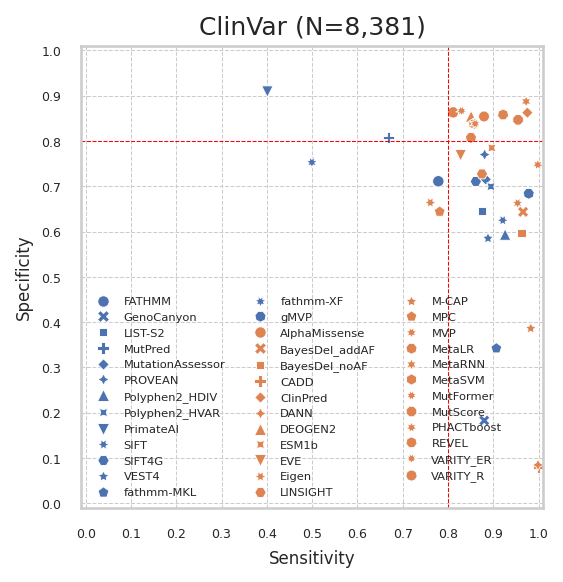

In [ ]:
para.update({'title':'ClinVar', 'png_fold':'03.result', 'png_file':'_sens_spec.png'})
plot_scatter_sens_spec(df_result, para)

### DEF: plot_roc_pr_curve_multi(_df_tool, _df_result, _df_score, _clnSig, _key, save_png, )

In [ ]:
from sklearn import metrics
from matplotlib.colors import LinearSegmentedColormap

In [ ]:
def plot_roc_pr_curve_multi(_df_tool, _df_result, _df_score, _clnSig, _key, save_png, ):
    _info = {'AUPRC_x':'Recall', 'AUPRC_y':'Precision', 'AUPRC_title':'Precision-Recall Curve','AUPRC_loc':'lower left',
             'AUC_x':'False Positive Rate', 'AUC_y':'True Positive Rate', 'AUC_title':'ROC Curve','AUC_loc':'lower right',
             }
    _notL = ['PolyPhen2_HDiv','SIFT4G','FATHMM-XF','FATHMM-MKL','GenoCanyon',
             'Eigen','MPC','DANN',]
    fig, ax = plt.subplots(figsize=(4, 4), dpi=150)
    #fig, ax = plt.subplots( dpi=150)

    _df_result = _df_result.sort_values(_key, ascending=False).reset_index(drop=True)
    for _i, _row in _df_result.iterrows():
        _tool = _row['Name']
        _value = _row[_key]

        _row1 = _df_tool[_df_tool['tool'] == _tool]
        _score = _row1['score'].values[0]
        _minus = _row1['minus'].values[0]

        if _tool in _notL:
            continue

        _tmp = _df_score[[_clnSig, _score]].copy().dropna(subset=[_score]).reset_index(drop=True)
        print("!!! ",_i, _tool, _score, _key, _value,
              _tmp[_tmp[_clnSig]==0][_score].shape, _tmp[_tmp[_clnSig]==1][_score].shape,)

        y = _tmp[_clnSig].values.reshape(-1,1)
        y_prob = _tmp[_score].values.reshape(-1,1)
        if _minus:
            y_prob = -y_prob

        _x, _y = None, None
        if _key == 'AUPRC':
            precision, recall, cut = precision_recall_curve(y, y_prob)
            _x = recall
            _y = precision
        elif _key == 'AUC':
            fpr, tpr, cut = roc_curve(y, y_prob)
            _x = fpr
            _y = tpr

        print("\t",metrics.auc(_x,_y))

        if _tool == 'PRP':
            ax.plot(_x,_y, label=f'{_tool} ({_value:.4f})', linewidth = 1, color='red')
        else:
            if _tool == 'PolyPhen2_HVar':
                _tool = 'PolyPhen2'
            ax.plot(_x,_y, label=f'{_tool} ({_value:.4f})', linewidth = 1)

    if _key == 'AUC':
        ax.plot([0, 1], [0, 1], linestyle='--', linewidth=0.5,color='lightgray' )

    ax.set_xlabel(_info[f'{_key}_x'], fontsize=8)
    ax.set_ylabel(_info[f'{_key}_y'], fontsize=8)
    #ax.set_title(_info[f'{_key}_title'], fontsize=12)
    ax.tick_params(labelsize=6)
    ax.grid(linestyle='--', linewidth=0.5, )#axis='y', )
    ax.legend(fontsize=6, loc=_info[f'{_key}_loc'], frameon=False, ncol=2,)

    # 축 범위 설정
    ax.set_xlim(-0.01, 1.01)  # x축 범위: 0~1
    ax.set_ylim(-0.01, 1.01)  # y축 범위: 0~1
    ax.set_aspect('equal', adjustable='box')  # 축 비율을 정사각형으로 맞춤

    plt.tight_layout()
    if save_png:
        plt.savefig(save_png, dpi=150)
        #plt.show()
        print("!!! save:", save_png)


!!!  0 PRP PRP_score AUC 0.9914 (43,) (239,)
	 0.9914371898413934
!!!  1 ClinPred ClinPred_score AUC 0.9768 (41,) (188,)
	 0.9767773741567203
!!!  2 MetaRNN MetaRNN_score AUC 0.9568 (41,) (183,)
	 0.9568172730907637
!!!  3 VARITY VARITY_R_score AUC 0.9495 (31,) (143,)
	 0.949469884953756
!!!  4 DEOGEN2 DEOGEN2_score AUC 0.9116 (31,) (143,)
	 0.911572298669073
!!!  5 CADD CADD_raw AUC 0.9081 (41,) (235,)
	 0.908147379346134
!!!  6 REVEL REVEL_score AUC 0.9041 (33,) (176,)
	 0.9040977961432507
!!!  7 VEST4 VEST4_score AUC 0.9017 (39,) (235,)
	 0.9017457719585379
!!!  8 MetaSVM MetaSVM_score AUC 0.8976 (41,) (183,)
	 0.897640943622551
!!!  9 gMVP gMVP_score AUC 0.8958 (24,) (74,)
	 0.8958333333333334
!!!  10 MutationAssessor MutationAssessor_score AUC 0.895 (32,) (139,)
	 0.8950089928057554
!!!  12 MutPred MutPred_score AUC 0.8934 (16,) (156,)
	 0.8934294871794872
!!!  14 PROVEAN PROVEAN_score AUC 0.8629 (34,) (178,)
	 0.8629378717779247
!!!  15 MetaLR MetaLR_score AUC 0.8596 (41,) (183,)

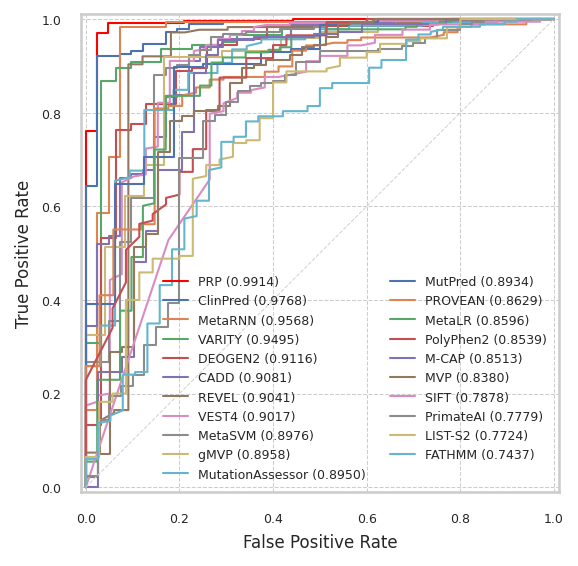

In [ ]:
_clnSig = 'clnSig2'
_key = 'AUC'
save_png = out_fold + f"/{_test}_performance_{_key}.png"
plot_roc_pr_curve_multi(df_tools, _result[_result['AF']==1], score, _clnSig, _key, save_png)

!!!  0 PRP PRP_score AUPRC 0.9984 (43,) (239,)
	 0.9983508943696453
!!!  1 ClinPred ClinPred_score AUPRC 0.9947 (41,) (188,)
	 0.9946565411837455
!!!  2 MutPred MutPred_score AUPRC 0.9864 (16,) (156,)
	 0.9863647946020286
!!!  3 VARITY VARITY_R_score AUPRC 0.9861 (31,) (143,)
	 0.9860248766385635
!!!  4 MetaRNN MetaRNN_score AUPRC 0.9846 (41,) (183,)
	 0.984507015941403
!!!  5 CADD CADD_raw AUPRC 0.9805 (41,) (235,)
	 0.9804401144975607
!!!  6 VEST4 VEST4_score AUPRC 0.9751 (39,) (235,)
	 0.9752363422549143
!!!  7 DEOGEN2 DEOGEN2_score AUPRC 0.9724 (31,) (143,)
	 0.9721889169513502
!!!  10 MutationAssessor MutationAssessor_score AUPRC 0.969 (32,) (139,)
	 0.9688327877684155
!!!  11 MetaSVM MetaSVM_score AUPRC 0.9682 (41,) (183,)
	 0.9680805862949527
!!!  12 PROVEAN PROVEAN_score AUPRC 0.968 (34,) (178,)
	 0.967855416076854
!!!  13 REVEL REVEL_score AUPRC 0.9633 (33,) (176,)
	 0.9629345316839472
!!!  14 gMVP gMVP_score AUPRC 0.9594 (24,) (74,)
	 0.9590142640331467
!!!  15 PolyPhen2_HVar

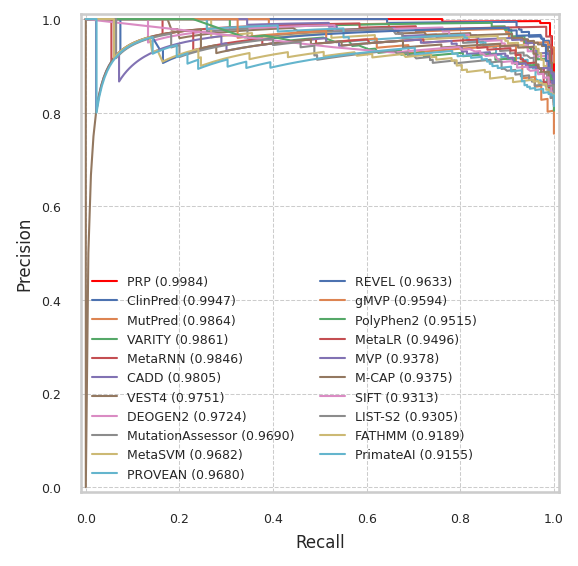

In [ ]:
_clnSig = 'clnSig2'
_key = 'AUPRC'
save_png = out_fold + f"/{_test}_performance_{_key}.png"
plot_roc_pr_curve_multi(df_tools, _result[_result['AF']==1], score, _clnSig, _key, save_png)

### Def: plot_pairGrid_8_performance(_df, _para)
*8metrics : pairGrid+stripplot

In [ ]:
from matplotlib.ticker import MultipleLocator

In [ ]:
# Make the PairGrid
def plot_pairGrid_8_performance(_df, _para):
    _png_fold = _para['png_fold']
    #_notL = ['PolyPhen2_HDiv','SIFT4G','FATHMM-XF','FATHMM-MKL','GenoCanyon',
    #         'Eigen','MPC','DANN',]
    _df = _df.sort_values("AUC", ascending=False).reset_index(drop=True)
    #_df = _df[~(_df['Name'].isin(_notL))].reset_index(drop=True)
    #_df['Name'] = _df['Name'].replace('PolyPhen2_HVar', 'PolyPhen2')

    #sns.set(style="whitegrid")
    colNames = ['AUC','AUPRC','Accuracy','F1-score','MCC','Precision','Recall','Specificity',]
    g = sns.PairGrid(_df,
                    x_vars=colNames, y_vars=["Name"],
                    height=6, aspect=.25)

    # Draw a dot plot using the stripplot function
    g.map(sns.stripplot, size=5, orient="h", jitter=False,
        palette='flare_r', linewidth=0.5, edgecolor="w")

    # Use the same x axis limits on all columns and add better labels
    g.set(#xlim=(0.0, 1.0),
        xlabel="",
        ylabel="")

    #for ax in g.axes.flat:
    #    ax.xaxis.set_major_locator(MultipleLocator(0.1))
    #    ax.set_xticks(np.arange(0, 1.1, 0.1))

    # Use semantically meaningful titles for the columns
    titles = colNames

    for ax, title in zip(g.axes.flat, titles):

        # Set a different title for each axes
        ax.set(title=title)

        # Make the grid horizontal instead of vertical
        ax.xaxis.grid( linewidth=0.5, )
        ax.yaxis.grid( linewidth=0.5, )

    sns.despine(left=True, bottom=True)
    plt.tight_layout()

    if _png_fold:
        _save_png = _png_fold + '/' + _para['name']+_para['png_file']
        print("!!! Save : ", _save_png)
        plt.savefig(_save_png, dpi=150)

    plt.show()


!!! Save :  03.result/clinvar2021_strip.png


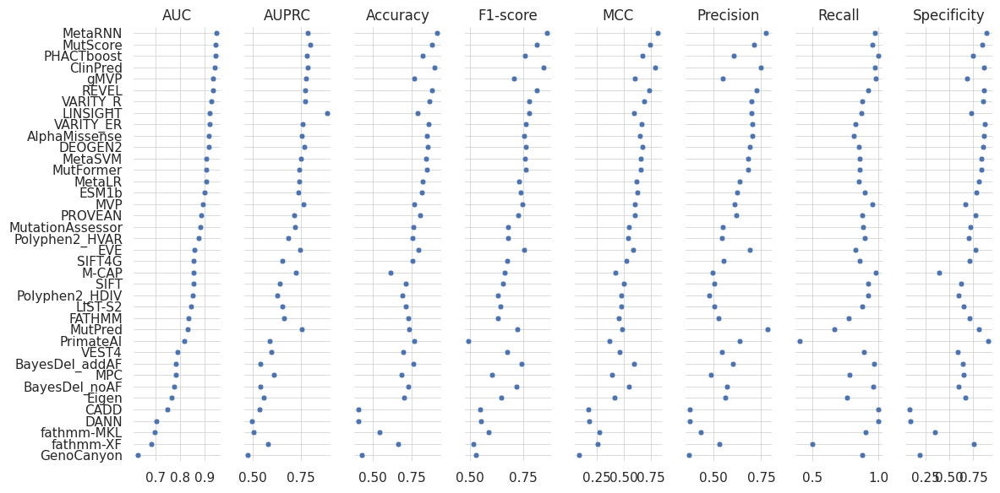

In [ ]:
para.update({'png_fold':'03.result', 'png_file':'_strip.png'})
plot_pairGrid_8_performance(df_result, para)

### Def : plot_missing_rate(_df_result, _para)
```
  _para['title']
```

In [ ]:
def plot_missing_rate(_df, _para):
    _title = _para['title']
    _png_fold = _para['png_fold']

    _df = _df.sort_values(by=['cat', 'Name']).reset_index(drop=True)
    _n = int(_df.loc[0,'N'] + _df.loc[0,'N_miss'])

    #_notL = ['PolyPhen2_HDiv','SIFT4G','FATHMM-XF','FATHMM-MKL','GenoCanyon',
    #         'Eigen','MPC','DANN',]
    #_df_result = _df_result[~(_df_result['Name'].isin(_notL))]
    #_df_result['Name'] = _df_result['Name'].replace('PolyPhen2_HVar', 'PolyPhen2')

    #plt.figure(1,1,figsize=(3, 3), dpi=150)
    plt.figure( dpi=150)
    #sns.set(style="whitegrid")
    ax = sns.barplot(data=_df, x="Missing Rate", y="Name", hue='cat',legend=False,
                    palette={0: 'red', 1: '#4C72B0', 2:'#DC814E'})

    for p in ax.patches:
        ax.annotate(f'{p.get_width() :.2f}%',
                    (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=8, color='black', xytext=(5, 0),
                    textcoords='offset points')

    plt.xlabel('Missing Rate (%)', fontsize=8)
    plt.ylabel('')
    plt.grid(axis='x', linestyle='--', linewidth=0.5)
    plt.xlim(0, 100)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.axvline(x=40, color='red', linestyle='--', linewidth=0.5)
    plt.title(f"{_title} (N={_n:,})", fontsize=12)

    if _png_fold:
        _save_png = _png_fold + '/' + _para['name']+_para['png_file']
        print("!!! Save : ", _save_png)
        plt.savefig(_save_png, dpi=150)

    plt.show()

!!! Save :  03.result/clinvar2021_missing.png


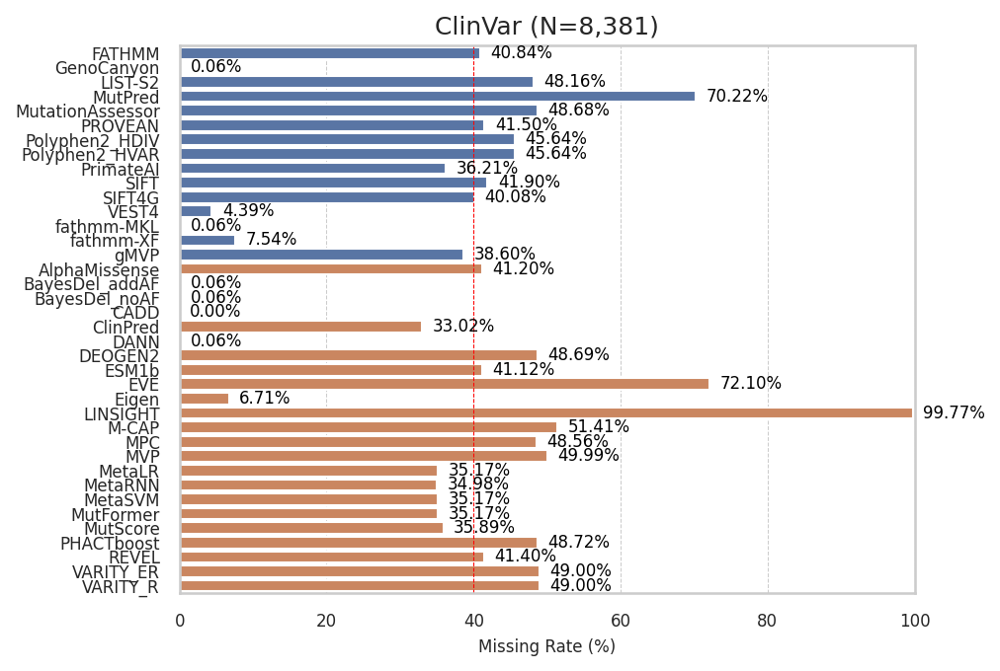

In [ ]:
para.update({'title':'ClinVar', 'png_fold':'03.result', 'png_file':'_missing.png'})
plot_missing_rate(df_result, para)

### Def: plot_missing_rate_varType(_df, _para)

In [ ]:
def cnt_catCol(_df, _col, _rename):
    _cnt = _df[_col].value_counts().reset_index()
    _cnt.columns = [_col, 'count']
    _cnt['rate'] = (_cnt['count'] / _df.shape[0]) * 100

    for _k in _cnt[_col].unique():
        _cnt.loc[_cnt[_col] == _k, f'{_col}1'] = _rename[_k]
    #display(_cnt)
    return _cnt

def _count(series):
    return (series == -9).sum()

def melt_miss_varType(_df, _result):
    _col = 'varType'
    _rename = {'m':'Missense','n':'StopGain','i':'StartLoss','t':'StopLoss'}
    _cnt = cnt_catCol(_df, _col, _rename)

    # missing
    _notL = ['PolyPhen2_HDiv','SIFT4G','FATHMM-XF','FATHMM-MKL','GenoCanyon',
             'Eigen','MPC','DANN',]
    colLists = list(_df.columns[2:])
    colLists = list(set(colLists) - set(_notL))

    _miss_var = _df.groupby(_col).apply(lambda x: x[colLists].apply(_count)).reset_index()
    #display(_miss_var.T.head())

    _melt = _miss_var.melt(id_vars=_col, var_name='column', value_name='count')
    #display(_melt.head())

    for _k in _melt[_col].unique():
        _melt.loc[_melt[_col] == _k, f'{_col}1'] = _rename[_k]

    _melt['total'] = None
    _melt['rate'] = None
    # Set the value of 'total' to 1 for rows where 'varType' is 'i'

    for idx, row in _cnt.iterrows():
        _melt.loc[_melt[_col] == row[_col], 'total'] = row['count']
        _melt.loc[_melt[_col] == row[_col], 'total'] = row['rate']
        _melt.loc[_melt[_col] == row[_col], 'missing_rate'] = (_melt.loc[_melt[_col] == row[_col],'count'] / row['count']) * 100
        _melt.loc[_melt[_col] == row[_col], 'full_rate'] = (100 - _melt.loc[_melt[_col] == row[_col], 'missing_rate'])
        _melt.loc[_melt[_col] == row[_col], 'total_rate'] = (_melt.loc[_melt[_col] == row[_col],'count'] / _df.shape[0]) * 100
    #display(_melt.head())

    _cat = dict(zip(_result['Name'], _result['cat']))
    for _k, _v in _cat.items():
        _melt.loc[_melt['column'] == _k, 'cat'] = _v
    _melt['cat']=_melt['cat'].astype('int')
    display(_melt.head())

    return _melt

In [ ]:
def plot_missing_rate_varType(_df, _para):
    _title = _para['title']
    _png_fold = _para['png_fold']
    _n = _para['n']

# cumulate bar chart - missing

    _pivot = _df.pivot(index=['cat','column'], columns='varType1', values='total_rate')
    #_pivot = _pivot[~(_pivot.index.get_level_values('column') == 'PRP')]
    #if prefix == 'uniprot':
     #   _pivot['StopGain']=0
      #  _pivot['StartLoss']=0
       # _pivot['StopLoss']=0

    #_pivot = _pivot[['Missense','StopGain','StartLoss','StopLoss']]
    _pivot = _pivot.fillna(0)
    _pivot = _pivot.sort_index(level=['cat', 'column'], ascending=[False, False])
    display(_pivot.head())

    plt.figure(figsize=(4, 3), dpi=150)
    # 가로형 스택형 막대 그래프 그리기
    ax = _pivot.plot(kind='barh', stacked=True)

    cumulative_sums = _pivot.sum(axis=1)

    # 누적 값 추가
    for index, (col, total) in enumerate(cumulative_sums.items()):
        ax.text(total, index, f'{total:.2f}%', ha='left', va='center', fontsize=10)


    #plt.legend(title='', bbox_to_anchor=(0, 0), loc='upper left',frameon=False,)  # 범례를 그래프 밖에 위치시킴
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4,frameon=False, fontsize=10)
    plt.legend(loc='lower right', ncol=1,frameon=False, fontsize=10)

    plt.xlabel('Missing Rate(%)', fontsize=10)
    plt.ylabel('')
    plt.title(f'{_title} (N={_n:,})', fontsize=12)
    plt.grid(axis='x',linestyle='--', linewidth=0.5)
    ax.grid(axis='y', visible=False)
    plt.xlim(0, 100)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    #plt.xticks([0,10,20,30,40,50,60,70,80,90,100],fontsize=10)
    ax.set_yticklabels(_pivot.index.get_level_values('column'),fontsize=10)
    #plt.axvline(x=40, color='red', linestyle='--', linewidth=0.5)
    plt.tight_layout()

    if _png_fold:
        _save_png = _png_fold + '/' + _para['name']+_para['png_file']
        print("!!! Save : ", _save_png)
        plt.savefig(_save_png, dpi=150)

    plt.show()

In [ ]:
df_melt = melt_miss_varType(df_pred, df_result)

<ipython-input-120-f40b3f28a889>:25: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,varType,column,count,varType1,total,rate,missing_rate,full_rate,total_rate,cat
0,i,MutScore,53,StartLoss,0.632383,None,100.000000,0.000000,0.632383,2
1,m,MutScore,23,Missense,64.383725,None,0.426242,99.573758,0.274430,2
2,n,MutScore,2927,StopGain,34.924233,None,100.000000,0.000000,34.924233,2
3,t,MutScore,5,StopLoss,0.059659,None,100.000000,0.000000,0.059659,2
4,i,ESM1b,3,StartLoss,0.632383,None,5.660377,94.339623,0.035795,2


varType1         Missense  StartLoss   StopGain  StopLoss
cat column                                               
2   VARITY_R    13.936284   0.083522  34.924233  0.059659
    VARITY_ER   13.936284   0.083522  34.924233  0.059659
    REVEL        6.299964   0.119318  34.924233  0.059659
    PHACTboost  13.661854   0.071591  34.924233  0.059659
    MutScore     0.274430   0.632383  34.924233  0.059659

!!! Save :  03.result/clinvar2021_missing_varType.png


<Figure size 600x450 with 0 Axes>

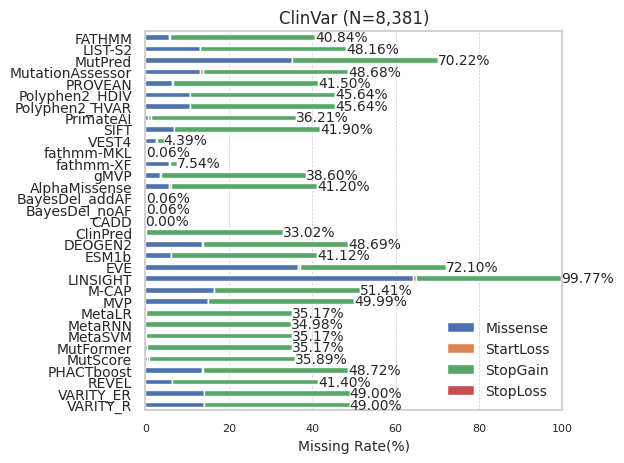

In [ ]:
para.update({'title':'ClinVar', 'png_fold':'03.result', 'png_file':'_missing_varType.png'})
para['n'] = df_pred.shape[0]
plot_missing_rate_varType(df_melt, para)

### Def : plot_bar_varType()

In [ ]:
def plot_bar_varType(_df, _para):
    _title = _para['title']
    _png_fold = _para['png_fold']

    _dict = {'m':'Missense','n':'StopGain','i':'StartLoss','t':'StopLoss'}
    _lists=[]
    _n = _df.shape[0]
    for _k,_v in _dict.items():
        _cnt = _df[_df['varType'] == _k].shape[0]
        _rate = 0
        if _cnt > 0:
            _rate = (_cnt / _n)*100
        _lists.append([_k, _v, _cnt, _rate])
    _df_var = pd.DataFrame(_lists, columns=['varType', 'varType1', 'count', 'rate'])
    display(_df_var)

    plt.figure(figsize=(3, 2), dpi=150)
    #plt.figure(dpi=150)
    plt.grid(axis='x', linestyle='--', linewidth=0.5)
    ax=sns.barplot(data=_df_var, x='rate', y='varType1',width=0.5, dodge=False)

    for p in ax.patches:
        if p.get_width() > 90:
            xPos = 75
        else:
            xPos = p.get_width()

        ax.annotate(f'{p.get_width() :.2f}%',
                    (xPos, p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=8, color='black', xytext=(5, 0),
                    textcoords='offset points')


    # Add title and labels
    plt.title(f"{_title} dataset (N={_n:,})", fontsize=12)
    plt.xlabel('Variant Rate (%)', fontsize=8)
    plt.ylabel('')
    plt.xlim(0, 100)
    plt.xticks(fontsize=8)
    plt.tick_params(axis='y', labelsize=8)

    if _png_fold:
        _save_png = _png_fold + '/' + _para['name']+_para['png_file']
        print("!!! Save : ", _save_png)
        plt.savefig(_save_png, dpi=150)

    plt.show()

,varType,varType1,count,rate
0,m,Missense,5396,64.383725
1,n,StopGain,2927,34.924233
2,i,StartLoss,53,0.632383
3,t,StopLoss,5,0.059659


!!! Save :  03.result/clinvar2021_varType.png


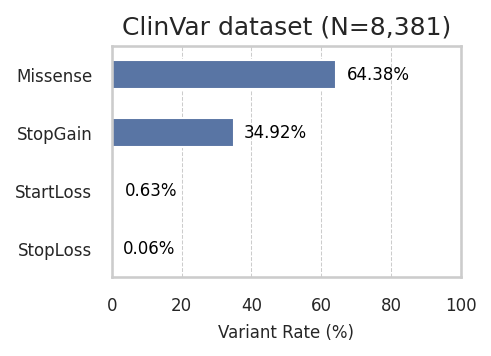

In [ ]:
para.update({'png_fold':'03.result', 'png_file':'_varType.png'})
plot_bar_varType(df_pred, para)

### def : plot_heatmap_score(_df, colList, title, save_png)

In [ ]:
def plot_heatmap_score(_df, colList, title, save_png):
    _round = 3
    fig, ax = plt.subplots(dpi=150)

    print("!!! plot: heatmap", _df.shape, save_png)
    cor = _df[colList].corr(method='spearman')
    sns.heatmap(cor, annot=True, annot_kws={"size": 4}, cmap='vlag', fmt=".2f", ax=ax) #"crest"

    ax.set_title(title, weight='bold', fontsize=12)
    ax.tick_params(axis='x', labelsize=5)
    ax.tick_params(axis='y', labelsize=5)

    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=6)

    plt.tight_layout()
    if save_png:
        plt.savefig(save_png)
        plt.close()
    plt.show()

In [ ]:
colList1 = []
colList2 = []
for _idx in df_tools.index:
    _score = df_tools.loc[_idx, 'score']
    _rankscore = df_tools.loc[_idx, 'score']
    colList1.append(_score)
    if _rankscore:
        colList2.append(_rankscore)

colLists = []
colLists.append(colList1)
colLists.append(colList2)

for i, colList in enumerate(colLists):
    print("!!! plot: ", i+1, colList)
    title = ''
    save_png = ''
    #save_png = out_fold + f'/{fold_name}_heatmap_{i+1}.png'
    plot_heatmap(score, colList, title, save_png)
    #break

### Def : plot_performance_AF():

In [126]:
def plot_line(_df,_afD,_colL):
    _df = _df.reset_index(drop=True)
    #_df['AF'] = _df['AF'].astype(str)
    display(_df.head(1))
    _df['AF'] = _df['AF'].replace(_afD)

    #_df.rename(columns={'Recall': 'Sensitivity'}, inplace=True)
    #_colL =_colL + ['Name','AF']
    df_long = pd.melt(_df[_colL + ['Name','AF']],
                    id_vars=['Name','AF'], var_name='Variable', value_name='Value')

    for _k in _colL:
        _tmp = df_long[df_long['Variable']==_k].reset_index(drop=True)
        display(_tmp.sort_values('Value', ascending=True).head())

        plt.figure(figsize=(4, 3), dpi=150)
        sns.lineplot(data=_tmp, x="AF", y="Value",hue="Name",marker="o")
        #plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
        #plt.legend(loc='lower left', bbox_to_anchor=(0, 0))
        plt.legend(fontsize=8,frameon=False,ncol=3)
        #plt.title(f'Train {_set[0]} {ml_name}')
        plt.xlabel('AF',fontsize=8)
        plt.ylabel(_k, fontsize=8)
        plt.ylim(0.7,1.01)
        plt.xticks(fontsize=8)
        plt.yticks(fontsize=8)

        plt.grid(linestyle='--', linewidth=0.5)
        plt.show()


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,ClinPred,0.5,2,0.9403,0.7874,0.8958,0.8466,0.7853,0.7479,0.9752,0.8626,0.9172,0.7479,0.9881,0.0248,0.1374,3415.0,544.0,41.0,1614.0,5614.0,2767.0,1419.0,1348.0,33.015153,1.0


,Name,AF,Variable,Value
14,REVEL,< 0.0001,Accuracy,0.8258
12,ClinPred,< 0.0001,Accuracy,0.8301
11,REVEL,< 0.0005,Accuracy,0.8416
5,REVEL,< 0.001,Accuracy,0.8448
8,REVEL,< 0.005,Accuracy,0.8508


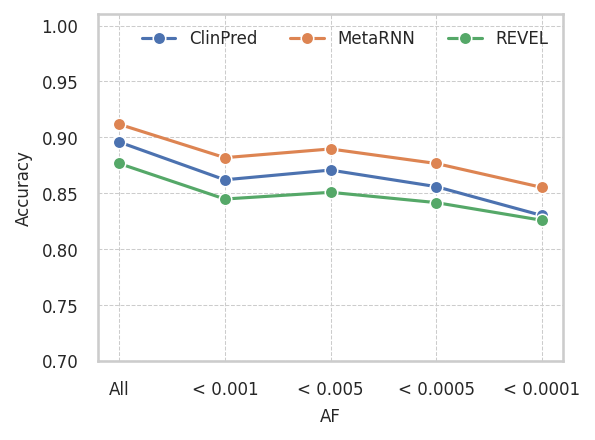

,Name,AF,Variable,Value
12,ClinPred,< 0.0001,AUC,0.8638
14,REVEL,< 0.0001,AUC,0.8642
13,MetaRNN,< 0.0001,AUC,0.8747
11,REVEL,< 0.0005,AUC,0.8956
5,REVEL,< 0.001,AUC,0.9013


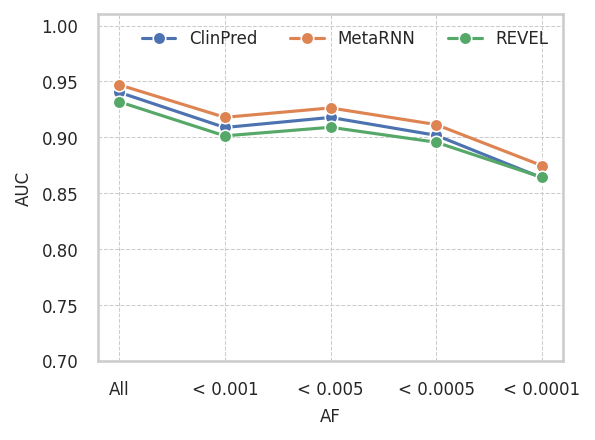

,Name,AF,Variable,Value
12,ClinPred,< 0.0001,G-mean,0.8198
14,REVEL,< 0.0001,G-mean,0.8217
13,MetaRNN,< 0.0001,G-mean,0.8497
11,REVEL,< 0.0005,G-mean,0.8516
5,REVEL,< 0.001,G-mean,0.8566


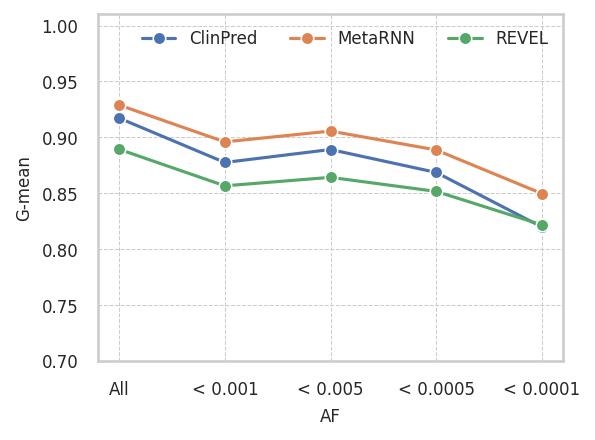

In [127]:
_colL = ['Accuracy','F1-score','MCC','Precision','Recall','Specificity','AUC','AUPRC',
             'G-mean']
_colL = ['Accuracy','AUC','G-mean']
_toolL = ['ClinPred','MetaRNN','REVEL']
_afD = {1:'All', 0.005:'< 0.005',0.001:'< 0.001', 0.0005:'< 0.0005',0.0001:'< 0.0001'}
_afL = _afD.keys()
_tmp = df_result[(df_result['Name'].isin(_toolL)) & (df_result['AF'].isin(_afL))]

plot_line(_tmp,_afD,_colL )

In [47]:
def plot_bar_AF(_df,_colL):
    _df = _df.sort_values(['AF',"AUC"], ascending=False).reset_index(drop=True)
    _df['AF'] = _df['AF'].astype(str)

    _dict = {'1.0':'All', '0.001':'< 0.001', '0.0003':'< 0.0003','0.0001':'< 0.0001'}
    _df['AF'] = _df['AF'].replace(_dict)

    for _k in _colL:
        plt.figure(figsize=(3, 1.5), dpi=150)
        sns.barplot(data=_df, x="Name", y=_k, hue="AF", width=0.6)
        plt.xlabel('')
        plt.ylabel(_k,fontsize=8)
        plt.xticks(fontsize=7)
        plt.yticks([0.5,0.6,0.7,0.8,0.9,1],fontsize=6)
        plt.ylim(0.5, 1.09)
        plt.legend(loc='upper center',fontsize=6, frameon=False, ncol=4)
        plt.grid(axis='y', linestyle='--', linewidth=0.5)
        plt.show()

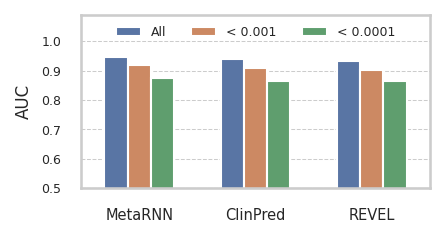

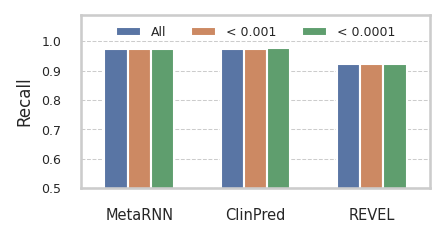

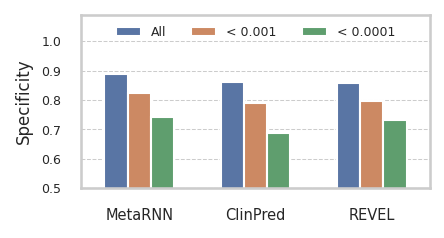

In [129]:
_colL = ['Accuracy','F1-score','MCC','Precision','Recall','Specificity','AUC','AUPRC',
             'G-mean']
_colL = ['AUC','Recall','Specificity']
_toolL = ['ClinPred','MetaRNN','REVEL']
_afL = [1,0.001,0.0001]
_tmp = df_result[(df_result['Name'].isin(_toolL)) & (df_result['AF'].isin(_afL))]
plot_bar_AF(_tmp, _colL)

In [130]:
def plot_scatter_sens_spec(_df, _title):
    _df = _df.sort_values(by=['cat', 'Name']).reset_index(drop=True)
    _n = int(df_result.loc[0,'N'] + df_result.loc[0,'N_miss'])
    #_n = int(_df.loc[_df['Name']=='PRP', 'N'].values[0])

    #_notL = ['PolyPhen2_HDiv','SIFT4G','MPC','DANN','FATHMM-XF','FATHMM-MKL','GenoCanyon','PROVEAN']
    #_df = _df[~(_df['Name'].isin(_notL))].reset_index(drop=True)
    #_df['Name'] = _df['Name'].replace('PolyPhen2_HVar', 'PolyPhen2')

    sns.set(style="whitegrid")
    #plt.figure(figsize=(4, 4),dpi=150)
    fig, ax = plt.subplots(figsize=(2, 2), dpi=150)
    _s = 20
    #sns.scatterplot(data=_df[_df['cat']==0], x="Recall", y="Specificity", style="Name", color='red', s=_s)
    #sns.scatterplot(data=_df[_df['cat']==1], x="Recall", y="Specificity", style="Name", s=_s)
    sns.scatterplot(data=_df, x="Recall", y="Specificity", style="Name", s=_s)

    plt.xlim(0.49, 1.01)
    plt.ylim(0.49, 1.01)
    #plt.legend(bbox_to_anchor=(1, 1.01), loc='upper left',frameon=False, fontsize=6)
    legend = plt.legend( loc='lower left',frameon=False, fontsize=5.5)
    #legend.get_frame().set_facecolor('white')  # Set background color to white
    #legend.get_frame().set_edgecolor('white')  # Optionally, set border color
    #legend.get_frame().set_alpha(0.1)  # Make the background fully opaque


    #plt.title(f'{_title} (N={_n:,})', fontsize=12)
    plt.grid(linestyle='--',linewidth=0.5)
    #plt.gca().xaxis.set_major_locator(plt.MultipleLocator(0.1))
    #plt.gca().yaxis.set_major_locator(plt.MultipleLocator(0.1))
    plt.axvline(x=0.8, color='red', linestyle='--', linewidth=0.5)
    plt.axhline(y=0.8, color='red', linestyle='--', linewidth=0.5)
    plt.xlabel('Sensitivity', fontsize=8)
    plt.ylabel('Specificity', fontsize=8)
    plt.xticks([0.5,0.6,0.7,0.8,0.9,1.0],fontsize=6)
    plt.yticks([0.5,0.6,0.7,0.8,0.9,1.0],fontsize=6)
    ax.set_aspect('equal', adjustable='box')  # 축 비율을 정사각형으로 맞춤
    plt.show()

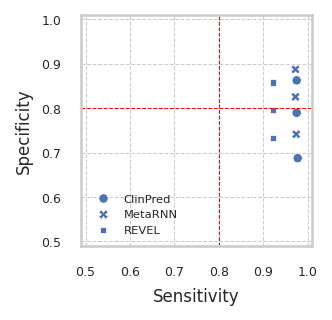

In [131]:
_colL = ['Accuracy','F1-score','MCC','Precision','Recall','Specificity','AUC','AUPRC',
             'G-mean']
_toolL = ['ClinPred','MetaRNN','REVEL']
_afL = [1,0.001,0.0001]
_tmp = df_result[(df_result['Name'].isin(_toolL)) & (df_result['AF'].isin(_afL))]

plot_scatter_sens_spec(_tmp, None)

### DEF: plot_scatter_sens_spec_auc_3d(_df, _title)

In [55]:
from mpl_toolkits.mplot3d import Axes3D
from itertools import cycle
sns.set(style="whitegrid")

In [116]:
def plot_scatter_sens_spec_auc_3d(_df, _afD, _colL):
    _df = _df.sort_values(['AF','AUC'],ascending=False).reset_index(drop=True)
    _df['AF'] = _df['AF'].replace(_afD)
    print(_df[_colL[0]].min(),_df[_colL[1]].min(),_df[_colL[2]].min())
    _toolL = _df['Name'].unique()
    _afL = _df['AF'].unique()
    # 색상 및 마커 리스트
    _cL = plt.cm.tab10.colors  # 10가지 기본 색상
    _mL = ['o', 's', '^', 'D', 'P', '*', 'X', 'v', '<', '>']

    # 색상과 마커를 순환적으로 사용
    _cCycle = cycle(_cL)
    _mCycle = cycle(_mL)

    # d컬럼의 고유값에 따라 색상을 매핑
    _cMap = {_tool: next(_cCycle) for _tool in _toolL}

    # e컬럼의 고유값에 따라 마커를 매핑
    _mMap = {_af: next(_mCycle) for _af in _afL}

    # 3D 플롯 설정
    fig = plt.figure(figsize=(3, 3), dpi=150)
    ax = fig.add_subplot(111, projection='3d')

    # 데이터 그룹별로 분리하여 플롯
    for _tool in _toolL:
        for _af in _afL:
            _tmp = _df[(_df['Name'] == _tool) & (_df['AF'] == _af)]
            ax.scatter(_tmp[_colL[0]], _tmp[_colL[1]], _tmp[_colL[2]],
                       color=_cMap[_tool], marker=_mMap[_af], s=10)

    _cLegend = [
        plt.Line2D([0], [0], marker='o', color=_cMap[_tool],
                   linestyle='', label=_tool)
        for _tool in _toolL
    ]

    _mLegend = [
        plt.Line2D([0], [0], marker=_mMap[_af], color='gray',
                   linestyle='', label=_af)
        for _af in _afL
    ]

    # 범례 추가
    legend = ax.legend(handles=_cLegend,
                        loc='lower left', ncol=1, fontsize=6, frameon=False,
                        bbox_to_anchor=(0.05, 0.22), markerscale=0.5)
    ax.add_artist(legend)
    legend2 = ax.legend(handles=_mLegend,
                        loc='lower left', ncol=1, fontsize=6, frameon=False,
                        bbox_to_anchor=(0.3, 0.22), markerscale=0.5,)
    ax.add_artist(legend2)


    # 축 레이블
    ax.set_xlabel(_colL[0], fontsize=8)
    ax.set_ylabel(_colL[1], fontsize=8)
    ax.set_zlabel(_colL[2], fontsize=8)  # 회전각도를 90도로 설정

    #_x, _y, _z, _w = 0.86, 1.0, 5, 0.05
    _x, _y, _z, _w = 0.6, 1.0, 5, 0.1
    ax.set_xlim(_x, _y)
    ax.set_ylim(_x, _y)
    ax.set_zlim(_x, _y)

    _range = [i * _w + _x for i in range(_z)]
    plt.xticks(_range,fontsize=6)
    plt.yticks(_range,fontsize=6)
    ax.set_zticks(_range)  # 0.8부터 1까지 0.05 단위로 설정
    ax.set_zticklabels([f'{i:.2f}' for i in ax.get_zticks()], fontsize=6)

    ax.xaxis._axinfo['grid'].update(linewidth=0.5, linestyle="--")
    ax.yaxis._axinfo['grid'].update(linewidth=0.5, linestyle="--")
    ax.zaxis._axinfo['grid'].update(linewidth=0.5, linestyle="--")

    plt.tight_layout()
    plt.show()

0.9216 0.6875 0.8638


<ipython-input-116-18fb87febb8f>:76: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


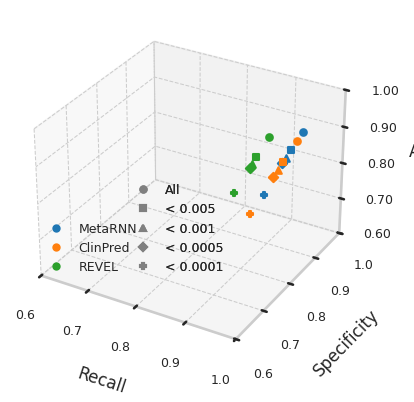

In [124]:
_colL = ['Accuracy','F1-score','MCC','Precision','Recall','Specificity','AUC','AUPRC',
             'G-mean']
_colL = ['Recall','Specificity','AUC']
_toolL = ['ClinPred','MetaRNN','REVEL']
_afD = {1:'All', 0.005:'< 0.005',0.001:'< 0.001', 0.0005:'< 0.0005',0.0001:'< 0.0001'}
_afL = _afD.keys()
_tmp = df_result[(df_result['Name'].isin(_toolL)) & (df_result['AF'].isin(_afL))]

plot_scatter_sens_spec_auc_3d(_tmp, _afD, _colL)

#==================================================

# [NotUse] Ploty: roc
* https://plotly.com/python/roc-and-pr-curves/

In [ ]:
import plotly.graph_objects as go
import plotly.express as px

In [ ]:
fig = go.Figure()
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

for i in _result.sort_values('AUC', ascending=False).index:
    tool_name = _result.loc[i,'Name']
    name_score = names[tool_name]
    auc = _result.loc[i,'AUC']
    print(i+1, tool_name, name_score, auc, df[df['clnSig2']==0][name_score].shape, df[df['clnSig2']==1][name_score].shape,)

    _tmp = df[['clnSig2', name_score]].copy()
    _tmp.dropna(subset=[name_score], inplace=True)

    if tool_name in minus:
        _tmp[name_score] = -_tmp[name_score]

    y = _tmp['clnSig2'].values.reshape(-1,1)
    y_prob = _tmp[name_score].values.reshape(-1,1)

    fpr, tpr, cut = roc_curve(y, y_prob)
    #print(metrics.auc(fpr, tpr))
    if tool_name in change_name.keys():
        tool_name = change_name[tool_name]
    #ax.plot(fpr, tpr, label=f'{tool_name}={auc:.4f}', linewidth = 1)
    _legend_name = f'{tool_name}={auc:.4f}'
    fig.add_trace(go.Scatter(x=fpr, y=tpr, name=_legend_name, mode='lines'))
fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    #yaxis=dict(scaleanchor="x", scaleratio=1),
    #xaxis=dict(constrain='domain'),
    width=700, height=500
)
fig.show()



1 PRP PRP_score 0.9889 (121,) (400,)
12 MetaRNN MetaRNN_score 0.9744 (121,) (400,)
21 ClinPred ClinPred_score 0.9702 (121,) (400,)
14 REVEL REVEL_score 0.9446 (121,) (400,)
15 MutPred MutPred_score 0.93 (121,) (400,)
10 MetaSVM MetaSVM_score 0.9243 (121,) (400,)
17 gMVP gMVP_score 0.9203 (121,) (400,)
20 DEOGEN2 DEOGEN2_score 0.9184 (121,) (400,)
9 VEST4 VEST4_score 0.908 (121,) (400,)
11 MetaLR MetaLR_score 0.9059 (121,) (400,)
23 CADD_raw CADD_raw 0.8879 (121,) (400,)
3 SIFT4G SIFT4G_score 0.8847 (121,) (400,)
13 M-CAP M-CAP_score 0.8838 (121,) (400,)
6 MutationAssessor MutationAssessor_score 0.8774 (121,) (400,)
16 MVP MVP_score 0.8671 (121,) (400,)
8 PROVEAN PROVEAN_score 0.8659 (121,) (400,)
5 Polyphen2_HVAR Polyphen2_HVAR_score 0.8593 (121,) (400,)
4 Polyphen2_HDIV Polyphen2_HDIV_score 0.8485 (121,) (400,)
7 FATHMM FATHMM_score 0.8282 (121,) (400,)
2 SIFT SIFT_score 0.8172 (121,) (400,)
22 LIST-S2 LIST-S2_score 0.8064 (121,) (400,)
26 fathmm-XF_coding fathmm-XF_coding_score 0.774

# [NotUse] Ploty: pr

In [ ]:
fig = go.Figure()
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)

col_name = 'AUPRC'
for i in _result.sort_values(col_name, ascending=False).index:
    tool_name = _result.loc[i,'Name']
    name_score = names[tool_name]
    score = _result.loc[i,col_name]
    print(i+1, tool_name, name_score, score, df[df['clnSig2']==0][name_score].shape, df[df['clnSig2']==1][name_score].shape,)

    _tmp = df[['clnSig2', name_score]].copy()
    _tmp.dropna(subset=[name_score], inplace=True)

    if tool_name in minus:
        _tmp[name_score] = -_tmp[name_score]

    y = _tmp['clnSig2'].values.reshape(-1,1)
    y_prob = _tmp[name_score].values.reshape(-1,1)

    precision, recall, cut = precision_recall_curve(y, y_prob)
    #print(metrics.auc(precision, recall))
    if tool_name in change_name.keys():
        tool_name = change_name[tool_name]
    _legend_name = f'{tool_name}={score:.4f}'
    fig.add_trace(go.Scatter(x=recall, y=precision, name=_legend_name, mode='lines'))

fig.update_layout(
    xaxis_title='Recall',
    yaxis_title='Precision',
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    width=700, height=500
)
fig.show()


1 PRP PRP_score 0.9965 (121,) (400,)
12 MetaRNN MetaRNN_score 0.9875 (121,) (400,)
21 ClinPred ClinPred_score 0.9874 (121,) (400,)
15 MutPred MutPred_score 0.9869 (121,) (400,)
9 VEST4 VEST4_score 0.9655 (121,) (400,)
14 REVEL REVEL_score 0.9648 (121,) (400,)
20 DEOGEN2 DEOGEN2_score 0.9631 (121,) (400,)
23 CADD_raw CADD_raw 0.9592 (121,) (400,)
10 MetaSVM MetaSVM_score 0.9573 (121,) (400,)
17 gMVP gMVP_score 0.9528 (121,) (400,)
11 MetaLR MetaLR_score 0.9508 (121,) (400,)
6 MutationAssessor MutationAssessor_score 0.9466 (121,) (400,)
8 PROVEAN PROVEAN_score 0.9447 (121,) (400,)
3 SIFT4G SIFT4G_score 0.9418 (121,) (400,)
13 M-CAP M-CAP_score 0.9283 (121,) (400,)
22 LIST-S2 LIST-S2_score 0.9206 (121,) (400,)
16 MVP MVP_score 0.9196 (121,) (400,)
7 FATHMM FATHMM_score 0.9184 (121,) (400,)
5 Polyphen2_HVAR Polyphen2_HVAR_score 0.9184 (121,) (400,)
2 SIFT SIFT_score 0.9145 (121,) (400,)
26 fathmm-XF_coding fathmm-XF_coding_score 0.9123 (121,) (400,)
4 Polyphen2_HDIV Polyphen2_HDIV_score 0.

#==================================================

In [ ]:
_result['with'] = 'within'
_result.loc[len(_result)] = ['FATHMM',0.5,0.9,0.9,0.9,0.9,0.9,0.9,0.9,0.9,0.9,0.9,0.9,0.9,
                             100,100,100,100,100,100,100,100,
                             'without']
_result.head()

,Name,Cutoff,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1,with
0,PRP,0.500,0.9988,0.9985,0.9885,0.9873,0.9768,0.9903,0.9843,0.9920,0.9903,0.9870,0.0157,0.0080,2967.0,24.0,39.0,2450.0,5480.0,0.0,0.0,0.0,within
1,SIFT,0.051,0.9049,0.8600,0.8000,0.7986,0.6237,0.7120,0.9092,0.7155,0.7120,0.9106,0.0908,0.2845,1884.0,749.0,185.0,1852.0,4670.0,810.0,358.0,452.0,within
2,SIFT4G,0.050,0.8918,0.8392,0.8137,0.8030,0.6336,0.7499,0.8641,0.7742,0.7499,0.8791,0.1359,0.2258,2116.0,617.0,291.0,1850.0,4874.0,606.0,258.0,348.0,within
3,PolyPhen2_HDiv,0.452,0.8869,0.8243,0.7929,0.8002,0.6186,0.7031,0.9286,0.6834,0.7031,0.9222,0.0714,0.3166,1813.0,840.0,153.0,1989.0,4795.0,685.0,338.0,347.0,within
4,PolyPhen2_HVar,0.446,0.9071,0.8688,0.8275,0.8210,0.6628,0.7652,0.8856,0.7806,0.7652,0.8942,0.1144,0.2194,2071.0,582.0,245.0,1897.0,4795.0,685.0,338.0,347.0,within


#category feature:pairGrid+stripplot+hue

In [ ]:
inFile = 'compare_feature.csv'
print(inFile)
feature=pd.read_csv(inFile, sep="\t", index_col = False, low_memory=False)
print("ori", feature.shape)
display(feature.head(5))


feature_minus_performance_prp.csv
ori (31, 18)


,Feature,thres,Accuracy,F1,MCC,Precision,Recall(=Sens),Specificity,AUC,AUCPR,PPV,NPV,FNR,FPR,TN,FP,FN,TP
0,all,0.5,0.9868,0.9880,0.9733,0.9889,0.9872,0.9863,0.9989,0.9991,0.9889,0.9843,0.0128,0.0137,21207,294,338,26077
1,CFref,0.5,0.9867,0.9880,0.9732,0.9888,0.9871,0.9862,0.9988,0.9991,0.9888,0.9842,0.0129,0.0138,21205,296,340,26075
2,CFalt,0.5,0.9864,0.9877,0.9726,0.9885,0.9868,0.9860,0.9988,0.9991,0.9885,0.9838,0.0132,0.0140,21199,302,348,26067
3,codonST,0.5,0.9869,0.9881,0.9736,0.9888,0.9874,0.9863,0.9988,0.9991,0.9888,0.9846,0.0126,0.0137,21206,295,332,26083
4,aaST,0.5,0.9866,0.9878,0.9729,0.9885,0.9871,0.9859,0.9989,0.9991,0.9885,0.9842,0.0129,0.0141,21198,303,340,26075


In [ ]:
change_col = {'F1':'F1-score', 'Recall(=Sens)':'Recall', 'Spec':'Specificity', 'AUCPR':'AUPRC'}
feature = feature.rename(columns=change_col)
feature.head()

,Feature,thres,Accuracy,F1-score,MCC,Precision,Recall,Specificity,AUC,AUPRC,PPV,NPV,FNR,FPR,TN,FP,FN,TP
0,all,0.5,0.9868,0.9880,0.9733,0.9889,0.9872,0.9863,0.9989,0.9991,0.9889,0.9843,0.0128,0.0137,21207,294,338,26077
1,CFref,0.5,0.9867,0.9880,0.9732,0.9888,0.9871,0.9862,0.9988,0.9991,0.9888,0.9842,0.0129,0.0138,21205,296,340,26075
2,CFalt,0.5,0.9864,0.9877,0.9726,0.9885,0.9868,0.9860,0.9988,0.9991,0.9885,0.9838,0.0132,0.0140,21199,302,348,26067
3,codonST,0.5,0.9869,0.9881,0.9736,0.9888,0.9874,0.9863,0.9988,0.9991,0.9888,0.9846,0.0126,0.0137,21206,295,332,26083
4,aaST,0.5,0.9866,0.9878,0.9729,0.9885,0.9871,0.9859,0.9989,0.9991,0.9885,0.9842,0.0129,0.0141,21198,303,340,26075


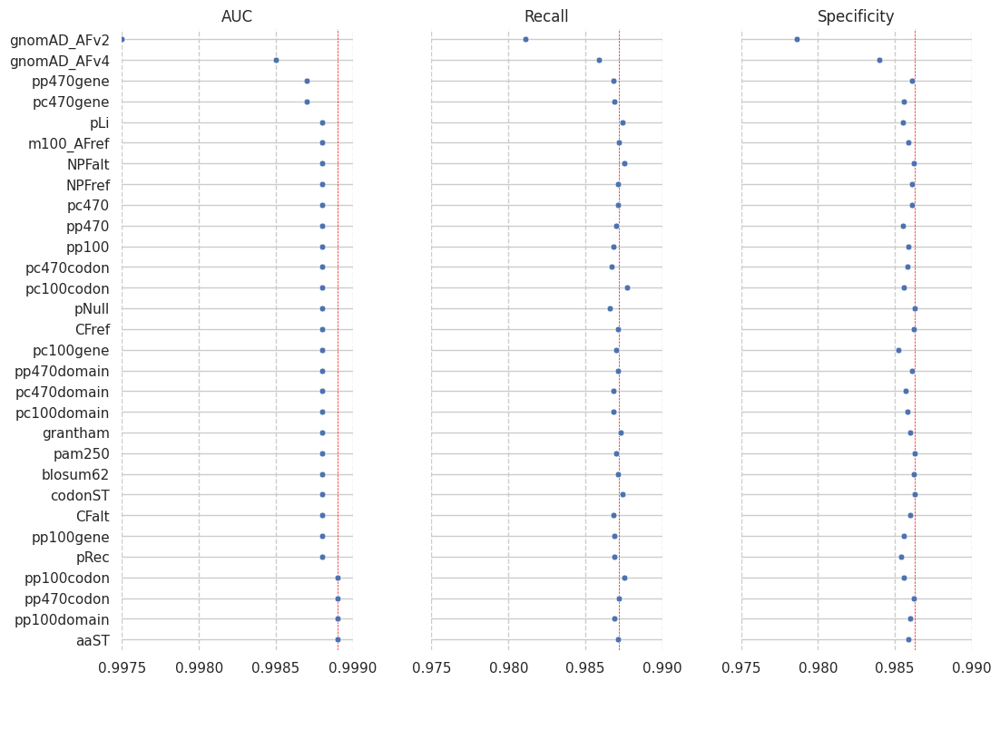

In [ ]:
# Make the PairGrid
from matplotlib.ticker import MultipleLocator
sns.set(style="whitegrid")

#colNames = ['AUC','AUPRC','Accuracy','F1-score','MCC','Precision','Recall','Specificity',]
colNames = ['AUC','Recall','Specificity',]
g = sns.PairGrid(feature[~feature['Feature'].isin(['all', 'AF', 'conservation'])].sort_values("AUC", ascending=True),
                 x_vars=colNames, y_vars=["Feature"], #hue='with',
                 height=6, aspect=.25)

# Draw a dot plot using the stripplot function
g.map(sns.stripplot, size=5, orient="h", jitter=False,
      palette="flare_r", linewidth=0.5, edgecolor="w")

# Use the same x axis limits on all columns and add better labels
g.set(xlim=(0.970, 1.0),
      xlabel="",
      ylabel="")

#for ax in g.axes.flat:
#    ax.xaxis.set_major_locator(MultipleLocator(0.1))
#    ax.set_xticks(np.arange(0, 1.1, 0.1))

# Use semantically meaningful titles for the columns
titles = colNames

for ax, title in zip(g.axes.flat, titles):
    ax.set(title=title)
    if title == 'AUC':
        ax.set_xlim(0.9975, 0.9990)
        #ax.set_xticks([0.9975, 0.9980, 0.9985, 0.9990])
    elif title == 'Recall':
        ax.set_xlim(0.98, 0.988)
        ax.set_xticks([0.975, 0.980, 0.985, 0.990])
    elif title == 'Specificity':
        ax.set_xlim(0.976, 0.988)
        ax.set_xticks([0.975, 0.980, 0.985, 0.990])

    # Make the grid horizontal instead of vertical
    ax.xaxis.grid(True, linestyle='--')
    ax.yaxis.grid(True, )
    x_v = feature[feature['Feature'] == 'all'][title].values[0]
    ax.axvline(x=x_v, color='red', linestyle='--', linewidth=0.5)

#g.add_legend()
g.fig.set_size_inches(12, 8)
plt.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=2,frameon=False,)
sns.despine(left=True, bottom=True)

In [ ]:
a=pd.melt(feature, id_vars=['Feature'],var_name='Variable', value_name='Value')
display(a.head())

all_v = a[a['Feature'] == 'all'].set_index('Variable')['Value'].to_dict()
a['all_v'] = a['Variable'].map(all_v)
a['delta'] = a['Value'] - a['all_v']
print(a.head())

,Feature,Variable,Value
0,all,thres,0.5
1,CFref,thres,0.5
2,CFalt,thres,0.5
3,codonST,thres,0.5
4,aaST,thres,0.5


   Feature Variable  Value  all_v  delta
0      all    thres    0.5    0.5    0.0
1    CFref    thres    0.5    0.5    0.0
2    CFalt    thres    0.5    0.5    0.0
3  codonST    thres    0.5    0.5    0.0
4     aaST    thres    0.5    0.5    0.0


<ipython-input-24-9a18f87c8764>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-24-9a18f87c8764>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 AUC 0.9989
1 AUPRC 0.9991


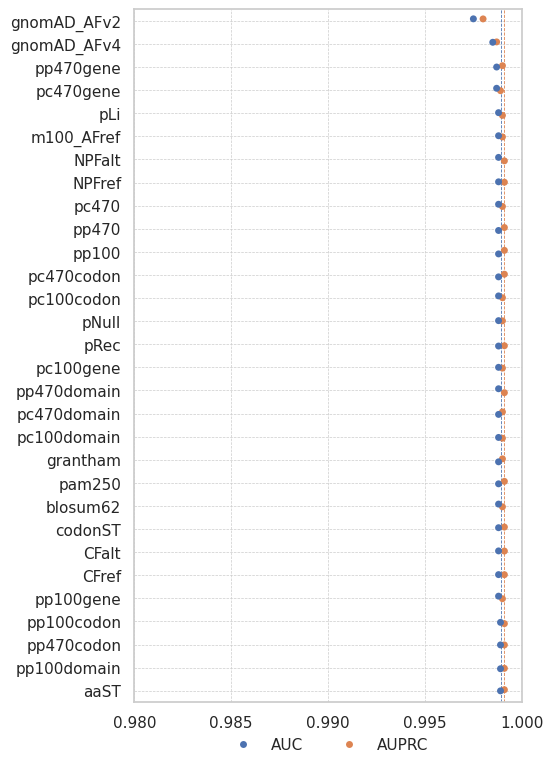

In [ ]:
colName = ['AUC', 'AUPRC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x='Value',y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(0.98,1.0)
#plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-199-0a3a72fe27e1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-199-0a3a72fe27e1>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Recall 0.9877
1 Specificity 0.9859
2 Precision 0.9885


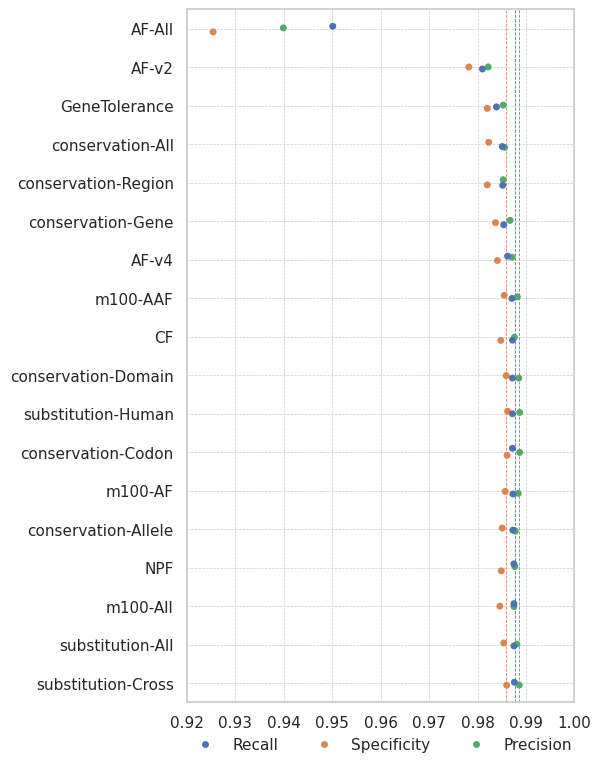

In [ ]:
colName = ['Recall', 'Specificity', 'Precision']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x='Value',y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(0.92,1.0)
#plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-200-b078d9ef53d3>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-200-b078d9ef53d3>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Accuracy 0.9869
1 F1-score 0.9881
2 MCC 0.9735


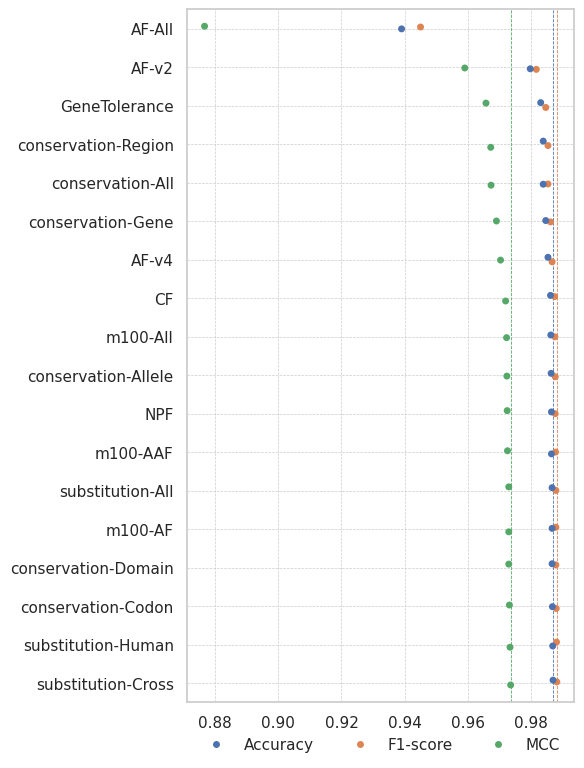

In [ ]:
colName = ['Accuracy', 'F1-score', 'MCC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x='Value',y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

#plt.xlim(0.93,1.0)
#plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

# delta

In [ ]:
value_col = 'delta'
colName = ['AUC','AUPRC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values(value_col, ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
custom_order = [item for item in custom_order if item != 'AF-All']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x=value_col,y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

#plt.xlim(0.93,1.0)
plt.xticks(fontsize=10)

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])][value_col].values[0]
    #plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-219-f97eebc3654f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-219-f97eebc3654f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Recall 0.0
1 Specificity 0.0
2 Precision 0.0


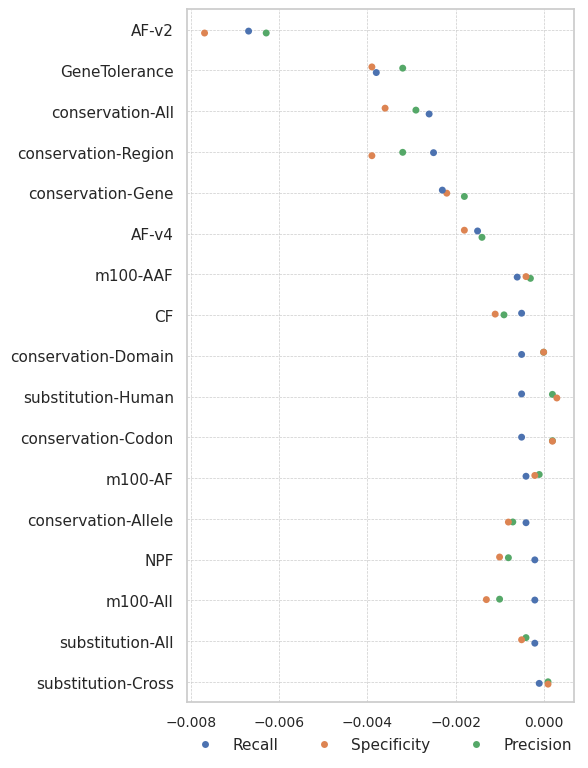

In [ ]:
value_col = 'delta'
colName = ['Recall', 'Specificity', 'Precision']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values(value_col, ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
custom_order = [item for item in custom_order if item != 'AF-All']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x=value_col,y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

#plt.xlim(0.93,1.0)
plt.xticks(fontsize=10)

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])][value_col].values[0]
    #plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-220-2035a8830367>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-220-2035a8830367>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Accuracy 0.0
1 F1-score 0.0
2 MCC 0.0


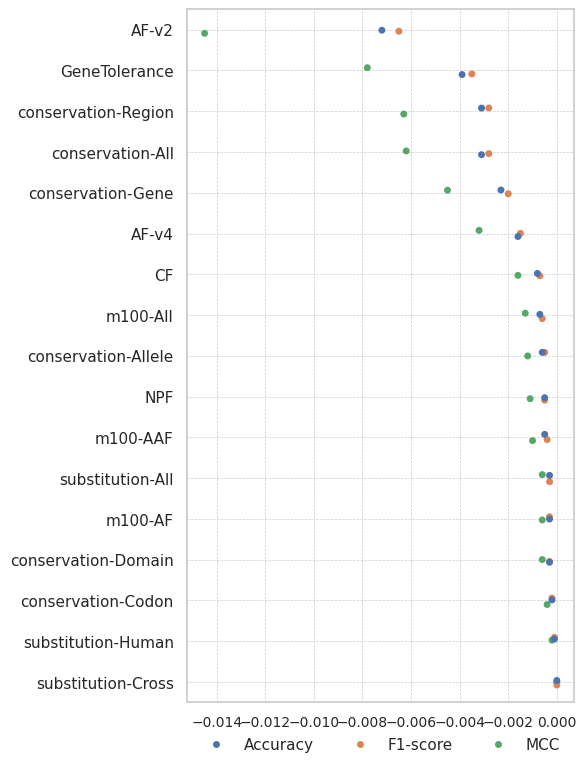

In [ ]:
value_col = 'delta'
colName = ['Accuracy', 'F1-score', 'MCC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values(value_col, ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
custom_order = [item for item in custom_order if item != 'AF-All']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x=value_col,y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

#plt.xlim(0.93,1.0)
plt.xticks(fontsize=10)

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])][value_col].values[0]
    #plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

# single feature

In [ ]:
#inFile = 'feature_single_performance.csv'
inFile = 'feature_single_performance_prp.csv'
print(inFile)
feature=pd.read_csv(inFile, sep="\t", index_col = False, low_memory=False)
print("ori", feature.shape)
display(feature.head(1))

change_col = {'F1':'F1-score', 'Recall(=Sens)':'Recall', 'Spec':'Specificity', 'AUCPR':'AUPRC'}
feature = feature.rename(columns=change_col)
feature.head(5)

feature_single_performance_prp.csv
ori (35, 18)


,feature,thres,Accuracy,F1,MCC,Precision,Recall(=Sens),Specificity,AUC,AUCPR,PPV,NPV,FNR,FPR,TN,FP,FN,TP
0,all,0.5,0.9868,0.988,0.9733,0.9889,0.9872,0.9863,0.9989,0.9991,0.9889,0.9843,0.0128,0.0137,21207,294,338,26077


,feature,thres,Accuracy,F1-score,MCC,Precision,Recall,Specificity,AUC,AUPRC,PPV,NPV,FNR,FPR,TN,FP,FN,TP
0,all,0.5,0.9868,0.9880,0.9733,0.9889,0.9872,0.9863,0.9989,0.9991,0.9889,0.9843,0.0128,0.0137,21207,294,338,26077
1,CFref,0.5,0.7092,0.7431,0.4093,0.7243,0.7629,0.6432,0.7820,0.8083,0.7243,0.6882,0.2371,0.3568,13829,7672,6264,20151
2,CFalt,0.5,0.7371,0.7241,0.5067,0.8588,0.6260,0.8735,0.8128,0.8737,0.8588,0.6553,0.3740,0.1265,18782,2719,9880,16535
3,codonST,0.5,0.7575,0.7506,0.5409,0.8668,0.6619,0.8750,0.8407,0.8900,0.8668,0.6781,0.3381,0.1250,18814,2687,8931,17484
4,aaST,0.5,0.7734,0.7724,0.5646,0.8653,0.6974,0.8666,0.8586,0.9007,0.8653,0.6998,0.3026,0.1334,18633,2868,7992,18423


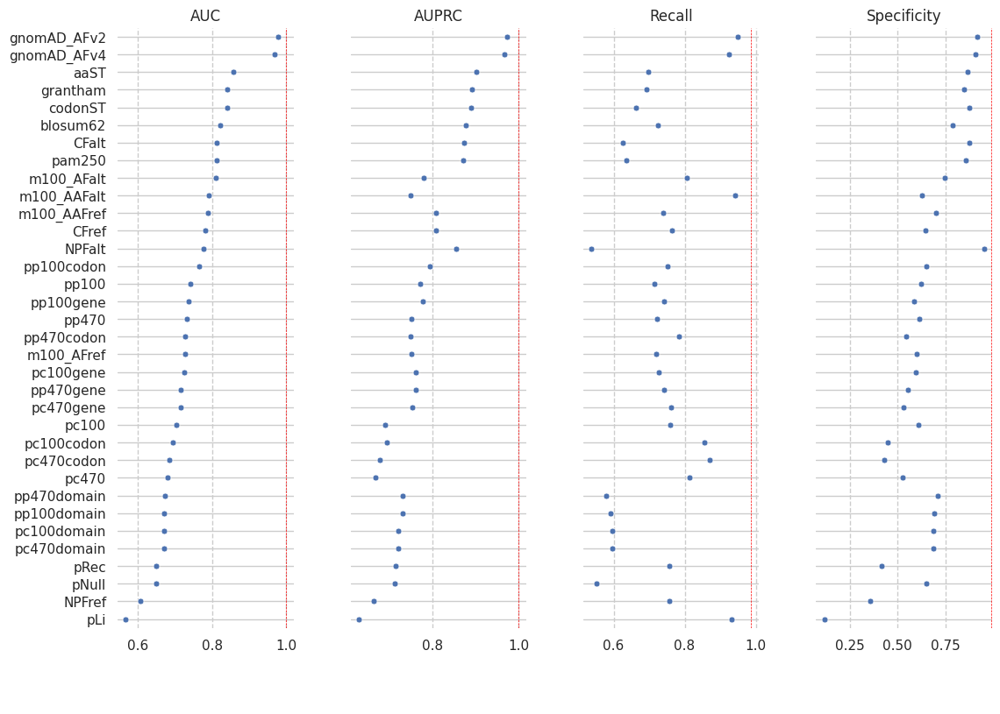

In [ ]:
# Make the PairGrid
from matplotlib.ticker import MultipleLocator
sns.set(style="whitegrid")

#colNames = ['AUC','AUPRC','Accuracy','F1-score','MCC','Precision','Recall','Specificity',]
colNames = ['AUC','AUPRC','Recall','Specificity',]
g = sns.PairGrid(feature[~feature['feature'].isin(['all'])].sort_values("AUC", ascending=False),
                 x_vars=colNames, y_vars=["feature"], #hue='with',
                 height=6, aspect=.25)

# Draw a dot plot using the stripplot function
g.map(sns.stripplot, size=5, orient="h", jitter=False,
      palette="flare_r", linewidth=0.5, edgecolor="w")

# Use the same x axis limits on all columns and add better labels
g.set(#xlim=(0.970, 1.0),
      xlabel="",
      ylabel="")

#for ax in g.axes.flat:
#    ax.xaxis.set_major_locator(MultipleLocator(0.1))
#    ax.set_xticks(np.arange(0, 1.1, 0.1))

# Use semantically meaningful titles for the columns
titles = colNames

for ax, title in zip(g.axes.flat, titles):
    ax.set(title=title)
    #if title == 'AUC':
        #ax.set_xlim(0.9975, 0.9990)
        #ax.set_xticks([0.9975, 0.9980, 0.9985, 0.9990])
    #elif title == 'Recall':
        #ax.set_xlim(0.98, 0.988)
        #ax.set_xticks([0.975, 0.980, 0.985, 0.990])
    #elif title == 'Specificity':
        #ax.set_xlim(0.976, 0.988)
        #ax.set_xticks([0.975, 0.980, 0.985, 0.990])

    # Make the grid horizontal instead of vertical
    ax.xaxis.grid(True, linestyle='--')
    ax.yaxis.grid(True, )
    x_v = feature[feature['feature'] == 'all'][title].values[0]
    ax.axvline(x=x_v, color='red', linestyle='--', linewidth=0.5)

#g.add_legend()
g.fig.set_size_inches(12, 8)
plt.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=2,frameon=False,)
sns.despine(left=True, bottom=True)

In [ ]:
a=pd.melt(feature, id_vars=['feature'],var_name='Variable', value_name='Value')
a.head()

,feature,Variable,Value
0,all,thres,0.5
1,CFref,thres,0.5
2,CFalt,thres,0.5
3,codonST,thres,0.5
4,aaST,thres,0.5


<ipython-input-12-90e067551623>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)


0 AUC 0.9989
1 AUPRC 0.9991


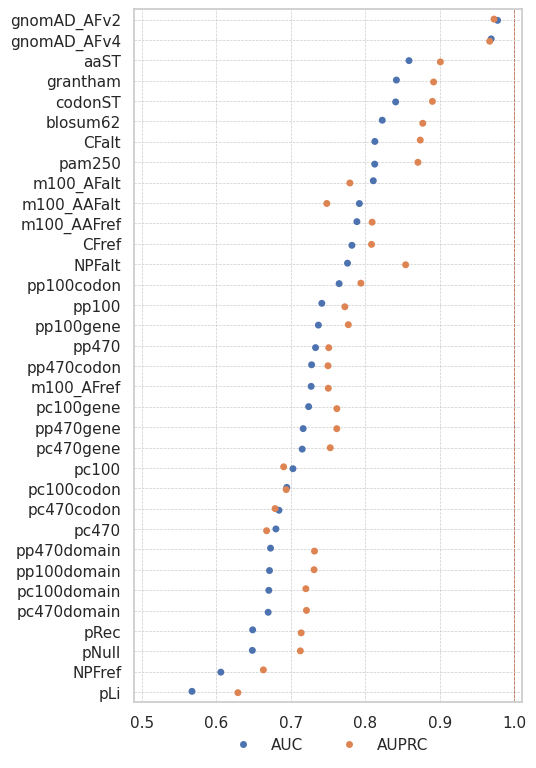

In [ ]:
colName = ['AUC', 'AUPRC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=False)['feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['feature'].isin(['all'])], x='Value',y='feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(0.49,1.01)
#plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-13-bc1d052ccfac>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)


0 Recall 0.9872
1 Specificity 0.9863


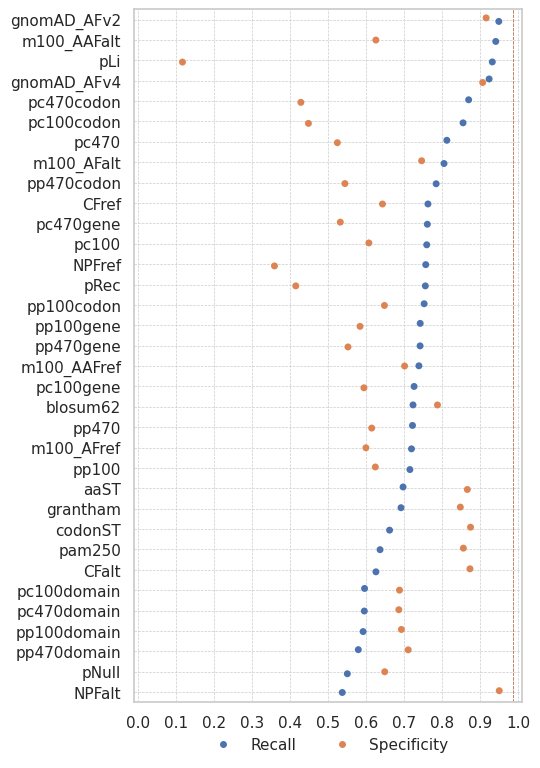

In [ ]:
colName = ['Recall', 'Specificity']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=False)['feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['feature'].isin(['all'])], x='Value',y='feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(-0.01,1.01)
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-14-47f95988ac1c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)


0 Recall 0.9872
1 Precision 0.9889


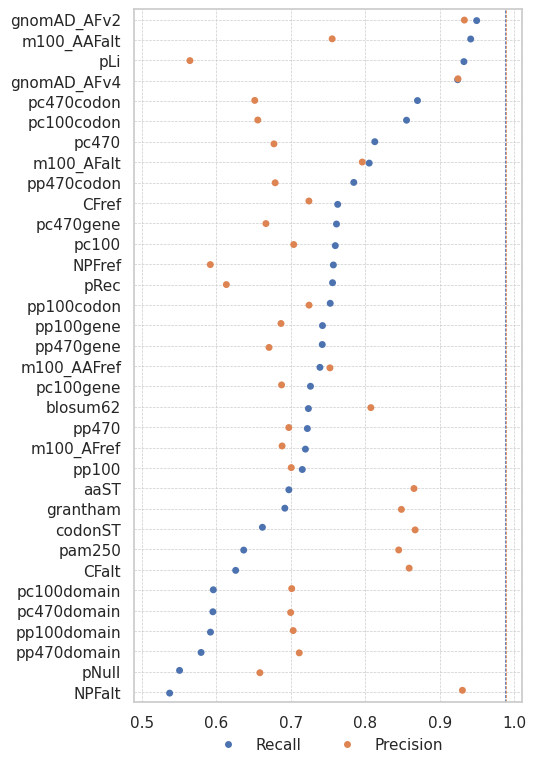

In [ ]:
colName = ['Recall', 'Precision']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=False)['feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)

b = b.sort_values(by=['Variable', 'feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['feature'].isin(['all'])], x='Value',y='feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(0.49,1.01)
#plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-15-2fe11bd099fa>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)
<ipython-input-15-2fe11bd099fa>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Recall 0.9872
1 Specificity 0.9863
2 Precision 0.9889


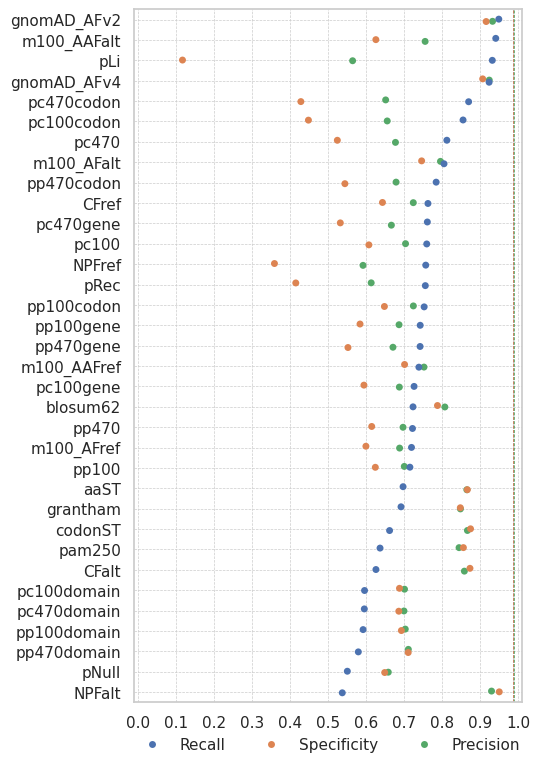

In [ ]:
colName = ['Recall', 'Specificity', 'Precision',]
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=False)['feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']

b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['feature'].isin(['all'])], x='Value',y='feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(-0.01,1.01)
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-16-eb23bf916a61>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)


0 Accuracy 0.9868
1 F1-score 0.988
2 MCC 0.9733


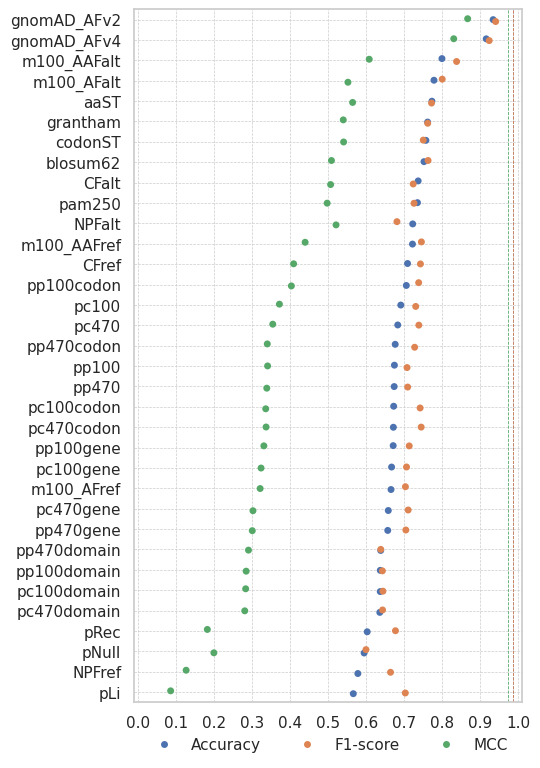

In [ ]:
colName = ['Accuracy', 'F1-score','MCC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=False)['feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['feature'].isin(['all'])], x='Value',y='feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(-0.01,1.01)
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-17-b9af98e6f54b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)


0 AUC 0.9989
1 AUPRC 0.9991
2 Accuracy 0.9868
3 F1-score 0.988
4 MCC 0.9733
5 Recall 0.9872
6 Specificity 0.9863
7 Precision 0.9889


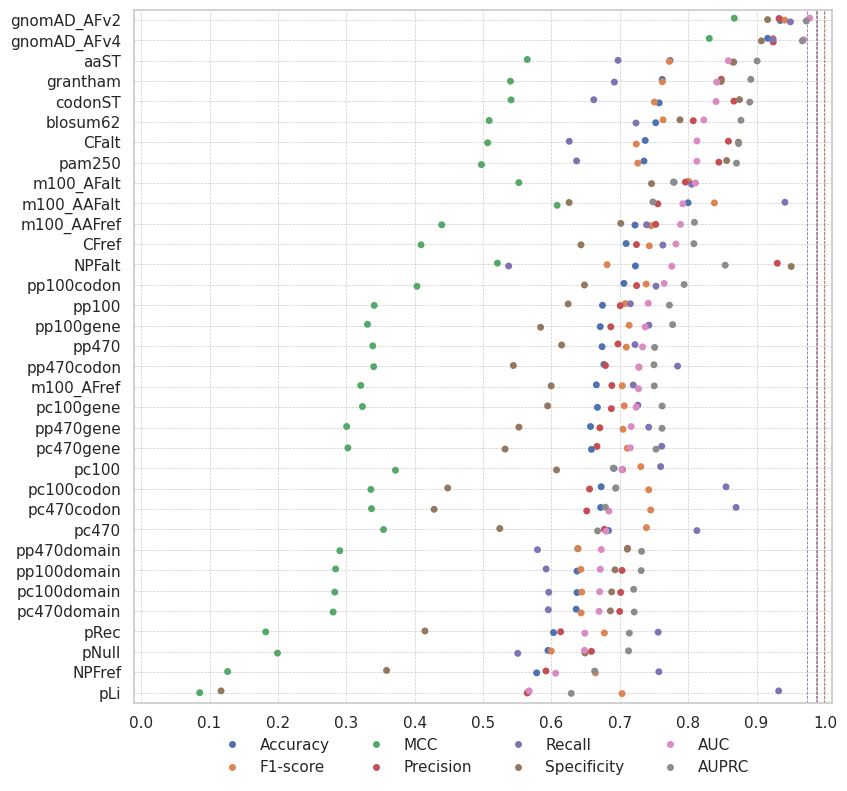

In [ ]:
colName = ['AUC','AUPRC','Accuracy', 'F1-score','MCC','Recall','Specificity','Precision']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=False)['feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)

plt.figure(figsize=(9, 9))
sns.stripplot(b[~b['feature'].isin(['all'])], x='Value',y='feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(-0.01,1.01)
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=4,frameon=False,)

<ipython-input-18-84a4f1d034d5>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)
<ipython-input-18-84a4f1d034d5>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 AUC 0.9989
1 AUPRC 0.9991
2 Accuracy 0.9868
3 F1-score 0.988
4 MCC 0.9733


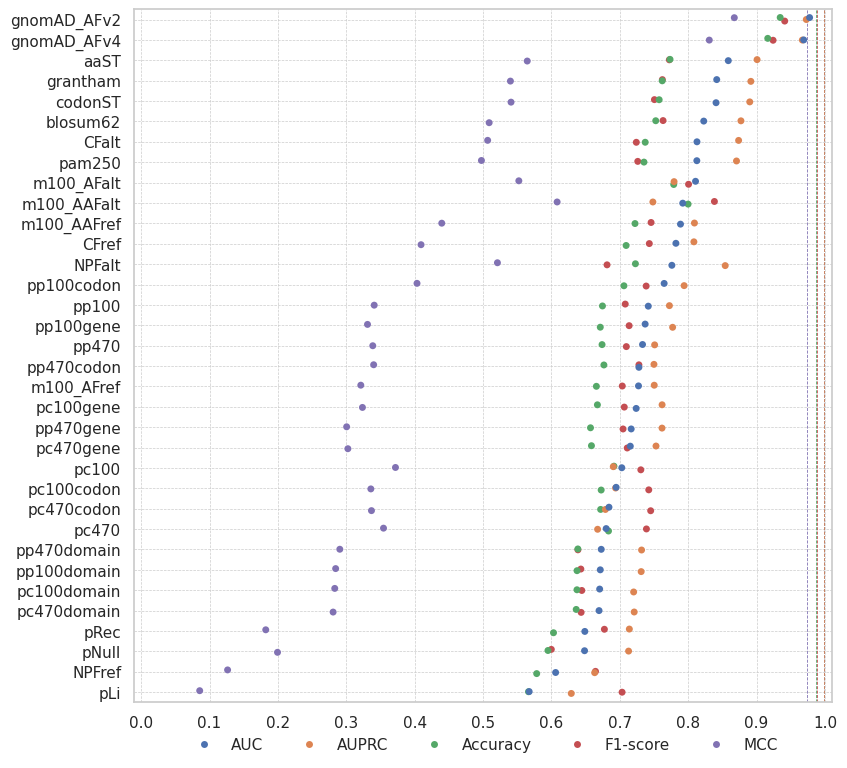

In [ ]:
colName = ['AUC','AUPRC','Accuracy', 'F1-score','MCC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=False)['feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['feature'] = pd.Categorical(b['feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'feature'], ascending=[False,True])

plt.figure(figsize=(9, 9))
sns.stripplot(b[~b['feature'].isin(['all'])], x='Value',y='feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(-0.01,1.01)
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=5,frameon=False,)

# minus single feature

In [ ]:
inFile = 'feature_minus_performance_prp.csv'
print(inFile)
feature=pd.read_csv(inFile, sep="\t", index_col = False, low_memory=False)
print("ori", feature.shape)
display(feature.head(1))

change_col = {'F1':'F1-score', 'Recall(=Sens)':'Recall', 'Spec':'Specificity', 'AUCPR':'AUPRC'}
feature = feature.rename(columns=change_col)
feature.head(1)

feature_minus_performance_prp.csv
ori (31, 18)


,Feature,thres,Accuracy,F1,MCC,Precision,Recall(=Sens),Specificity,AUC,AUCPR,PPV,NPV,FNR,FPR,TN,FP,FN,TP
0,all,0.5,0.9868,0.988,0.9733,0.9889,0.9872,0.9863,0.9989,0.9991,0.9889,0.9843,0.0128,0.0137,21207,294,338,26077


,Feature,thres,Accuracy,F1-score,MCC,Precision,Recall,Specificity,AUC,AUPRC,PPV,NPV,FNR,FPR,TN,FP,FN,TP
0,all,0.5,0.9868,0.988,0.9733,0.9889,0.9872,0.9863,0.9989,0.9991,0.9889,0.9843,0.0128,0.0137,21207,294,338,26077


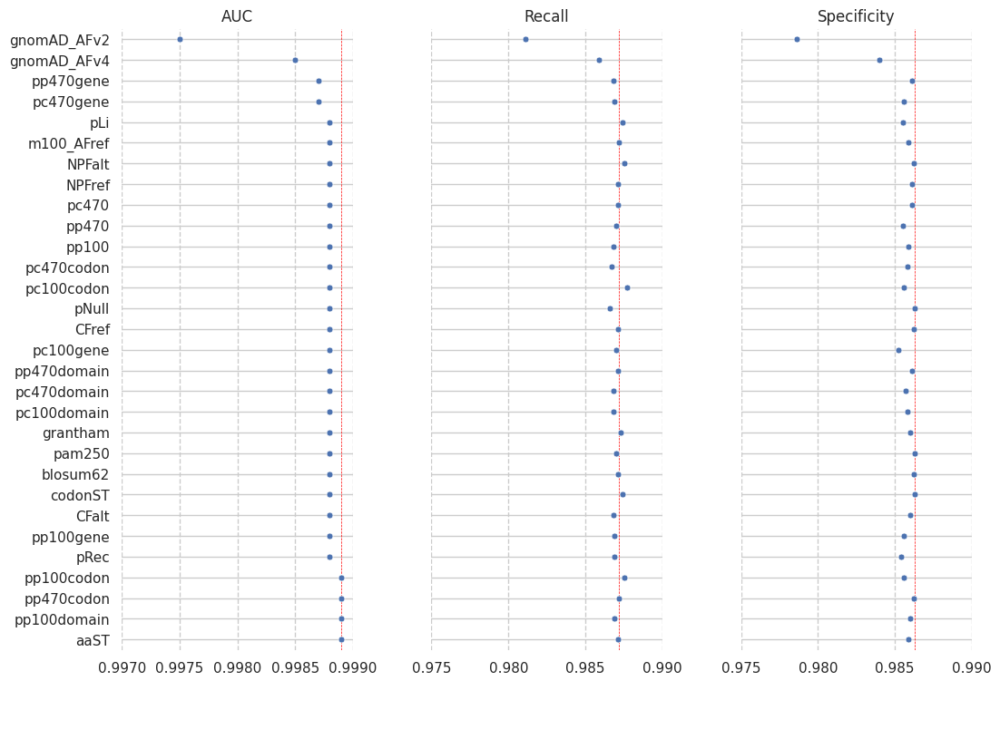

In [ ]:
# Make the PairGrid
from matplotlib.ticker import MultipleLocator
sns.set(style="whitegrid")

#colNames = ['AUC','AUPRC','Accuracy','F1-score','MCC','Precision','Recall','Specificity',]
colNames = ['AUC','Recall','Specificity',]
g = sns.PairGrid(feature[~feature['Feature'].isin(['all', 'AF', 'conservation'])].sort_values("AUC", ascending=True),
                 x_vars=colNames, y_vars=["Feature"], #hue='with',
                 height=6, aspect=.25)

# Draw a dot plot using the stripplot function
g.map(sns.stripplot, size=5, orient="h", jitter=False,
      palette="flare_r", linewidth=0.5, edgecolor="w")

# Use the same x axis limits on all columns and add better labels
g.set(xlim=(0.970, 1.0),
      xlabel="",
      ylabel="")

#for ax in g.axes.flat:
#    ax.xaxis.set_major_locator(MultipleLocator(0.1))
#    ax.set_xticks(np.arange(0, 1.1, 0.1))

# Use semantically meaningful titles for the columns
titles = colNames

for ax, title in zip(g.axes.flat, titles):
    ax.set(title=title)
    if title == 'AUC':
        ax.set_xlim(0.9970, 0.9990)
        #ax.set_xticks([0.9975, 0.9980, 0.9985, 0.9990])
    elif title == 'Recall':
        ax.set_xlim(0.98, 0.988)
        ax.set_xticks([0.975, 0.980, 0.985, 0.990])
    elif title == 'Specificity':
        ax.set_xlim(0.976, 0.988)
        ax.set_xticks([0.975, 0.980, 0.985, 0.990])

    # Make the grid horizontal instead of vertical
    ax.xaxis.grid(True, linestyle='--')
    ax.yaxis.grid(True, )
    x_v = feature[feature['Feature'] == 'all'][title].values[0]
    ax.axvline(x=x_v, color='red', linestyle='--', linewidth=0.5)

#g.add_legend()
g.fig.set_size_inches(12, 8)
plt.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=2,frameon=False,)
sns.despine(left=True, bottom=True)

In [ ]:
a=pd.melt(feature, id_vars=['Feature'],var_name='Variable', value_name='Value')
display(a.head())

all_v = a[a['Feature'] == 'all'].set_index('Variable')['Value'].to_dict()
a['all_v'] = a['Variable'].map(all_v)
a['delta'] = a['Value'] - a['all_v']
print(a.head())

,Feature,Variable,Value
0,all,thres,0.5
1,CFref,thres,0.5
2,CFalt,thres,0.5
3,codonST,thres,0.5
4,aaST,thres,0.5


   Feature Variable  Value  all_v  delta
0      all    thres    0.5    0.5    0.0
1    CFref    thres    0.5    0.5    0.0
2    CFalt    thres    0.5    0.5    0.0
3  codonST    thres    0.5    0.5    0.0
4     aaST    thres    0.5    0.5    0.0


<ipython-input-33-cafff97f759c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-33-cafff97f759c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 AUC 0.9989
1 AUPRC 0.9991


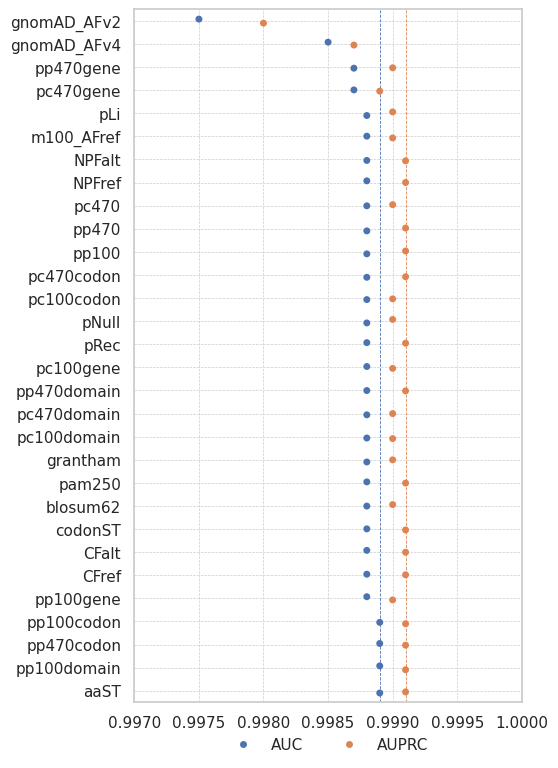

In [ ]:
colName = ['AUC', 'AUPRC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x='Value',y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(0.997,1.0)
#plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-35-e9db6eee2032>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-35-e9db6eee2032>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Recall 0.9872
1 Specificity 0.9863
2 Precision 0.9889


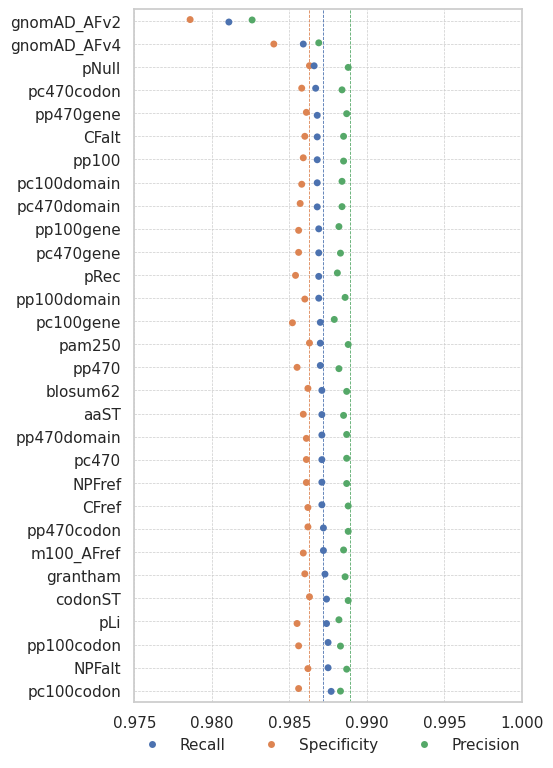

In [ ]:
colName = ['Recall', 'Specificity', 'Precision']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x='Value',y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

plt.xlim(0.975,1.0)
#plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-36-b078d9ef53d3>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-36-b078d9ef53d3>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Accuracy 0.9868
1 F1-score 0.988
2 MCC 0.9733


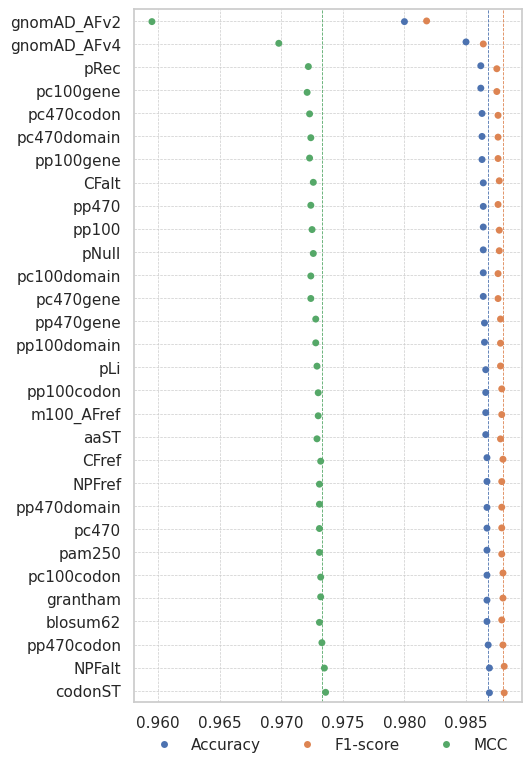

In [ ]:
colName = ['Accuracy', 'F1-score', 'MCC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values('Value', ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x='Value',y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

#plt.xlim(0.93,1.0)
#plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])]['Value'].values[0]
    plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

## delta

<ipython-input-37-d693534706f4>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-37-d693534706f4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 AUC 0.0
1 AUPRC 0.0


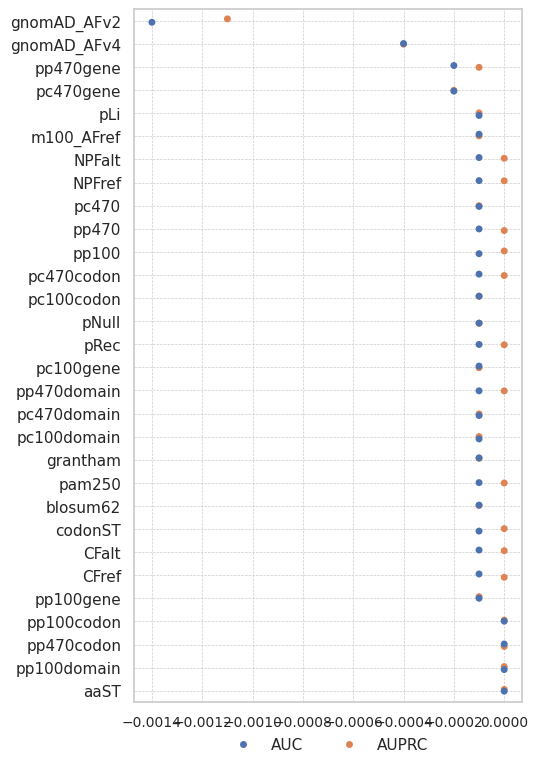

In [ ]:
value_col = 'delta'
colName = ['AUC','AUPRC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values(value_col, ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
custom_order = [item for item in custom_order if item != 'AF-All']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x=value_col,y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

#plt.xlim(0.93,1.0)
plt.xticks(fontsize=10)

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])][value_col].values[0]
    #plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-38-f97eebc3654f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-38-f97eebc3654f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Recall 0.0
1 Specificity 0.0
2 Precision 0.0


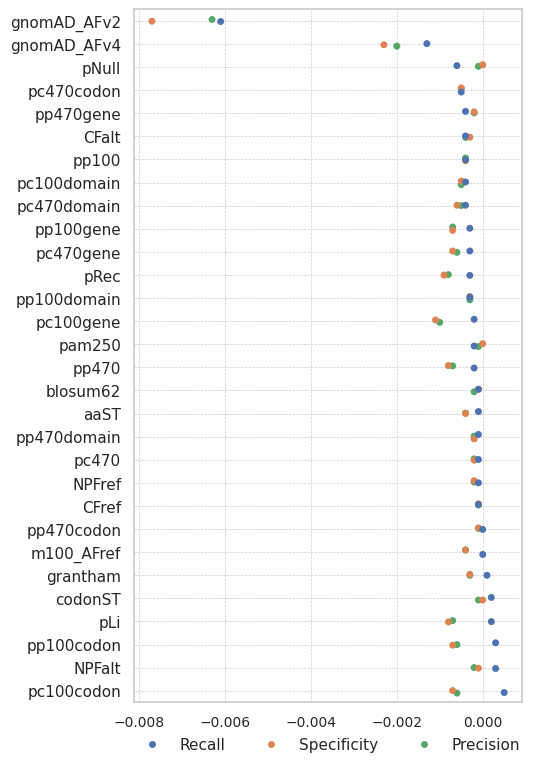

In [ ]:
value_col = 'delta'
colName = ['Recall', 'Specificity', 'Precision']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values(value_col, ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
custom_order = [item for item in custom_order if item != 'AF-All']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x=value_col,y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

#plt.xlim(0.93,1.0)
plt.xticks(fontsize=10)

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])][value_col].values[0]
    #plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

<ipython-input-39-2035a8830367>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
<ipython-input-39-2035a8830367>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)


0 Accuracy 0.0
1 F1-score 0.0
2 MCC 0.0


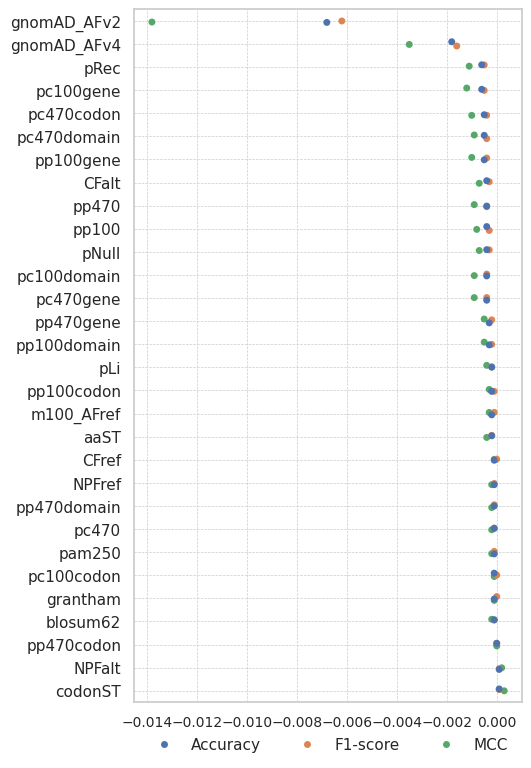

In [ ]:
value_col = 'delta'
colName = ['Accuracy', 'F1-score', 'MCC']
b=a[a['Variable'].isin(colName)]

custom_order = a[a['Variable'].isin([colName[0]])].sort_values(value_col, ascending=True)['Feature'].tolist()
custom_order = [item for item in custom_order if item != 'all']
custom_order = [item for item in custom_order if item != 'AF-All']
b['Feature'] = pd.Categorical(b['Feature'], categories=custom_order, ordered=True)
b['Variable'] = pd.Categorical(b['Variable'], categories=colName, ordered=True)

b = b.sort_values(by=['Variable', 'Feature'], ascending=[False,True])

plt.figure(figsize=(5, 9))
sns.stripplot(b[~b['Feature'].isin(['all'])], x=value_col,y='Feature',hue='Variable')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

#plt.xlim(0.93,1.0)
plt.xticks(fontsize=10)

for i in range(len(colName)):
    x_value = a[(a['Feature'] == 'all') & (a['Variable'] == colName[i])][value_col].values[0]
    #plt.axvline(x=x_value, color=sns.color_palette()[i], linestyle='--', linewidth=0.6)
    print(i, colName[i], x_value)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.03), ncol=3,frameon=False,)

#==================================================

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 예제 데이터 생성
np.random.seed(0)
data = pd.DataFrame({
    'x': np.random.normal(size=100),
    'y': np.random.normal(size=100),
    'condition': np.random.choice(['A', 'B', 'C', 'D'], size=100)
})

print("Example DataFrame:")
print(data.head())

Example DataFrame:
          x         y condition
0  1.764052  1.883151         A
1  0.400157 -1.347759         D
2  0.978738 -1.270485         C
3  2.240893  0.969397         B
4  1.867558 -1.173123         C


A


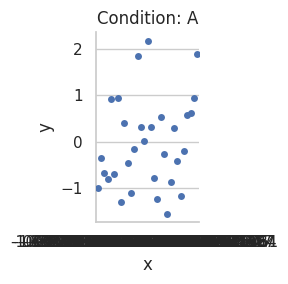

In [ ]:
g = sns.PairGrid(data, x_vars=['x'], y_vars=['y'], height=3, aspect=1)

# 각 조건에 따라 플롯 그리기
conditions = data['condition'].unique()
for ax, condition in zip(g.axes.flat, conditions):
    print(condition)
    subset = data[data['condition'] == condition]
    sns.stripplot(data=subset, x='x', y='y', ax=ax)
    ax.set_title(f'Condition: {condition}')

plt.tight_layout()
plt.show()

# ploty : Radar, Category
* https://wikidocs.net/book/8909
* https://plotly.com/python/radar-chart/

## Def : plot_radar_each(_df, _para)

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
def plot_radar_each(_row, _para):
    _png_fold = _para['png_fold']

    _key = ['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']

    _label = _row['Name']
    _value = _row[_key].values

    _key2 = []
    for j in range(len(_value)):
        _key2.append(f'{_key[j]}<br>({_value[j]:.4f})')

    fig = px.line_polar(r = _value, theta = _key2, line_close=True, title=_label)
    #fig.update_traces(fill='toself')
    fig.update_layout(#template=None,
        polar = dict(
                radialaxis = dict(range=[0, 1], showticklabels=True, dtick=0.1, tickfont=dict(size=12)),
                angularaxis=dict(tickfont=dict(size=14)),
                sector=[-270,90], radialaxis_ticks=''
        )
    )

    fig.update_layout(title_x = 0.5, title_y = 0.45, title_font_size = 20,
                      title_xanchor = "center", title_yanchor = "middle",
    )

    fig.update_layout(width=360,height=320,
                      margin_l=70, margin_r=70,
                      margin_b=30,margin_t=30
    )

    print(_label, _value)
    if _png_fold:
        _save_png = _png_fold + '/' + _label + _para['png_file']
        print("!!! Save : ", _save_png)
        #fig.write_image(_save_png, scale=3)

    fig.show()

# test ###############################################################################
def test_plot_radar_each(_df, _para):
    _row = _df.iloc[0]
    plot_radar_each(_row, _para)

para['png_fold'] = ''
test_plot_radar_each(df_result, para)

In [ ]:
def loop_plot_radar_each(_df, _para):
    for _idx in range(df_result.shape[0]):
        _row = df_result.iloc[_idx]
        plot_radar_each(_row, _para)

para.update({'png_file':'_radar.png'})
para['png_fold'] = f"03.result/{para['prefix']}_radar"
para['png_fold'] = ''
if para['png_fold']:
  out_fold = make_folder(fold_here, para['png_fold'])

loop_plot_radar_each(df_result, para)

MetaRNN [0.947 0.7882 0.9117 0.8633 0.8104 0.7762 0.9725 0.8873]


MutScore [0.9429 0.7999 0.8773 0.8154 0.744 0.7115 0.9547 0.8467]


PHACTboost [0.9422 0.7836 0.8183 0.756 0.6732 0.6083 0.9983 0.7476]


ClinPred [0.9403 0.7874 0.8958 0.8466 0.7853 0.7479 0.9752 0.8626]


gMVP [0.9318 0.7783 0.7678 0.7059 0.5977 0.5522 0.9782 0.684]


REVEL [0.9318 0.7725 0.8766 0.813 0.7341 0.7272 0.9216 0.8581]


VARITY_R [0.9258 0.7719 0.8613 0.7788 0.6892 0.6988 0.8795 0.8542]


LINSIGHT [0.9205 0.8866 0.7895 0.7778 0.5955 0.7 0.875 0.7273]


VARITY_ER [0.9176 0.7613 0.8563 0.7624 0.6649 0.7051 0.8298 0.8665]


AlphaMissense [0.9161 0.7581 0.8484 0.7542 0.6488 0.7044 0.8116 0.8632]


DEOGEN2 [0.9153 0.7679 0.8535 0.7635 0.6664 0.6923 0.851 0.8544]


MetaSVM [0.9069 0.7528 0.8434 0.7587 0.6544 0.6806 0.8571 0.8378]


MutFormer [0.9067 0.7434 0.8445 0.7608 0.6574 0.6822 0.8599 0.8382]


MetaLR [0.9044 0.7444 0.8198 0.7307 0.613 0.6403 0.8507 0.8073]


ESM1b [0.8972 0.7405 0.8168 0.7369 0.6261 0.6255 0.8966 0.7848]


MVP [0.892 0.7635 0.7676 0.7471 0.5961 0.6142 0.9536 0.6629]


PROVEAN [0.8839 0.7161 0.803 0.727 0.6022 0.6189 0.8808 0.77]


MutationAssessor [0.8824 0.7191 0.7631 0.6799 0.5424 0.5526 0.8833 0.7152]


Polyphen2_HVAR [0.8737 0.6846 0.7557 0.6784 0.5391 0.5463 0.8948 0.6994]


EVE [0.8591 0.7479 0.7913 0.7523 0.5817 0.6893 0.8279 0.7685]


SIFT4G [0.8556 0.6554 0.7553 0.6756 0.524 0.5558 0.8614 0.7107]


M-CAP [0.8531 0.7273 0.6152 0.6622 0.4174 0.4993 0.9827 0.3862]


SIFT [0.8527 0.6413 0.7125 0.6545 0.4995 0.5077 0.9208 0.625]


Polyphen2_HDIV [0.8512 0.6305 0.6892 0.6318 0.4735 0.4795 0.9261 0.5934]


LIST-S2 [0.8449 0.6554 0.7128 0.6408 0.4742 0.5052 0.8757 0.6454]


FATHMM [0.8349 0.6647 0.7309 0.6301 0.4504 0.5291 0.7786 0.7111]


MutPred [0.8301 0.7577 0.7364 0.7224 0.48 0.7853 0.6688 0.8076]


PrimateAI [0.817 0.5894 0.7649 0.4921 0.3649 0.6364 0.4012 0.9091]


VEST4 [0.7901 0.5981 0.6939 0.6756 0.4608 0.545 0.8883 0.5851]


BayesDel_addAF [0.7828 0.5422 0.759 0.7417 0.5909 0.602 0.9657 0.6435]


MPC [0.7812 0.6108 0.6859 0.6027 0.392 0.4904 0.7816 0.644]


BayesDel_noAF [0.7751 0.5397 0.7283 0.7173 0.5487 0.5718 0.9623 0.5976]


Eigen [0.7667 0.5562 0.6992 0.6471 0.4087 0.5628 0.761 0.6641]


CADD [0.747 0.5349 0.4091 0.548 0.1722 0.3775 0.9997 0.0794]


DANN [0.7026 0.4987 0.4122 0.5491 0.1758 0.3786 0.9987 0.0848]


fathmm-MKL [0.6954 0.5048 0.5445 0.5879 0.2746 0.4349 0.9067 0.3423]


fathmm-XF [0.6827 0.5805 0.6611 0.5164 0.2564 0.5345 0.4995 0.7529]


GenoCanyon [0.6276 0.476 0.4327 0.5264 0.0822 0.3755 0.88 0.1829]


## Def : plot_radar_multi(_df, _para)

In [ ]:
def plot_radar_multi(_df, _para):
    _png_fold = _para['png_fold']
    _title = _para['title']

    legend_name = 'Method'
    _radar = pd.DataFrame()
    _theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']
    for i in range(_df.shape[0]):
        _label = _df.loc[i, 'Name']
        values = _df.loc[i,'AUC':'Specificity'].values.tolist()

        _tmp = pd.DataFrame(dict(r = values, theta= _theta))

        _tmp[legend_name] = _label
        _radar = pd.concat([_radar,_tmp], axis=0)

    fig = px.line_polar(_radar, r='r', color=legend_name, theta='theta', line_close=True,
                        #color_discrete_sequence=px.colors.qualitative.Light24,
                        title = _title)

    #fig.update_polars(sector=[-270,90], radialaxis_ticks='')
    fig.update_layout(#template=None,
        polar = dict(radialaxis = dict(range=[0, 1], showticklabels=True, dtick=0.1),
                    angularaxis=dict(tickfont=dict(size=16)),)
        )
    fig.update_layout(title_x = 0.41, title_y = 0.52, title_font_size = 24,
                    title_xanchor = "center", title_yanchor = "middle")
    fig.update_layout(width=900,height=650,
                        margin_l=10, margin_r=50,
                        margin_b=30,margin_t=30)

    if _png_fold:
        _save_png = _png_fold + '/' + _para['prefix'] + _para['png_file']
        print("!!! Save : ", _save_png)
        #fig.write_image(_save_png, scale=3)

    fig.show()

In [ ]:
para.update({'title':'ClinVar', 'png_fold':'03.result', 'png_file':'_radar.png'})
plot_radar_multi(df_result, para)

!!! Save :  03.result/clinvar2021_radar.png


## def: plot_radar_multi_AF():

In [ ]:
def plot_radar_multi_AF(_df, _para):
    legend_name = 'AF'
    _radar = pd.DataFrame()
    _theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']
    for i in range(_df.shape[0]):
        _label = _df.loc[i, 'AF']
        values = _df.loc[i,'AUC':'Specificity'].values.tolist()

        _tmp = pd.DataFrame(dict(r = values, theta= _theta))

        _tmp[legend_name] = _label
        _radar = pd.concat([_radar,_tmp], axis=0)

    fig = px.line_polar(_radar, r='r', color=legend_name, theta='theta', line_close=True,
                        #color_discrete_sequence=px.colors.qualitative.Light24,
                        title = _para['title'])

    #fig.update_polars(sector=[-270,90], radialaxis_ticks='')
    fig.update_layout(#template=None,
        polar = dict(radialaxis = dict(range=[0, 1], showticklabels=True, dtick=0.1),
                    angularaxis=dict(tickfont=dict(size=16)),)
        )
    fig.update_layout(title_x = 0.41, title_y = 0.52, title_font_size = 24,
                    title_xanchor = "center", title_yanchor = "middle")
   # fig.update_layout(width=900,height=650,
    #                    margin_l=10, margin_r=50,
     #                   margin_b=30,margin_t=30)
    fig.update_layout(width=360,height=320,
                        margin_l=70, margin_r=70,
                        margin_b=30,margin_t=30)

    _save_png = _para['png_fold'] + "/" + f"radar_AF_{_para['name']}_{_label}.png"
    print("!!! Save: ", _save_png)
    #fig.write_image(_save_png, scale=3)
    fig.show()

# test ###############################################################################
def test_plot_radar_multi_AF(_df, _para):
    _tmp = _df[_df['Name']==_k]
    plot_radar_multi_AF(_tmp, _para)

_para['png_fold'] = f"03.result/{_para['name']}_radar"
test_plot_radar_multi_AF(df_result, _para)

In [ ]:
_para['png_fold'] = ''
_para['png_fold'] = f"03.result/{_para['name']}_radar"
make_folder(fold_here, _para['png_fold'])

def loop_plot_radar_AF(_df, _para):
    _df = _df.sort_values(by='AUC', ascending=False).reset_index(drop=True)

    for _k in _df['Name'].unique():
        _tmp = _df[_df['Name']==_k]
        _tmp = _tmp[_tmp['AF'].isin([1,0.001,0.0001])]
        _tmp = _tmp.sort_values(by='AF', ascending=False).reset_index(drop=True)
        display(_tmp)
        print(_k)

        plot_radar_multi_AF(_tmp, _para)

loop_plot_radar_AF(df_result, _para)

,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,PRP,0.5,0,0.9993,0.9995,0.9902,0.9915,0.9800,0.9926,0.9905,0.9899,0.9902,0.9926,0.9871,0.0095,0.0101,2058.0,21.0,27.0,2814.0,4920.0,2079.0,2841.0,0.0,0.0,0.0,0.0,1.0000
1,PRP,0.5,0,0.9990,0.9997,0.9885,0.9924,0.9689,0.9926,0.9922,0.9770,0.9846,0.9926,0.9759,0.0078,0.0230,891.0,21.0,22.0,2814.0,3748.0,912.0,2836.0,0.0,0.0,0.0,0.0,0.0010
2,PRP,0.5,0,0.9982,0.9998,0.9917,0.9954,0.9530,0.9954,0.9954,0.9577,0.9763,0.9954,0.9577,0.0046,0.0423,294.0,13.0,13.0,2801.0,3121.0,307.0,2814.0,0.0,0.0,0.0,0.0,0.0001


PRP
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,ClinPred,0.5,2,0.9951,0.9919,0.9746,0.9669,0.9463,0.9607,0.9731,0.9754,0.9743,0.9607,0.9833,0.0269,0.0246,1827.0,46.0,31.0,1123.0,3027.0,1873.0,1154.0,1893.0,206.0,1687.0,38.475610,1.0000
1,ClinPred,0.5,2,0.9910,0.9929,0.9633,0.9689,0.9243,0.9615,0.9765,0.9446,0.9604,0.9615,0.9660,0.0235,0.0554,767.0,45.0,27.0,1123.0,1962.0,812.0,1150.0,1786.0,100.0,1686.0,47.652081,0.0010
2,ClinPred,0.5,2,0.9809,0.9943,0.9588,0.9745,0.8673,0.9677,0.9814,0.8664,0.9221,0.9677,0.9195,0.0186,0.1336,240.0,37.0,21.0,1110.0,1408.0,277.0,1131.0,1713.0,30.0,1683.0,54.886254,0.0001


ClinPred
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,MetaRNN,0.5,2,0.9949,0.9913,0.9712,0.9604,0.9377,0.9564,0.9644,0.9750,0.9697,0.9564,0.9797,0.0356,0.0250,1832.0,47.0,38.0,1030.0,2947.0,1879.0,1068.0,1973.0,200.0,1773.0,40.101626,1.0000
1,MetaRNN,0.5,2,0.9908,0.9925,0.9569,0.9622,0.9121,0.9564,0.9680,0.9423,0.9551,0.9564,0.9576,0.0320,0.0577,767.0,47.0,34.0,1030.0,1878.0,814.0,1064.0,1870.0,98.0,1772.0,49.893276,0.0010
2,MetaRNN,0.5,2,0.9841,0.9955,0.9554,0.9719,0.8645,0.9686,0.9751,0.8813,0.9270,0.9686,0.9041,0.0249,0.1187,245.0,33.0,26.0,1019.0,1323.0,278.0,1045.0,1798.0,29.0,1769.0,57.609740,0.0001


MetaRNN
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,gMVP,0.5,1,0.9629,0.9342,0.7947,0.7612,0.6450,0.6214,0.9822,0.7010,0.8298,0.6214,0.9875,0.0178,0.2990,1027.0,438.0,13.0,719.0,2197.0,1465.0,732.0,2723.0,614.0,2109.0,55.345528,1.0000
1,gMVP,0.5,1,0.9637,0.9669,0.8613,0.8829,0.7395,0.8018,0.9822,0.7239,0.8432,0.8018,0.9727,0.0178,0.2761,464.0,177.0,13.0,716.0,1370.0,641.0,729.0,2378.0,271.0,2107.0,63.447172,0.0010
2,gMVP,0.5,1,0.9621,0.9860,0.9142,0.9455,0.7581,0.9105,0.9832,0.7000,0.8296,0.9105,0.9306,0.0168,0.3000,161.0,69.0,12.0,702.0,944.0,230.0,714.0,2177.0,77.0,2100.0,69.753284,0.0001


gMVP


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,REVEL,0.5,2,0.9723,0.9543,0.9172,0.8891,0.8242,0.8622,0.9178,0.9169,0.9173,0.8622,0.9517,0.0822,0.0831,1555.0,141.0,79.0,882.0,2657.0,1696.0,961.0,2263.0,383.0,1880.0,45.995935,1.0000
1,REVEL,0.5,2,0.9674,0.9740,0.9069,0.9180,0.8104,0.9175,0.9185,0.8918,0.9050,0.9175,0.8930,0.0815,0.1082,651.0,79.0,78.0,879.0,1687.0,730.0,957.0,2061.0,182.0,1879.0,54.989328,0.0010
2,REVEL,0.5,2,0.9662,0.9906,0.9104,0.9423,0.7466,0.9643,0.9212,0.8689,0.8946,0.9643,0.7413,0.0788,0.1311,212.0,32.0,74.0,865.0,1183.0,244.0,939.0,1938.0,63.0,1875.0,62.095482,0.0001


REVEL
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,VARITY,0.5,2,0.9606,0.9382,0.8959,0.8664,0.7828,0.8346,0.9007,0.8930,0.8968,0.8346,0.9375,0.0993,0.1070,1410.0,169.0,94.0,853.0,2526.0,1579.0,947.0,2394.0,500.0,1894.0,48.658537,1.0000
1,VARITY,0.5,2,0.9655,0.9751,0.9055,0.9178,0.8077,0.9361,0.9003,0.9129,0.9066,0.9361,0.8661,0.0997,0.0871,608.0,58.0,94.0,849.0,1609.0,666.0,943.0,2139.0,246.0,1893.0,57.070438,0.0010
2,VARITY,0.5,2,0.9717,0.9927,0.9068,0.9398,0.7475,0.9800,0.9027,0.9238,0.9132,0.9800,0.6959,0.0973,0.0762,206.0,17.0,90.0,835.0,1148.0,223.0,925.0,1973.0,84.0,1889.0,63.216918,0.0001


VARITY
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,VEST4,0.5,1,0.9307,0.9459,0.8535,0.8801,0.6981,0.8402,0.9240,0.7554,0.8355,0.8402,0.8772,0.0760,0.2446,1371.0,444.0,192.0,2335.0,4342.0,1815.0,2527.0,578.0,264.0,314.0,11.747967,1.0000
1,VEST4,0.5,1,0.9365,0.9769,0.8909,0.9283,0.6998,0.9324,0.9243,0.7822,0.8503,0.9324,0.7607,0.0757,0.2178,607.0,169.0,191.0,2332.0,3299.0,776.0,2523.0,449.0,136.0,313.0,11.979723,0.0010
2,VEST4,0.5,1,0.9394,0.9919,0.9128,0.9505,0.6025,0.9776,0.9249,0.7969,0.8585,0.9776,0.5253,0.0751,0.2031,208.0,53.0,188.0,2314.0,2763.0,261.0,2502.0,358.0,46.0,312.0,11.470682,0.0001


VEST4


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,CADD,0.0,2,0.9528,0.9665,0.6289,0.7594,0.2509,0.6123,0.9996,0.1040,0.3224,0.6123,0.9949,0.0004,0.8960,197.0,1697.0,1.0,2680.0,4575.0,1894.0,2681.0,345.0,185.0,160.0,7.012195,1.0000
1,CADD,0.0,2,0.9561,0.9852,0.7929,0.8808,0.3027,0.7872,0.9996,0.1183,0.3439,0.7872,0.9898,0.0004,0.8817,97.0,723.0,1.0,2675.0,3496.0,820.0,2676.0,252.0,92.0,160.0,6.723586,0.0010
2,CADD,0.0,2,0.9577,0.9951,0.9127,0.9540,0.2733,0.9123,0.9996,0.0860,0.2932,0.9123,0.9600,0.0004,0.9140,24.0,255.0,1.0,2653.0,2933.0,279.0,2654.0,188.0,28.0,160.0,6.023710,0.0001


CADD
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,MVP,0.7,2,0.9532,0.9182,0.8333,0.8068,0.6905,0.6999,0.9522,0.7648,0.8534,0.6999,0.9652,0.0478,0.2352,1333.0,410.0,48.0,956.0,2747.0,1743.0,1004.0,2173.0,336.0,1837.0,44.166667,1.0000
1,MVP,0.7,2,0.9385,0.9420,0.8538,0.8804,0.7088,0.8180,0.9530,0.7254,0.8314,0.8180,0.9226,0.0470,0.2746,560.0,212.0,47.0,953.0,1772.0,772.0,1000.0,1976.0,140.0,1836.0,52.721451,0.0010
2,MVP,0.7,2,0.9201,0.9736,0.8937,0.9342,0.6626,0.9150,0.9542,0.6654,0.7968,0.9150,0.7936,0.0458,0.3346,173.0,87.0,45.0,937.0,1242.0,260.0,982.0,1879.0,47.0,1832.0,60.205062,0.0001


MVP
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,MutationAssessor,1.935,1,0.8977,0.8567,0.7735,0.7487,0.5743,0.6475,0.8874,0.7037,0.7902,0.6475,0.9106,0.1126,0.2963,1090.0,459.0,107.0,843.0,2499.0,1549.0,950.0,2421.0,530.0,1891.0,49.207317,1.0000
1,MutationAssessor,1.935,1,0.9096,0.9344,0.8269,0.8580,0.6394,0.8300,0.8879,0.7394,0.8103,0.8300,0.8215,0.1121,0.2606,488.0,172.0,106.0,840.0,1606.0,660.0,946.0,2142.0,252.0,1890.0,57.150480,0.0010
2,MutationAssessor,1.935,1,0.9256,0.9780,0.8687,0.9156,0.6274,0.9450,0.8881,0.7904,0.8378,0.9450,0.6351,0.1119,0.2096,181.0,48.0,104.0,825.0,1158.0,229.0,929.0,1963.0,78.0,1885.0,62.896508,0.0001


MutationAssessor


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,DEOGEN2,0.5,2,0.9523,0.9306,0.8885,0.8527,0.7635,0.8359,0.8703,0.8993,0.8847,0.8359,0.9217,0.1297,0.1007,1447.0,162.0,123.0,825.0,2557.0,1609.0,948.0,2363.0,470.0,1893.0,48.028455,1.0000
1,DEOGEN2,0.5,2,0.9428,0.9583,0.8701,0.8867,0.7354,0.9033,0.8708,0.8692,0.8700,0.9033,0.8274,0.1292,0.1308,585.0,88.0,122.0,822.0,1617.0,673.0,944.0,2131.0,239.0,1892.0,56.856990,0.0010
2,DEOGEN2,0.5,2,0.9432,0.9847,0.8782,0.9205,0.6801,0.9712,0.8747,0.8924,0.8835,0.9712,0.6317,0.1253,0.1076,199.0,24.0,116.0,810.0,1149.0,223.0,926.0,1972.0,84.0,1888.0,63.184877,0.0001


DEOGEN2
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,Eigen,0.5,1,0.8944,0.9222,0.7895,0.8100,0.5845,0.8734,0.7551,0.8398,0.7963,0.8734,0.7009,0.2449,0.1602,1483.0,283.0,633.0,1952.0,4351.0,1766.0,2585.0,569.0,313.0,256.0,11.565041,1.0000
1,Eigen,0.5,1,0.9006,0.9683,0.7756,0.8413,0.5117,0.9485,0.7559,0.8484,0.8008,0.9485,0.4849,0.2441,0.1516,593.0,106.0,630.0,1951.0,3280.0,699.0,2581.0,468.0,213.0,255.0,12.486660,0.0010
2,Eigen,0.5,1,0.8954,0.9885,0.7620,0.8541,0.3476,0.9812,0.7562,0.8303,0.7923,0.9812,0.2248,0.2438,0.1697,181.0,37.0,624.0,1935.0,2777.0,218.0,2559.0,344.0,89.0,255.0,11.022108,0.0001


Eigen


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,MetaSVM,0.0,2,0.9486,0.9211,0.8875,0.8500,0.7614,0.8216,0.8804,0.8916,0.8860,0.8216,0.9293,0.1196,0.1084,1669.0,203.0,127.0,935.0,2934.0,1872.0,1062.0,1986.0,207.0,1779.0,40.365854,1.0000
1,MetaSVM,0.0,2,0.9375,0.9473,0.8737,0.8877,0.7436,0.8937,0.8819,0.8631,0.8724,0.8937,0.8485,0.1181,0.1369,700.0,111.0,125.0,933.0,1869.0,811.0,1058.0,1879.0,101.0,1778.0,50.133404,0.0010
2,MetaSVM,0.0,2,0.9386,0.9820,0.8799,0.9208,0.6840,0.9603,0.8845,0.8628,0.8736,0.9603,0.6657,0.1155,0.1372,239.0,38.0,120.0,919.0,1316.0,277.0,1039.0,1805.0,30.0,1775.0,57.834028,0.0001


MetaSVM
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,SIFT4G,0.049,1,0.8654,0.7638,0.7628,0.7306,0.5509,0.6289,0.8715,0.6992,0.7806,0.6289,0.9029,0.1285,0.3008,1181.0,508.0,127.0,861.0,2677.0,1689.0,988.0,2243.0,390.0,1853.0,45.589431,1.0000
1,SIFT4G,0.049,1,0.8913,0.9065,0.8244,0.8516,0.6379,0.8330,0.8711,0.7604,0.8139,0.8330,0.8113,0.1289,0.2396,546.0,172.0,127.0,858.0,1703.0,718.0,985.0,2045.0,194.0,1851.0,54.562433,0.0010
2,SIFT4G,0.049,1,0.8982,0.9657,0.8570,0.9069,0.6099,0.9451,0.8718,0.7984,0.8343,0.9451,0.6101,0.1282,0.2016,194.0,49.0,124.0,843.0,1210.0,243.0,967.0,1911.0,64.0,1847.0,61.230375,0.0001


SIFT4G


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,MetaLR,0.4999,2,0.9463,0.9184,0.8732,0.8327,0.7329,0.7969,0.8719,0.8739,0.8729,0.7969,0.9233,0.1281,0.1261,1636.0,236.0,136.0,926.0,2934.0,1872.0,1062.0,1986.0,207.0,1779.0,40.365854,1.0000
1,MetaLR,0.4999,2,0.9325,0.9480,0.8577,0.8742,0.7104,0.8750,0.8733,0.8372,0.8551,0.8750,0.8352,0.1267,0.1628,679.0,132.0,134.0,924.0,1869.0,811.0,1058.0,1879.0,101.0,1778.0,50.133404,0.0010
2,MetaLR,0.4999,2,0.9282,0.9794,0.8640,0.9105,0.6368,0.9470,0.8768,0.8159,0.8458,0.9470,0.6384,0.1232,0.1841,226.0,51.0,128.0,911.0,1316.0,277.0,1039.0,1805.0,30.0,1775.0,57.834028,0.0001


MetaLR
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,MutPred,0.75,1,0.9367,0.9745,0.7868,0.8301,0.6076,0.9756,0.7223,0.9534,0.8299,0.9756,0.5707,0.2777,0.0466,327.0,16.0,246.0,640.0,1229.0,343.0,886.0,3691.0,1736.0,1955.0,75.020325,1.0000
1,MutPred,0.75,1,0.9366,0.9821,0.7721,0.8337,0.5631,0.9861,0.7220,0.9615,0.8332,0.9861,0.4777,0.2780,0.0385,225.0,9.0,246.0,639.0,1119.0,234.0,885.0,2629.0,678.0,1951.0,70.144077,0.0010
2,MutPred,0.75,1,0.9400,0.9897,0.7576,0.8376,0.4913,0.9922,0.7247,0.9643,0.8359,0.9922,0.3581,0.2753,0.0357,135.0,5.0,242.0,637.0,1019.0,140.0,879.0,2102.0,167.0,1935.0,67.350208,0.0001


MutPred


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,PROVEAN,-2.5,1,0.8945,0.8183,0.8083,0.7681,0.6230,0.6830,0.8775,0.7691,0.8215,0.6830,0.9172,0.1225,0.2309,1296.0,389.0,117.0,838.0,2640.0,1685.0,955.0,2280.0,394.0,1886.0,46.341463,1.0000
1,PROVEAN,-2.5,1,0.9075,0.9197,0.8423,0.8630,0.6777,0.8494,0.8771,0.7967,0.8359,0.8494,0.8321,0.1229,0.2033,580.0,148.0,117.0,835.0,1680.0,728.0,952.0,2068.0,184.0,1884.0,55.176094,0.0010
2,PROVEAN,-2.5,1,0.9204,0.9739,0.8684,0.9138,0.6464,0.9514,0.8791,0.8272,0.8528,0.9514,0.6401,0.1209,0.1728,201.0,42.0,113.0,822.0,1178.0,243.0,935.0,1943.0,64.0,1879.0,62.255687,0.0001


PROVEAN


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,M-CAP,0.025,2,0.9296,0.8905,0.7370,0.7712,0.5646,0.6329,0.9868,0.5331,0.7253,0.6329,0.9802,0.0132,0.4669,692.0,606.0,14.0,1045.0,2357.0,1298.0,1059.0,2563.0,781.0,1782.0,52.093496,1.0000
1,M-CAP,0.025,2,0.9114,0.9186,0.7823,0.8428,0.5745,0.7355,0.9868,0.4863,0.6927,0.7355,0.9621,0.0132,0.5137,355.0,375.0,14.0,1043.0,1787.0,730.0,1057.0,1961.0,182.0,1779.0,52.321238,0.0010
2,M-CAP,0.025,2,0.8912,0.9606,0.8721,0.9243,0.5733,0.8686,0.9875,0.4384,0.6580,0.8686,0.9030,0.0125,0.5616,121.0,155.0,13.0,1025.0,1314.0,276.0,1038.0,1807.0,31.0,1776.0,57.898110,0.0001


M-CAP
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,PolyPhen2_HVar,0.446,1,0.8823,0.8013,0.7729,0.7458,0.5791,0.6358,0.9019,0.6974,0.7931,0.6358,0.9239,0.0981,0.3026,1141.0,495.0,94.0,864.0,2594.0,1636.0,958.0,2326.0,443.0,1883.0,47.276423,1.0000
1,PolyPhen2_HVar,0.446,1,0.8927,0.9087,0.8234,0.8544,0.6371,0.8121,0.9015,0.7177,0.8044,0.8121,0.8433,0.0985,0.2823,506.0,199.0,94.0,860.0,1659.0,705.0,954.0,2089.0,207.0,1882.0,55.736393,0.0010
2,PolyPhen2_HVar,0.446,1,0.8928,0.9650,0.8628,0.9124,0.5971,0.9234,0.9017,0.7143,0.8025,0.9234,0.6554,0.0983,0.2857,175.0,70.0,92.0,844.0,1181.0,245.0,936.0,1940.0,62.0,1878.0,62.159564,0.0001


PolyPhen2_HVar


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,FATHMM,-1.5,1,0.8827,0.8346,0.7990,0.7438,0.5838,0.6946,0.8006,0.7981,0.7994,0.6946,0.8747,0.1994,0.2019,1340.0,339.0,192.0,771.0,2642.0,1679.0,963.0,2278.0,400.0,1878.0,46.300813,1.0000
1,FATHMM,-1.5,1,0.8573,0.8917,0.7713,0.7996,0.5334,0.7971,0.8021,0.7308,0.7656,0.7971,0.7368,0.1979,0.2692,532.0,196.0,190.0,770.0,1688.0,728.0,960.0,2060.0,184.0,1876.0,54.962647,0.0010
2,FATHMM,-1.5,1,0.8457,0.9556,0.7810,0.8536,0.4378,0.9089,0.8047,0.6898,0.7450,0.9089,0.4788,0.1953,0.3102,169.0,76.0,184.0,758.0,1187.0,245.0,942.0,1934.0,62.0,1872.0,61.967318,0.0001


FATHMM


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,MPC,0.5,2,0.7610,0.6770,0.6892,0.6206,0.3718,0.5531,0.7068,0.6792,0.6929,0.5531,0.8049,0.2932,0.3208,883.0,417.0,214.0,516.0,2030.0,1300.0,730.0,2890.0,779.0,2111.0,58.739837,1.0000
1,MPC,0.5,2,0.7466,0.8066,0.6789,0.7135,0.3484,0.7205,0.7066,0.6427,0.6739,0.7205,0.6270,0.2934,0.3573,358.0,199.0,213.0,513.0,1283.0,557.0,726.0,2465.0,355.0,2110.0,65.768410,0.0010
2,MPC,0.5,2,0.7508,0.9256,0.6958,0.7888,0.2903,0.8862,0.7107,0.6369,0.6728,0.8862,0.3562,0.2893,0.3631,114.0,65.0,206.0,506.0,891.0,179.0,712.0,2230.0,128.0,2102.0,71.451458,0.0001


MPC
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,PolyPhen2_HDiv,0.452,1,0.8540,0.7206,0.7205,0.7117,0.5218,0.5748,0.9342,0.5954,0.7458,0.5748,0.9392,0.0658,0.4046,974.0,662.0,63.0,895.0,2594.0,1636.0,958.0,2326.0,443.0,1883.0,47.276423,1.0000
1,PolyPhen2_HDiv,0.452,1,0.8630,0.8600,0.8017,0.8441,0.5990,0.7701,0.9340,0.6227,0.7626,0.7701,0.8745,0.0660,0.3773,439.0,266.0,63.0,891.0,1659.0,705.0,954.0,2089.0,207.0,1882.0,55.736393,0.0010
2,PolyPhen2_HDiv,0.452,1,0.8653,0.9443,0.8696,0.9191,0.5856,0.9039,0.9348,0.6204,0.7616,0.9039,0.7136,0.0652,0.3796,152.0,93.0,61.0,875.0,1181.0,245.0,936.0,1940.0,62.0,1878.0,62.159564,0.0001


PolyPhen2_HDiv


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,LIST-S2,0.85,1,0.8491,0.7544,0.7203,0.6954,0.4913,0.5762,0.8767,0.6308,0.7437,0.5762,0.8994,0.1233,0.3692,974.0,570.0,109.0,775.0,2428.0,1544.0,884.0,2492.0,535.0,1957.0,50.650407,1.0000
1,LIST-S2,0.85,1,0.8560,0.8772,0.7786,0.8187,0.5455,0.7682,0.8763,0.6491,0.7542,0.7682,0.7981,0.1237,0.3509,431.0,233.0,109.0,772.0,1545.0,664.0,881.0,2203.0,248.0,1955.0,58.778015,0.0010
2,LIST-S2,0.85,1,0.8456,0.9497,0.8266,0.8899,0.4822,0.9005,0.8796,0.6182,0.7374,0.9005,0.5667,0.1204,0.3818,136.0,84.0,104.0,760.0,1084.0,220.0,864.0,2037.0,87.0,1950.0,65.267542,0.0001


LIST-S2


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,SIFT,0.05,1,0.8640,0.7518,0.7214,0.7027,0.5117,0.5710,0.9134,0.6131,0.7483,0.5710,0.9263,0.0866,0.3869,1030.0,650.0,82.0,865.0,2627.0,1680.0,947.0,2293.0,399.0,1894.0,46.605691,1.0000
1,SIFT,0.05,1,0.8655,0.8663,0.7916,0.8320,0.5789,0.7642,0.9131,0.6336,0.7606,0.7642,0.8487,0.0869,0.3664,460.0,266.0,82.0,862.0,1670.0,726.0,944.0,2078.0,186.0,1892.0,55.442903,0.0010
2,SIFT,0.05,1,0.8764,0.9521,0.8624,0.9132,0.5813,0.9127,0.9137,0.6667,0.7805,0.9127,0.6694,0.0863,0.3333,162.0,81.0,80.0,847.0,1170.0,243.0,927.0,1951.0,64.0,1887.0,62.512015,0.0001


SIFT


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,PrimateAI,0.803,1,0.8362,0.7196,0.7296,0.4718,0.3818,0.7905,0.3362,0.9501,0.5652,0.7905,0.7186,0.6638,0.0499,1770.0,93.0,693.0,351.0,2907.0,1863.0,1044.0,2013.0,216.0,1797.0,40.914634,1.0000
1,PrimateAI,0.803,1,0.8190,0.8259,0.5974,0.4855,0.3228,0.8645,0.3375,0.9319,0.5608,0.8645,0.5222,0.6625,0.0681,753.0,55.0,689.0,351.0,1848.0,808.0,1040.0,1900.0,104.0,1796.0,50.693703,0.0010
2,PrimateAI,0.803,1,0.7934,0.9146,0.4620,0.4993,0.2241,0.9307,0.3412,0.9065,0.5561,0.9307,0.2721,0.6588,0.0935,252.0,26.0,674.0,349.0,1301.0,278.0,1023.0,1820.0,29.0,1791.0,58.314643,0.0001


PrimateAI


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,DANN,0.5,2,0.7365,0.7194,0.6166,0.7534,0.2104,0.6045,0.9996,0.0745,0.2729,0.6045,0.9930,0.0004,0.9255,141.0,1752.0,1.0,2678.0,4572.0,1893.0,2679.0,348.0,186.0,162.0,7.073171,1.0000
1,DANN,0.5,2,0.7619,0.8705,0.7856,0.8771,0.2591,0.7814,0.9996,0.0878,0.2963,0.7814,0.9863,0.0004,0.9122,72.0,748.0,1.0,2673.0,3494.0,820.0,2674.0,254.0,92.0,162.0,6.776948,0.0010
2,DANN,0.5,2,0.7710,0.9511,0.9120,0.9536,0.2610,0.9116,0.9996,0.0789,0.2808,0.9116,0.9565,0.0004,0.9211,22.0,257.0,1.0,2651.0,2931.0,279.0,2652.0,190.0,28.0,162.0,6.087792,0.0001


DANN
!!! save:  None


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,FATHMM-MKL,0.5,1,0.7232,0.7516,0.6857,0.7695,0.3368,0.6746,0.8955,0.3888,0.5901,0.6746,0.7244,0.1045,0.6112,736.0,1157.0,280.0,2399.0,4572.0,1893.0,2679.0,348.0,186.0,162.0,7.073171,1.0000
1,FATHMM-MKL,0.5,1,0.7254,0.8732,0.7782,0.8607,0.3261,0.8284,0.8957,0.3951,0.5949,0.8284,0.5373,0.1043,0.6049,324.0,496.0,279.0,2395.0,3494.0,820.0,2674.0,254.0,92.0,162.0,6.776948,0.0010
2,FATHMM-MKL,0.5,1,0.7162,0.9530,0.8444,0.9124,0.2249,0.9303,0.8952,0.3620,0.5693,0.9303,0.2665,0.1048,0.6380,101.0,178.0,278.0,2374.0,2931.0,279.0,2652.0,190.0,28.0,162.0,6.087792,0.0001


FATHMM-MKL


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,GenoCanyon,0.5,1,0.6155,0.6907,0.5901,0.7118,0.0886,0.6053,0.8638,0.2029,0.4186,0.6053,0.5127,0.1362,0.7971,384.0,1509.0,365.0,2314.0,4572.0,1893.0,2679.0,348.0,186.0,162.0,7.073171,1.0000
1,GenoCanyon,0.5,1,0.6234,0.8434,0.7041,0.8171,0.0569,0.7754,0.8635,0.1841,0.3988,0.7754,0.2926,0.1365,0.8159,151.0,669.0,365.0,2309.0,3494.0,820.0,2674.0,254.0,92.0,162.0,6.776948,0.0010
2,GenoCanyon,0.5,1,0.6160,0.9370,0.7970,0.8851,0.0214,0.9073,0.8639,0.1613,0.3733,0.9073,0.1108,0.1361,0.8387,45.0,234.0,361.0,2291.0,2931.0,279.0,2652.0,190.0,28.0,162.0,6.087792,0.0001


GenoCanyon


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,FATHMM-XF,0.5,1,0.5835,0.7023,0.4971,0.4824,0.0448,0.6252,0.3928,0.6515,0.5058,0.6252,0.4203,0.6072,0.3485,1131.0,605.0,1560.0,1009.0,4305.0,1736.0,2569.0,615.0,343.0,272.0,12.500000,1.0000
1,FATHMM-XF,0.5,1,0.5877,0.8526,0.4478,0.5282,0.0393,0.8087,0.3922,0.6546,0.5067,0.8087,0.2244,0.6078,0.3454,451.0,238.0,1559.0,1006.0,3254.0,689.0,2565.0,494.0,223.0,271.0,13.180363,0.0010
2,FATHMM-XF,0.5,1,0.5636,0.9432,0.4076,0.5484,0.0083,0.9262,0.3895,0.6256,0.4937,0.9262,0.0783,0.6105,0.3744,132.0,79.0,1553.0,991.0,2755.0,211.0,2544.0,366.0,96.0,270.0,11.727011,0.0001


FATHMM-XF


## def: plot_radar_test_multi()

In [ ]:
def plot_radar_test_multi(df,_name):
    #_color = ['#EF553B','#00CC96','#AB63FA', '#FFA15A',]
    _color = ['#00CC96','#AB63FA', '#FFA15A',]
    legend_name = 'Dataset'
    _theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']

    fig = px.line_polar(df, r='r', color=legend_name, theta='theta', line_close=True,
                        color_discrete_sequence=_color,title=_name
                        #color_discrete_sequence=px.colors.qualitative.Light24,
                        )
    fig.update_layout(#template=None,
        polar = dict(radialaxis = dict(range=[0, 1], showticklabels=True, dtick=0.1),
                    angularaxis=dict(tickfont=dict(size=16)),)
        )
    fig.update_polars(sector=[-270,90], radialaxis_ticks='')
    #fig.update_layout(title_text='B',
    #                title_x = 0.05, title_y = 0.95, title_font_size = 16,
    #                title_xanchor = "center", title_yanchor = "middle")
    fig.update_layout(width=530,height=440,
                        margin_l=60, margin_r=80,
                        margin_b=30,margin_t=30)
    fig.update_layout(title_x = 0.47, title_y = 0.45, title_font_size = 20,
                    title_xanchor = "center", title_yanchor = "middle",)

    #fig.show()
    #png_fold = '/content/drive/MyDrive/Colab Notebooks/2024_model/clinvar'
    #_save_png = png_fold + "/"+ f'radar_compare_model.png'
    _save_png = fold_here + f'/radar_compare_dataset.png'
    print("!!! png: ", _save_png)
    #fig.write_image(_save_png, scale=3)
    fig.show()

In [ ]:
def exe_test_multi():
    _title = {'clinvar2':'Test 1', 'uniprot':'Test 2', 'clingen':'Test 3', }
    _and = 'and'
    _df = pd.DataFrame()
    for _test,_v in dict_title.items():
        inFile = out_fold + f"/_0.{_test}_{_and}_compare_performace.csv"
        _tmp = pd.read_csv(inFile, sep="\t", index_col = False, low_memory=False)
        _tmp['Dataset'] = _v
        print(inFile)
        display(_tmp.head(1))
        _df = pd.concat([_df,_tmp[_tmp['AF']==1]], axis=0)
        display(_df.head(1))

    _lists = ['PRP','ClinPred','MetaRNN','gMVP','REVEL','VARITY','VEST4','CADD','MVP',
            'MutationAssessor','DEOGEN2','MetaSVM','MetaLR',
            'MutPred','PROVEAN','M-CAP','PolyPhen2_HVar','FATHMM',
            'LIST-S2','SIFT','PrimateAI']
    _chg = {'PolyPhen2_HVar':'PolyPhen2'}

    for _name in _lists:
        _tmp = _df[_df['Name']==_name]
        display(_tmp.head())

        df_long = pd.melt(_tmp[['AUC','AUPRC','Accuracy','F1-score','MCC','Precision','Recall','Specificity','Dataset']],
                  id_vars=['Dataset'], var_name='theta', value_name='r')
        print(df_long.shape)
        display(df_long.head())
        if _name in _chg.keys():
            _name = _chg[_name]
        plot_radar_test_multi(df_long,_name)
exe_test_multi()

/content/drive/MyDrive/Colab Notebooks/2024_model/01_data/_0.clinvar2_and_compare_performace.csv


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
0,PRP,0.5,0,0.9993,0.9995,0.9902,0.9915,0.98,0.9926,0.9905,0.9899,0.9902,0.9926,0.9871,0.0095,0.0101,2058.0,21.0,27.0,2814.0,4920.0,2079.0,2841.0,0.0,0.0,0.0,0.0,1.0,Test1


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
0,PRP,0.5,0,0.9993,0.9995,0.9902,0.9915,0.98,0.9926,0.9905,0.9899,0.9902,0.9926,0.9871,0.0095,0.0101,2058.0,21.0,27.0,2814.0,4920.0,2079.0,2841.0,0.0,0.0,0.0,0.0,1.0,Test1


/content/drive/MyDrive/Colab Notebooks/2024_model/01_data/_0.uniprot_and_compare_performace.csv


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
0,PRP,0.5,0,0.9958,0.9949,0.9848,0.9854,0.9697,0.9923,0.9785,0.9917,0.9851,0.9923,0.977,0.0215,0.0083,6235.0,52.0,147.0,6693.0,13127.0,6287.0,6840.0,0.0,0.0,0.0,0.0,1.0,Test2


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
0,PRP,0.5,0,0.9993,0.9995,0.9902,0.9915,0.98,0.9926,0.9905,0.9899,0.9902,0.9926,0.9871,0.0095,0.0101,2058.0,21.0,27.0,2814.0,4920.0,2079.0,2841.0,0.0,0.0,0.0,0.0,1.0,Test1


/content/drive/MyDrive/Colab Notebooks/2024_model/01_data/_0.clingen_and_compare_performace.csv


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
0,VARITY,0.5,2,1.0,1.0,0.959,0.9789,0.3997,1.0,0.9587,1.0,0.9791,1.0,0.1667,0.0413,0.0,1.0,0.0,5.0,116.0,122.0,1.0,121.0,86.0,2.0,84.0,41.346154,0.0,Test3


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
0,PRP,0.5,0,0.9993,0.9995,0.9902,0.9915,0.98,0.9926,0.9905,0.9899,0.9902,0.9926,0.9871,0.0095,0.0101,2058.0,21.0,27.0,2814.0,4920.0,2079.0,2841.0,0.0,0.0,0.0,0.0,1.0,Test1


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
0,PRP,0.5,0,0.9993,0.9995,0.9902,0.9915,0.9800,0.9926,0.9905,0.9899,0.9902,0.9926,0.9871,0.0095,0.0101,2058.0,21.0,27.0,2814.0,4920.0,2079.0,2841.0,0.0,0.0,0.0,0.0,1.0,Test1
0,PRP,0.5,0,0.9958,0.9949,0.9848,0.9854,0.9697,0.9923,0.9785,0.9917,0.9851,0.9923,0.9770,0.0215,0.0083,6235.0,52.0,147.0,6693.0,13127.0,6287.0,6840.0,0.0,0.0,0.0,0.0,1.0,Test2
15,PRP,0.5,0,0.9914,0.9984,0.9858,0.9916,0.9451,0.9916,0.9916,0.9535,0.9724,0.9916,0.9535,0.0084,0.0465,41.0,2.0,2.0,237.0,282.0,43.0,239.0,0.0,0.0,0.0,0.0,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9993
1,Test2,AUC,0.9958
2,Test3,AUC,0.9914
3,Test1,AUPRC,0.9995
4,Test2,AUPRC,0.9949


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
15,ClinPred,0.5,2,0.9951,0.9919,0.9746,0.9669,0.9463,0.9607,0.9731,0.9754,0.9743,0.9607,0.9833,0.0269,0.0246,1827.0,46.0,31.0,1123.0,3027.0,1873.0,1154.0,1893.0,206.0,1687.0,38.475610,1.0,Test1
7,ClinPred,0.5,2,0.9917,0.9905,0.9642,0.9654,0.9283,0.9653,0.9656,0.9627,0.9641,0.9653,0.9630,0.0344,0.0373,5807.0,225.0,223.0,6258.0,12513.0,6032.0,6481.0,614.0,255.0,359.0,4.677382,1.0,Test2
26,ClinPred,0.5,2,0.9768,0.9947,0.9476,0.9686,0.8146,0.9536,0.9840,0.7805,0.8764,0.9536,0.9143,0.0160,0.2195,32.0,9.0,3.0,185.0,229.0,41.0,188.0,53.0,2.0,51.0,18.794326,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9951
1,Test2,AUC,0.9917
2,Test3,AUC,0.9768
3,Test1,AUPRC,0.9919
4,Test2,AUPRC,0.9905


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
17,MetaRNN,0.5,2,0.9949,0.9913,0.9712,0.9604,0.9377,0.9564,0.9644,0.9750,0.9697,0.9564,0.9797,0.0356,0.0250,1832.0,47.0,38.0,1030.0,2947.0,1879.0,1068.0,1973.0,200.0,1773.0,40.101626,1.0,Test1
1,MetaRNN,0.5,2,0.9956,0.9952,0.9708,0.9714,0.9417,0.9813,0.9617,0.9804,0.9710,0.9813,0.9599,0.0383,0.0196,5964.0,119.0,249.0,6255.0,12587.0,6083.0,6504.0,540.0,204.0,336.0,4.113659,1.0,Test2
42,MetaRNN,0.5,2,0.9568,0.9846,0.9598,0.9757,0.8616,0.9628,0.9891,0.8293,0.9057,0.9628,0.9444,0.0109,0.1707,34.0,7.0,2.0,181.0,224.0,41.0,183.0,58.0,2.0,56.0,20.567376,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9949
1,Test2,AUC,0.9956
2,Test3,AUC,0.9568
3,Test1,AUPRC,0.9913
4,Test2,AUPRC,0.9952


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
63,gMVP,0.5,1,0.9629,0.9342,0.7947,0.7612,0.6450,0.6214,0.9822,0.7010,0.8298,0.6214,0.9875,0.0178,0.2990,1027.0,438.0,13.0,719.0,2197.0,1465.0,732.0,2723.0,614.0,2109.0,55.345528,1.0,Test1
65,gMVP,0.5,1,0.9604,0.9631,0.8483,0.8661,0.7169,0.7828,0.9693,0.7242,0.8379,0.7828,0.9583,0.0307,0.2758,3543.0,1349.0,154.0,4861.0,9907.0,4892.0,5015.0,3220.0,1395.0,1825.0,24.529595,1.0,Test2
135,gMVP,0.5,1,0.8958,0.9594,0.8265,0.8944,0.4740,0.8276,0.9730,0.3750,0.6040,0.8276,0.8182,0.0270,0.6250,9.0,15.0,2.0,72.0,98.0,24.0,74.0,184.0,19.0,165.0,65.248227,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9629
1,Test2,AUC,0.9604
2,Test3,AUC,0.8958
3,Test1,AUPRC,0.9342
4,Test2,AUPRC,0.9631


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
45,REVEL,0.5,2,0.9723,0.9543,0.9172,0.8891,0.8242,0.8622,0.9178,0.9169,0.9173,0.8622,0.9517,0.0822,0.0831,1555.0,141.0,79.0,882.0,2657.0,1696.0,961.0,2263.0,383.0,1880.0,45.995935,1.0,Test1
33,REVEL,0.5,2,0.9781,0.9793,0.9244,0.9226,0.8511,0.9576,0.8901,0.9596,0.9242,0.9576,0.8950,0.1099,0.0404,5512.0,232.0,647.0,5239.0,11630.0,5744.0,5886.0,1497.0,543.0,954.0,11.403977,1.0,Test2
107,REVEL,0.5,2,0.9041,0.9633,0.9330,0.9611,0.7300,0.9402,0.9830,0.6667,0.8095,0.9402,0.8800,0.0170,0.3333,22.0,11.0,3.0,173.0,209.0,33.0,176.0,73.0,10.0,63.0,25.886525,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9723
1,Test2,AUC,0.9781
2,Test3,AUC,0.9041
3,Test1,AUPRC,0.9543
4,Test2,AUPRC,0.9793


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
71,VARITY,0.5,2,0.9606,0.9382,0.8959,0.8664,0.7828,0.8346,0.9007,0.8930,0.8968,0.8346,0.9375,0.0993,0.1070,1410.0,169.0,94.0,853.0,2526.0,1579.0,947.0,2394.0,500.0,1894.0,48.658537,1.0,Test1
82,VARITY,0.5,2,0.9557,0.9568,0.8906,0.8929,0.7814,0.9019,0.8840,0.8977,0.8908,0.9019,0.8791,0.1160,0.1023,5228.0,596.0,719.0,5481.0,12024.0,5824.0,6200.0,1103.0,463.0,640.0,8.402529,1.0,Test2
50,VARITY,0.5,2,0.9495,0.9861,0.9080,0.9441,0.6860,0.9441,0.9441,0.7419,0.8369,0.9441,0.7419,0.0559,0.2581,23.0,8.0,8.0,135.0,174.0,31.0,143.0,108.0,12.0,96.0,38.297872,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9606
1,Test2,AUC,0.9557
2,Test3,AUC,0.9495
3,Test1,AUPRC,0.9382
4,Test2,AUPRC,0.9568


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
173,VEST4,0.5,1,0.9307,0.9459,0.8535,0.8801,0.6981,0.8402,0.9240,0.7554,0.8355,0.8402,0.8772,0.0760,0.2446,1371.0,444.0,192.0,2335.0,4342.0,1815.0,2527.0,578.0,264.0,314.0,11.747967,1.0,Test1
45,VEST4,0.5,1,0.9708,0.9686,0.9124,0.9166,0.8276,0.8815,0.9547,0.8694,0.9110,0.8815,0.9496,0.0453,0.1306,5185.0,779.0,275.0,5794.0,12033.0,5964.0,6069.0,1094.0,323.0,771.0,8.333968,1.0,Test2
114,VEST4,0.5,1,0.9017,0.9751,0.9270,0.9580,0.6837,0.9461,0.9702,0.6667,0.8042,0.9461,0.7879,0.0298,0.3333,26.0,13.0,7.0,228.0,274.0,39.0,235.0,8.0,4.0,4.0,2.836879,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9307
1,Test2,AUC,0.9708
2,Test3,AUC,0.9017
3,Test1,AUPRC,0.9459
4,Test2,AUPRC,0.9686


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
97,CADD,0.0,2,0.9528,0.9665,0.6289,0.7594,0.2509,0.6123,0.9996,0.1040,0.3224,0.6123,0.9949,0.0004,0.8960,197.0,1697.0,1.0,2680.0,4575.0,1894.0,2681.0,345.0,185.0,160.0,7.012195,1.0,Test1
162,CADD,0.0,2,0.9245,0.9135,0.5881,0.7145,0.2826,0.5566,0.9977,0.1501,0.3870,0.5566,0.9838,0.0023,0.8499,913.0,5170.0,15.0,6489.0,12587.0,6083.0,6504.0,540.0,204.0,336.0,4.113659,1.0,Test2
97,CADD,0.0,2,0.9081,0.9805,0.8551,0.9216,0.1444,0.8545,1.0000,0.0244,0.1562,0.8545,1.0000,0.0000,0.9756,1.0,40.0,0.0,235.0,276.0,41.0,235.0,6.0,2.0,4.0,2.127660,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9528
1,Test2,AUC,0.9245
2,Test3,AUC,0.9081
3,Test1,AUPRC,0.9665
4,Test2,AUPRC,0.9135


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
96,MVP,0.7,2,0.9532,0.9182,0.8333,0.8068,0.6905,0.6999,0.9522,0.7648,0.8534,0.6999,0.9652,0.0478,0.2352,1333.0,410.0,48.0,956.0,2747.0,1743.0,1004.0,2173.0,336.0,1837.0,44.166667,1.0,Test1
134,MVP,0.7,2,0.9315,0.9514,0.8545,0.8796,0.6968,0.8627,0.8972,0.7925,0.8432,0.8627,0.8413,0.1028,0.2075,3318.0,869.0,626.0,5462.0,10275.0,4187.0,6088.0,2852.0,2100.0,752.0,21.726213,1.0,Test2
259,MVP,0.7,2,0.8380,0.9378,0.8874,0.9361,0.5620,0.8798,1.0000,0.3590,0.5991,0.8798,1.0000,0.0000,0.6410,14.0,25.0,0.0,183.0,222.0,39.0,183.0,60.0,4.0,56.0,21.276596,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9532
1,Test2,AUC,0.9315
2,Test3,AUC,0.8380
3,Test1,AUPRC,0.9182
4,Test2,AUPRC,0.9514


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
233,MutationAssessor,1.935,1,0.8977,0.8567,0.7735,0.7487,0.5743,0.6475,0.8874,0.7037,0.7902,0.6475,0.9106,0.1126,0.2963,1090.0,459.0,107.0,843.0,2499.0,1549.0,950.0,2421.0,530.0,1891.0,49.207317,1.0,Test1
281,MutationAssessor,1.935,1,0.8787,0.8865,0.7939,0.8120,0.5885,0.7749,0.8529,0.7295,0.7888,0.7749,0.8197,0.1471,0.2705,4000.0,1483.0,880.0,5104.0,11467.0,5483.0,5984.0,1660.0,804.0,856.0,12.645692,1.0,Test2
141,MutationAssessor,1.935,1,0.8950,0.9690,0.8713,0.9197,0.5981,0.9333,0.9065,0.7188,0.8072,0.9333,0.6389,0.0935,0.2812,23.0,9.0,13.0,126.0,171.0,32.0,139.0,111.0,11.0,100.0,39.361702,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.8977
1,Test2,AUC,0.8787
2,Test3,AUC,0.8950
3,Test1,AUPRC,0.8567
4,Test2,AUPRC,0.8865


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
98,DEOGEN2,0.5,2,0.9523,0.9306,0.8885,0.8527,0.7635,0.8359,0.8703,0.8993,0.8847,0.8359,0.9217,0.1297,0.1007,1447.0,162.0,123.0,825.0,2557.0,1609.0,948.0,2363.0,470.0,1893.0,48.028455,1.0,Test1
96,DEOGEN2,0.5,2,0.9492,0.9559,0.8659,0.8604,0.7398,0.9278,0.8020,0.9337,0.8654,0.9278,0.8161,0.1980,0.0663,5410.0,384.0,1219.0,4938.0,11951.0,5794.0,6157.0,1176.0,493.0,683.0,8.958635,1.0,Test2
92,DEOGEN2,0.5,2,0.9116,0.9724,0.9023,0.9416,0.6474,0.9257,0.9580,0.6452,0.7862,0.9257,0.7692,0.0420,0.3548,20.0,11.0,6.0,137.0,174.0,31.0,143.0,108.0,12.0,96.0,38.297872,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9523
1,Test2,AUC,0.9492
2,Test3,AUC,0.9116
3,Test1,AUPRC,0.9306
4,Test2,AUPRC,0.9559


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
104,MetaSVM,0.0,2,0.9486,0.9211,0.8875,0.8500,0.7614,0.8216,0.8804,0.8916,0.8860,0.8216,0.9293,0.1196,0.1084,1669.0,203.0,127.0,935.0,2934.0,1872.0,1062.0,1986.0,207.0,1779.0,40.365854,1.0,Test1
102,MetaSVM,0.0,2,0.9441,0.9537,0.8638,0.8563,0.7405,0.9440,0.7835,0.9501,0.8628,0.9440,0.8033,0.2165,0.0499,5731.0,301.0,1403.0,5078.0,12513.0,6032.0,6481.0,614.0,255.0,359.0,4.677382,1.0,Test2
123,MetaSVM,0.0,2,0.8976,0.9682,0.9018,0.9421,0.6403,0.9086,0.9781,0.5610,0.7408,0.9086,0.8519,0.0219,0.4390,23.0,18.0,4.0,179.0,224.0,41.0,183.0,58.0,2.0,56.0,20.567376,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9486
1,Test2,AUC,0.9441
2,Test3,AUC,0.8976
3,Test1,AUPRC,0.9211
4,Test2,AUPRC,0.9537


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
111,MetaLR,0.4999,2,0.9463,0.9184,0.8732,0.8327,0.7329,0.7969,0.8719,0.8739,0.8729,0.7969,0.9233,0.1281,0.1261,1636.0,236.0,136.0,926.0,2934.0,1872.0,1062.0,1986.0,207.0,1779.0,40.365854,1.0,Test1
81,MetaLR,0.4999,2,0.9559,0.9569,0.8543,0.8459,0.7220,0.9357,0.7718,0.9430,0.8531,0.9357,0.7936,0.2282,0.0570,5688.0,344.0,1479.0,5002.0,12513.0,6032.0,6481.0,614.0,255.0,359.0,4.677382,1.0,Test2
218,MetaLR,0.4999,2,0.8596,0.9496,0.8795,0.9299,0.5421,0.8861,0.9781,0.4390,0.6553,0.8861,0.8182,0.0219,0.5610,18.0,23.0,4.0,179.0,224.0,41.0,183.0,58.0,2.0,56.0,20.567376,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9463
1,Test2,AUC,0.9559
2,Test3,AUC,0.8596
3,Test1,AUPRC,0.9184
4,Test2,AUPRC,0.9569


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
146,MutPred,0.75,1,0.9367,0.9745,0.7868,0.8301,0.6076,0.9756,0.7223,0.9534,0.8299,0.9756,0.5707,0.2777,0.0466,327.0,16.0,246.0,640.0,1229.0,343.0,886.0,3691.0,1736.0,1955.0,75.020325,1.0,Test1
73,MutPred,0.75,1,0.9583,0.9889,0.7725,0.8408,0.5453,0.9902,0.7306,0.9666,0.8403,0.9902,0.4363,0.2694,0.0334,1243.0,43.0,1606.0,4355.0,7247.0,1286.0,5961.0,5880.0,5001.0,879.0,44.793174,1.0,Test2
151,MutPred,0.75,1,0.8934,0.9864,0.7733,0.8602,0.3744,0.9756,0.7692,0.8125,0.7906,0.9756,0.2653,0.2308,0.1875,13.0,3.0,36.0,120.0,172.0,16.0,156.0,110.0,27.0,83.0,39.007092,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9367
1,Test2,AUC,0.9583
2,Test3,AUC,0.8934
3,Test1,AUPRC,0.9745
4,Test2,AUPRC,0.9889


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
243,PROVEAN,-2.5,1,0.8945,0.8183,0.8083,0.7681,0.6230,0.6830,0.8775,0.7691,0.8215,0.6830,0.9172,0.1225,0.2309,1296.0,389.0,117.0,838.0,2640.0,1685.0,955.0,2280.0,394.0,1886.0,46.341463,1.0,Test1
239,PROVEAN,-2.5,1,0.8982,0.8877,0.8315,0.8404,0.6646,0.8098,0.8734,0.7883,0.8298,0.8098,0.8578,0.1266,0.2117,4495.0,1207.0,745.0,5138.0,11585.0,5702.0,5883.0,1542.0,585.0,957.0,11.746781,1.0,Test2
213,PROVEAN,-2.5,1,0.8629,0.9680,0.8113,0.8788,0.4959,0.9539,0.8146,0.7941,0.8043,0.9539,0.4500,0.1854,0.2059,27.0,7.0,33.0,145.0,212.0,34.0,178.0,70.0,9.0,61.0,24.822695,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.8945
1,Test2,AUC,0.8982
2,Test3,AUC,0.8629
3,Test1,AUPRC,0.8183
4,Test2,AUPRC,0.8877


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
175,M-CAP,0.025,2,0.9296,0.8905,0.7370,0.7712,0.5646,0.6329,0.9868,0.5331,0.7253,0.6329,0.9802,0.0132,0.4669,692.0,606.0,14.0,1045.0,2357.0,1298.0,1059.0,2563.0,781.0,1782.0,52.093496,1.0,Test1
119,M-CAP,0.025,2,0.9372,0.9706,0.8757,0.9182,0.6766,0.8749,0.9660,0.6411,0.7870,0.8749,0.8791,0.0340,0.3589,1599.0,895.0,220.0,6257.0,8971.0,2494.0,6477.0,4156.0,3793.0,363.0,31.659938,1.0,Test2
241,M-CAP,0.025,2,0.8513,0.9375,0.8604,0.9211,0.4131,0.8619,0.9891,0.2564,0.5036,0.8619,0.8333,0.0109,0.7436,10.0,29.0,2.0,181.0,222.0,39.0,183.0,60.0,4.0,56.0,21.276596,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.9296
1,Test2,AUC,0.9372
2,Test3,AUC,0.8513
3,Test1,AUPRC,0.8905
4,Test2,AUPRC,0.9706


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
266,PolyPhen2_HVar,0.446,1,0.8823,0.8013,0.7729,0.7458,0.5791,0.6358,0.9019,0.6974,0.7931,0.6358,0.9239,0.0981,0.3026,1141.0,495.0,94.0,864.0,2594.0,1636.0,958.0,2326.0,443.0,1883.0,47.276423,1.0,Test1
229,PolyPhen2_HVar,0.446,1,0.9009,0.8889,0.8272,0.8409,0.6566,0.8012,0.8847,0.7657,0.8231,0.8012,0.8615,0.1153,0.2343,4373.0,1338.0,703.0,5394.0,11808.0,5711.0,6097.0,1319.0,576.0,743.0,10.047993,1.0,Test2
236,PolyPhen2_HVar,0.446,1,0.8539,0.9515,0.8603,0.9141,0.5420,0.9048,0.9236,0.6000,0.7444,0.9048,0.6562,0.0764,0.4000,21.0,14.0,11.0,133.0,179.0,35.0,144.0,103.0,8.0,95.0,36.524823,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.8823
1,Test2,AUC,0.9009
2,Test3,AUC,0.8539
3,Test1,AUPRC,0.8013
4,Test2,AUPRC,0.8889


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
262,FATHMM,-1.5,1,0.8827,0.8346,0.7990,0.7438,0.5838,0.6946,0.8006,0.7981,0.7994,0.6946,0.8747,0.1994,0.2019,1340.0,339.0,192.0,771.0,2642.0,1679.0,963.0,2278.0,400.0,1878.0,46.300813,1.0,Test1
314,FATHMM,-1.5,1,0.8685,0.8787,0.7789,0.7582,0.5680,0.8429,0.6890,0.8700,0.7742,0.8429,0.7342,0.3110,0.1300,5039.0,753.0,1824.0,4041.0,11657.0,5792.0,5865.0,1470.0,495.0,975.0,11.198294,1.0,Test2
361,FATHMM,-1.5,1,0.7437,0.9189,0.8145,0.8912,0.2694,0.8660,0.9180,0.3158,0.5384,0.8660,0.4444,0.0820,0.6842,12.0,26.0,15.0,168.0,221.0,38.0,183.0,61.0,5.0,56.0,21.631206,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.8827
1,Test2,AUC,0.8685
2,Test3,AUC,0.7437
3,Test1,AUPRC,0.8346
4,Test2,AUPRC,0.8787


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
320,LIST-S2,0.85,1,0.8491,0.7544,0.7203,0.6954,0.4913,0.5762,0.8767,0.6308,0.7437,0.5762,0.8994,0.1233,0.3692,974.0,570.0,109.0,775.0,2428.0,1544.0,884.0,2492.0,535.0,1957.0,50.650407,1.0,Test1
276,LIST-S2,0.85,1,0.8798,0.8770,0.8016,0.8149,0.6023,0.7946,0.8364,0.7635,0.7991,0.7946,0.8101,0.1636,0.2365,3691.0,1143.0,865.0,4421.0,10120.0,4834.0,5286.0,3007.0,1453.0,1554.0,22.906986,1.0,Test2
328,LIST-S2,0.85,1,0.7724,0.9305,0.8293,0.8955,0.4309,0.9091,0.8824,0.5714,0.7101,0.9091,0.5000,0.1176,0.4286,20.0,15.0,20.0,150.0,205.0,35.0,170.0,77.0,8.0,69.0,27.304965,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.8491
1,Test2,AUC,0.8798
2,Test3,AUC,0.7724
3,Test1,AUPRC,0.7544
4,Test2,AUPRC,0.8770


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
293,SIFT,0.05,1,0.8640,0.7518,0.7214,0.7027,0.5117,0.5710,0.9134,0.6131,0.7483,0.5710,0.9263,0.0866,0.3869,1030.0,650.0,82.0,865.0,2627.0,1680.0,947.0,2293.0,399.0,1894.0,46.605691,1.0,Test1
255,SIFT,0.05,1,0.8877,0.8661,0.7975,0.8170,0.6063,0.7503,0.8968,0.6966,0.7904,0.7503,0.8692,0.1032,0.3034,3966.0,1727.0,597.0,5189.0,11479.0,5693.0,5786.0,1648.0,594.0,1054.0,12.554277,1.0,Test2
297,SIFT,0.05,1,0.7878,0.9313,0.8491,0.9106,0.4261,0.9056,0.9157,0.5000,0.6767,0.9056,0.5312,0.0843,0.5000,17.0,17.0,15.0,163.0,212.0,34.0,178.0,70.0,9.0,61.0,24.822695,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.8640
1,Test2,AUC,0.8877
2,Test3,AUC,0.7878
3,Test1,AUPRC,0.7518
4,Test2,AUPRC,0.8661


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF,Dataset
334,PrimateAI,0.803,1,0.8362,0.7196,0.7296,0.4718,0.3818,0.7905,0.3362,0.9501,0.5652,0.7905,0.7186,0.6638,0.0499,1770.0,93.0,693.0,351.0,2907.0,1863.0,1044.0,2013.0,216.0,1797.0,40.914634,1.0,Test1
252,PrimateAI,0.803,1,0.8896,0.8893,0.6647,0.5444,0.4336,0.9380,0.3834,0.9723,0.6106,0.9380,0.5904,0.6166,0.0277,5719.0,163.0,3967.0,2467.0,12316.0,5882.0,6434.0,811.0,405.0,406.0,6.178106,1.0,Test2
317,PrimateAI,0.803,1,0.7779,0.9155,0.5116,0.5977,0.1952,0.9070,0.4457,0.8000,0.5971,0.9070,0.2481,0.5543,0.2000,32.0,8.0,97.0,78.0,215.0,40.0,175.0,67.0,3.0,64.0,23.758865,1.0,Test3


(24, 3)


,Dataset,theta,r
0,Test1,AUC,0.8362
1,Test2,AUC,0.8896
2,Test3,AUC,0.7779
3,Test1,AUPRC,0.7196
4,Test2,AUPRC,0.8893


!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


## def : plot_category_each(_df, name, png_fold)
* https://plotly.com/python/parallel-categories-diagram/

In [ ]:
def plot_cat_each(_df, _para):
    _png_fold = _para['png_fold']

    disease_dim = go.parcats.Dimension(
        values = _df['Disease'], label = "Actual", #label = "Disease",
        categoryarray = [0, 1], #ticktext = ['Benign', 'Pathogenic']
        ticktext = ['B', 'P']
    )

    color = _df['Disease'];
    #colorscale = [[0, 'lightsteelblue'], [1, 'mediumseagreen']];
    colorscale = [[0, 'blue'], [1, 'red']];
    colorscale = [[0, '#4c72b0'], [1, '#dd8452']];

    _label = _df.columns[1]
    _value = _df[_label]

    pred_dim = go.parcats.Dimension(
        values = _value, label = 'Predicted', #label = _label,
        categoryarray = [0, 1, -9], #ticktext = ['Benign', 'Pathogenic', 'No Value'],
        ticktext = ['B', 'P', 'NA'],
    )

    fig = go.Figure(data = [go.Parcats(dimensions=[disease_dim, pred_dim],
            line={'color': color, 'colorscale': colorscale},
            #hoveron='color', hoverinfo='count+probability',
            labelfont={'size': 20},
            tickfont={'size': 20},
            #tickfont={'size': 16, 'family': 'Times'},
            arrangement='freeform')]
    )

    fig.update_layout(width=350,height=300,
                      margin_l = 10, margin_r = 10,
                      margin_b = 10, margin_t = 30)
    fig.update_layout(title_text = _label, title_font_color = "black",
                      title_x = 0.5, title_y = 0.1, title_font_size = 20,
                      title_xanchor = "center", title_yanchor = "middle")

    print(_label)
    if _png_fold:
        _save_png = _png_fold + '/' + _label + _para['png_file']
        print("!!! Save : ", _save_png)
        #fig.write_image(_save_png, scale=3)

    fig.show()

# test ###############################################################################
def test_plot_cat_each(_df, _para):
    _tmp = _df.iloc[:, [0, 2]]
    display(_tmp.head(1))

    plot_cat_each(_tmp, _para)

para['png_fold'] = ''
test_plot_cat_each(df_pred, para)

,Disease,FATHMM
0,0,-9


FATHMM


In [ ]:
def loop_plot_cat_each(_df, _para):
    for _idx in range(2, len(_df.columns)):
        _tmp = _df.iloc[:, [0, _idx]]
        display(_tmp.head(1))
        display(pd.crosstab(_tmp['Disease'], _tmp[_tmp.columns[1]]))

        plot_cat_each(_tmp, _para)

para.update({'png_file':'_cat.png'})
para['png_fold'] = f"03.result/{para['prefix']}_cat"
para['png_fold'] = ''
if para['png_fold']:
    out_fold = make_folder(fold_here, para['png_fold'])

loop_plot_cat_each(df_pred, para)

,Disease,FATHMM
0,0,-9


FATHMM,-9,0,1
Disease,,,
0,1879,2488,1011
1,1544,323,1136


FATHMM


,Disease,GenoCanyon
0,0,1


GenoCanyon,-9,0,1
Disease,,,
0,3,983,4392
1,2,360,2641


GenoCanyon


,Disease,LIST-S2
0,0,0


LIST-S2,-9,0,1
Disease,,,
0,2304,1984,1090
1,1732,158,1113


LIST-S2


,Disease,MutPred
0,0,-9


MutPred,-9,0,1
Disease,,,
0,4162,982,234
1,1723,424,856


MutPred


,Disease,MutationAssessor
0,0,0


MutationAssessor,-9,0,1
Disease,,,
0,2302,2200,876
1,1778,143,1082


MutationAssessor


,Disease,PROVEAN
0,0,0


PROVEAN,-9,0,1
Disease,,,
0,1935,2651,792
1,1543,174,1286


PROVEAN


,Disease,Polyphen2_HDIV
0,0,0


Polyphen2_HDIV,-9,0,1
Disease,,,
0,2134,1925,1319
1,1691,97,1215


Polyphen2_HDIV


,Disease,Polyphen2_HVAR
0,0,0


Polyphen2_HVAR,-9,0,1
Disease,,,
0,2134,2269,975
1,1691,138,1174


Polyphen2_HVAR


,Disease,PrimateAI
0,0,0


PrimateAI,-9,0,1
Disease,,,
0,1550,3480,348
1,1485,909,609


PrimateAI


,Disease,SIFT
0,0,0


SIFT,-9,0,1
Disease,,,
0,1949,2143,1286
1,1563,114,1326


SIFT


,Disease,SIFT4G
0,0,0


SIFT4G,-9,0,1
Disease,,,
0,1842,2513,1023
1,1517,206,1280


SIFT4G


,Disease,VEST4
0,0,0


VEST4,-9,0,1
Disease,,,
0,240,3006,2132
1,128,321,2554


VEST4


,Disease,fathmm-MKL
0,0,0


fathmm-MKL,-9,0,1
Disease,,,
0,3,1840,3535
1,2,280,2721


fathmm-MKL


,Disease,fathmm-XF
0,0,0


fathmm-XF,-9,0,1
Disease,,,
0,436,3721,1221
1,196,1405,1402


fathmm-XF


,Disease,gMVP
0,0,0


gMVP,-9,0,1
Disease,,,
0,1698,2517,1163
1,1537,32,1434


gMVP


,Disease,AlphaMissense
0,0,0


AlphaMissense,-9,0,1
Disease,,,
0,1862,3035,481
1,1591,266,1146


AlphaMissense


,Disease,BayesDel_addAF
0,0,0


BayesDel_addAF,-9,0,1
Disease,,,
0,3,3459,1916
1,2,103,2898


BayesDel_addAF


,Disease,BayesDel_noAF
0,0,0


BayesDel_noAF,-9,0,1
Disease,,,
0,3,3212,2163
1,2,113,2888


BayesDel_noAF


,Disease,CADD
0,0,1


CADD,0,1
Disease,,
0,427,4951
1,1,3002


CADD


,Disease,ClinPred
0,0,0


ClinPred,-9,0,1
Disease,,,
0,1419,3415,544
1,1348,41,1614


ClinPred


,Disease,DANN
0,0,1


DANN,-9,0,1
Disease,,,
0,3,456,4919
1,2,4,2997


DANN


,Disease,DEOGEN2
0,0,0


DEOGEN2,-9,0,1
Disease,,,
0,2273,2653,452
1,1808,178,1017


DEOGEN2


,Disease,ESM1b
0,0,0


ESM1b,-9,0,1
Disease,,,
0,1855,2765,758
1,1591,146,1266


ESM1b


,Disease,EVE
0,0,-9


EVE,-9,0,1
Disease,,,
0,3935,1109,334
1,2108,154,741


EVE


,Disease,Eigen
0,0,0


Eigen,-9,0,1
Disease,,,
0,392,3311,1675
1,170,677,2156


Eigen


,Disease,LINSIGHT
0,0,-9


LINSIGHT,-9,0,1
Disease,,,
0,5367,8,3
1,2995,1,7


LINSIGHT


,Disease,M-CAP
0,0,-9


M-CAP,-9,0,1
Disease,,,
0,2869,969,1540
1,1440,27,1536


M-CAP


,Disease,MPC
0,0,0


MPC,-9,0,1
Disease,,,
0,2381,1930,1067
1,1689,287,1027


MPC


,Disease,MVP
0,0,0


MVP,-9,0,1
Disease,,,
0,2696,1778,904
1,1494,70,1439


MVP


,Disease,MetaLR
0,0,0


MetaLR,-9,0,1
Disease,,,
0,1506,3126,746
1,1442,233,1328


MetaLR


,Disease,MetaRNN
0,0,0


MetaRNN,-9,0,1
Disease,,,
0,1491,3449,438
1,1441,43,1519


MetaRNN


,Disease,MetaSVM
0,0,0


MetaSVM,-9,0,1
Disease,,,
0,1506,3244,628
1,1442,223,1338


MetaSVM


,Disease,MutFormer
0,0,0


MutFormer,-9,0,1
Disease,,,
0,1508,3244,626
1,1440,219,1344


MutFormer


,Disease,MutScore
0,0,0


MutScore,-9,0,1
Disease,,,
0,1529,3259,590
1,1479,69,1455


MutScore


,Disease,PHACTboost
0,0,0


PHACTboost,-9,0,1
Disease,,,
0,2292,2307,779
1,1791,2,1210


PHACTboost


,Disease,REVEL
0,0,0


REVEL,-9,0,1
Disease,,,
0,1896,2988,494
1,1574,112,1317


REVEL


,Disease,VARITY_ER
0,0,0


VARITY_ER,-9,0,1
Disease,,,
0,2291,2675,412
1,1816,202,985


VARITY_ER


,Disease,VARITY_R
0,0,0


VARITY_R,-9,0,1
Disease,,,
0,2291,2637,450
1,1816,143,1044


VARITY_R


* https://plotly.com/python/polar-chart/

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'polar'}]*2]*2)

fig.add_trace(go.Scatterpolar(
      name = "angular categories",
      r = [5, 4, 2, 4, 5],
      theta = ["a", "b", "c", "d", "a"],
    ), 1, 1)
fig.add_trace(go.Scatterpolar(
      name = "radial categories",
      r = ["a", "b", "c", "d", "b", "f", "a"],
      theta = [1, 4, 2, 1.5, 1.5, 6, 5],
      thetaunit = "radians",
    ), 1, 2)
fig.add_trace(go.Scatterpolar(
      name = "angular categories (w/ categoryarray)",
      r = [5, 4, 2, 4, 5],
      theta = ["a", "b", "c", "d", "a"],
    ), 2, 1)
fig.add_trace(go.Scatterpolar(
      name = "radial categories (w/ category descending)",
      r = ["a", "b", "c", "d", "b", "f", "a", "a"],
      theta = [45, 90, 180, 200, 300, 15, 20, 45],
    ), 2, 2)

fig.update_traces(fill='toself')
fig.update_layout(
    polar = dict(
      radialaxis_angle = -45,
      angularaxis = dict(
        direction = "clockwise",
        period = 6)
    ),
    polar2 = dict(
      radialaxis = dict(
        angle = 180,
        tickangle = -180 # so that tick labels are not upside down
      )
    ),
    polar3 = dict(
      sector = [80, 400],
      radialaxis_angle = -45,
      angularaxis_categoryarray = ["d", "a", "c", "b"]
    ),
    polar4 = dict(
      radialaxis_categoryorder = "category descending",
      angularaxis = dict(
        thetaunit = "radians",
        dtick = 0.3141592653589793
      ))
)

fig.show()

In [ ]:
_result = comp1
_result1 = comp2

# Rader plot : model comparison

In [ ]:
#training
_title='Training'
_model= ['XGBoost', 'LightGBM', 'CatBoost', 'TabNet', 'DNN',]
_theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']
#model_xgb = [0.9989, 0.9991, 0.9868, 0.9880, 0.9733, 0.9889, 0.9872, 0.9863]
#model_lgb = [0.9985, 0.9988, 0.9861, 0.9874, 0.9720, 0.9882, 0.9866, 0.9856]
#model_cat = [0.9984, 0.9987, 0.9850, 0.9864, 0.9696, 0.9870, 0.9857, 0.9841]
#model_tab = [0.9855, 0.9875, 0.9457, 0.9515, 0.8904, 0.9367, 0.9669, 0.9197]
#model_dnn = [0.9675, 0.9730, 0.9005, 0.9092, 0.7992, 0.9149, 0.9035, 0.8967]
model_xgb = [0.9983, 0.9985, 0.9833, 0.9839, 0.9666, 0.9849, 0.9829, 0.9838]
model_lgb = [0.9978, 0.9980, 0.9837, 0.9843, 0.9674, 0.9847, 0.9839, 0.9835]
model_cat = [0.9978, 0.9977, 0.9811, 0.9818, 0.9622, 0.9825, 0.9810, 0.9812]
model_tab = [0.9855, 0.9875, 0.9457, 0.9515, 0.8904, 0.9367, 0.9669, 0.9197]
model_dnn = [0.9675, 0.9730, 0.9005, 0.9092, 0.7992, 0.9149, 0.9035, 0.8967]


In [ ]:
#clinvar
_title='Test 1'
_model= ['XGBoost', 'LightGBM', 'CatBoost', 'TabNet', 'DNN',]
_theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']
model_xgb = [0.9994, 0.9996, 0.9895, 0.9909, 0.9784, 0.9892, 0.9926, 0.9851]
model_lgb = [0.9993, 0.9995, 0.9891, 0.9905, 0.9776, 0.9891, 0.9919, 0.9851]
model_cat = [0.999, 0.9992, 0.9868, 0.9886, 0.973, 0.9857, 0.9916, 0.9803]
model_tab = [0.9882, 0.9902, 0.9508, 0.9573, 0.8991, 0.9578, 0.9568, 0.9425]
model_dnn = [0.9475, 0.9330, 0.892, 0.9092, 0.769, 0.9049, 0.8805, 0.8567]

In [ ]:
#uniprot
_title='Test 2'
_model= ['XGBoost', 'LightGBM', 'CatBoost', 'TabNet', 'DNN',]
_theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']
model_xgb = [0.9988,0.9985,0.9885,0.9873,0.9768,0.9903,0.9843,0.992]
model_lgb = [0.9975,0.9936,0.9853,0.9837,0.9703,0.9843,0.9831,0.9871]
model_cat = [0.9973,0.9944,0.984,0.9823,0.9678,0.9827,0.9819,0.9858]
model_tab = [0.9885,0.9832,0.9347,0.9245,0.8697,0.9671,0.8855,0.9752]
model_dnn = [0.9675, 0.9730, 0.9005, 0.9092, 0.7992, 0.9149, 0.9035, 0.8967]

In [ ]:
#cosmic
_title='Test 3'
_model= ['XGBoost', 'LightGBM', 'CatBoost', 'TabNet', 'DNN',]
_theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']
model_xgb = [0.9959, 0.9931, 0.9752, 0.9688, 0.9487, 0.9513, 0.9869, 0.9677]
model_lgb = [0.9963, 0.9951, 0.9773, 0.9712, 0.9526, 0.9593, 0.9835, 0.9733]
model_cat = [0.9944, 0.9937, 0.9708, 0.9635, 0.9399, 0.9411, 0.9869, 0.9605]
model_tab = [0.9699, 0.957, 0.8921, 0.8717, 0.7855, 0.8126, 0.9399, 0.8614]
model_dnn = [0.9675, 0.9730, 0.9005, 0.9092, 0.7992, 0.9149, 0.9035, 0.8967]

In [ ]:
import plotly.express as px
#'#636EFA', '#EF553B', '#00CC96','#AB63FA', '#FFA15A', '#19D3F3','#FF6692', '#B6E880', '#FF97FF','#FECB52'
_color = ['#EF553B','#00CC96','#AB63FA', '#FFA15A','#19D3F3',]

df = pd.DataFrame()

for i, values in enumerate([model_xgb, model_lgb, model_cat, model_tab, model_dnn,]):
    _tmp = pd.DataFrame(dict(r = values, theta= _theta))
    _tmp['ML Model'] = _model[i]
    df = pd.concat([df,_tmp], axis=0)

fig = px.line_polar(df, r='r', color='ML Model', theta='theta', line_close=True,
                    color_discrete_sequence=_color,
                    #color_discrete_sequence=px.colors.qualitative.Light24,
                    )
fig.update_layout(#template=None,
    polar = dict(radialaxis = dict(range=[0, 1], showticklabels=True, dtick=0.1),
                 angularaxis=dict(tickfont=dict(size=16)),)
    )
fig.update_polars(sector=[-270,90], radialaxis_ticks='')
fig.update_layout(title_text='A',
                  title_x = 0.05, title_y = 0.95, title_font_size = 16,
                 title_xanchor = "center", title_yanchor = "middle")
fig.update_layout(width=530,height=440,
                  margin_l=60, margin_r=80,
                  margin_b=30,margin_t=30)
#title
#fig.update_layout(title=_title,
#                title_x = 0.45, title_y = 0.45, title_font_size = 24,
#                 title_xanchor = "center", title_yanchor = "middle")

#fig.show()
#png_fold = '/content/drive/MyDrive/Colab Notebooks/2024_model/clinvar'
#_save_png = png_fold + "/"+ f'radar_compare_model.png'
_save_png = fold_here + f'/radar_compare_model.png'
print("!!! Save(PMG): ", _save_png)
#fig.write_image(_save_png, scale=3)
fig.show()

!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_model.png


# Rader plot : test comparison

In [ ]:
_result[(_result['AF']==1) & (_result['Name']=='PRP')]

,Name,Cutoff,cat,AUC,AUPRC,Accuracy,F1-score,MCC,Precision,Recall,Specificity,G-mean,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_0,N_1,N_miss,N_miss_0,N_miss_1,Missing Rate,AF
0,PRP,0.5,0,0.9914,0.9984,0.9858,0.9916,0.9451,0.9916,0.9916,0.9535,0.9724,0.9916,0.9535,0.0084,0.0465,41.0,2.0,2.0,237.0,282.0,43.0,239.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
_model= ['Training', 'Test1', 'Test2', 'Test3']
_theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']
#training = [0.9989, 0.9991, 0.9868, 0.9880, 0.9733, 0.9889, 0.9872, 0.9863]
#test1 = [0.9994, 0.9996, 0.9895, 0.9909, 0.9784, 0.9892, 0.9926, 0.9851]
#test2 = [0.9988, 0.9985, 0.9885, 0.9873, 0.9768, 0.9903, 0.9843, 0.9920]
#test3 = [0.9959, 0.9931, 0.9752, 0.9688, 0.9487, 0.9513, 0.9869, 0.9677]

training = [0.9983, 0.9985, 0.9833, 0.9839, 0.9666, 0.9849, 0.9829, 0.9838]
test1 = [0.9993, 0.9995, 0.9902, 0.9915, 0.9800, 0.9926, 0.9905, 0.9899]
test2 = [0.9958, 0.9949, 0.9848, 0.9854, 0.9697, 0.9923, 0.9785, 0.9917]
test3 = [0.9914, 0.9984, 0.9858, 0.9916, 0.9451, 0.9916, 0.9916, 0.9535]


In [ ]:
import plotly.express as px
#'#636EFA', '#EF553B', '#00CC96','#AB63FA', '#FFA15A', '#19D3F3','#FF6692', '#B6E880', '#FF97FF','#FECB52'
_color = ['#EF553B','#00CC96','#AB63FA', '#FFA15A',]
legend_name = 'Dataset'
df = pd.DataFrame()
for i, values in enumerate([training, test1, test2, test3]):
    _tmp = pd.DataFrame(dict(r = values, theta= _theta))
    _tmp[legend_name] = _model[i]
    df = pd.concat([df,_tmp], axis=0)

fig = px.line_polar(df, r='r', color=legend_name, theta='theta', line_close=True,
                    color_discrete_sequence=_color,
                    #color_discrete_sequence=px.colors.qualitative.Light24,
                    )
fig.update_layout(#template=None,
    polar = dict(radialaxis = dict(range=[0, 1], showticklabels=True, dtick=0.1),
                 angularaxis=dict(tickfont=dict(size=16)),)
    )
fig.update_polars(sector=[-270,90], radialaxis_ticks='')
fig.update_layout(title_text='B',
                  title_x = 0.05, title_y = 0.95, title_font_size = 16,
                 title_xanchor = "center", title_yanchor = "middle")
fig.update_layout(width=530,height=440,
                    margin_l=60, margin_r=80,
                    margin_b=30,margin_t=30)
#fig.show()
#png_fold = '/content/drive/MyDrive/Colab Notebooks/2024_model/clinvar'
#_save_png = png_fold + "/"+ f'radar_compare_model.png'
_save_png = fold_here + f'/radar_compare_dataset.png'
print("!!! png: ", _save_png)
#fig.write_image(_save_png, scale=3)
fig.show()

!!! png:  /content/drive/MyDrive/Colab Notebooks/2024_model/radar_compare_dataset.png


In [ ]:
import plotly.graph_objects as go
import numpy as np

# 예시 데이터 생성
np.random.seed(0)
r_values = [np.random.rand(10) for _ in range(5)]
theta_values = np.linspace(0, 360, 10)

# 첫 번째 선 (빨간색)
fig = go.Figure()

fig.add_trace(go.Scatterpolar(
    r=r_values[0],
    theta=theta_values,
    mode='lines',
    name='Line 1',
    line=dict(color='red')
))

# 나머지 선들 (기본 색상)
for i, r in enumerate(r_values[1:], start=2):
    fig.add_trace(go.Scatterpolar(
        r=r,
        theta=theta_values,
        mode='lines',
        name=f'Line {i}'
    ))

# 레이아웃 설정
fig.update_layout(
    polar=dict(
        radialaxis=dict(visible=True)
    ),
    showlegend=True,
    title='Polar Line Plot'
)

# 플롯 보여주기
fig.show()

#==================================================

# radat plot : multi / dataset

In [ ]:
change_name = {'CADD_raw': 'CADD', 'fathmm-XF_coding': 'FATHMM-XF', 'fathmm-MKL_coding': 'FATHMM-MKL',
               'Polyphen2_HDIV':'PolyPhen2_HDiv', 'Polyphen2_HVAR':'PolyPhen2_HVar'}
dict_title = {'clinvar2':'Test1', 'uniprot':'Test2', 'cosmic':'Test3', }
names = ['clinvar2', 'uniprot', 'cosmic']
df_m = {}

for name in names:
    out_fold = make_folder(fold_here, name)
    _title = dict_title[name]

    inFile = out_fold + '/' + name + '_compare_performace.csv'
    _result=pd.read_csv(inFile, sep=",", index_col = False, low_memory=False)
    display(_result.head(1))

    df_m[name] = _result

display(df_m['clinvar2'].head(1))
tool_names = df_m['clinvar2']['Name'].tolist()
print(tool_names)

exist: /content/drive/MyDrive/Colab Notebooks/2024_model/clinvar2


,Name,Cutoff,AUC,AUPRC,Accuracy,F1,MCC,Precision,Recall(=Sens),Spec,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1
0,PRP,0.5,0.9994,0.9996,0.9895,0.9909,0.9784,0.9892,0.9926,0.9851,0.9892,0.9899,0.0074,0.0149,2055.0,31.0,21.0,2828.0,4935.0,0.0,0.0,0.0


exist: /content/drive/MyDrive/Colab Notebooks/2024_model/uniprot


,Name,Cutoff,AUC,AUPRC,Accuracy,F1,MCC,Precision,Recall(=Sens),Spec,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1
0,PRP,0.5,0.9988,0.9985,0.9885,0.9873,0.9768,0.9903,0.9843,0.992,0.9903,0.987,0.0157,0.008,2967.0,24.0,39.0,2450.0,5480.0,0.0,0.0,0.0


exist: /content/drive/MyDrive/Colab Notebooks/2024_model/cosmic


,Name,Cutoff,AUC,AUPRC,Accuracy,F1,MCC,Precision,Recall(=Sens),Spec,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1
0,PRP,0.5,0.9959,0.9931,0.9752,0.9688,0.9487,0.9513,0.9869,0.9677,0.9513,0.9914,0.0131,0.0323,1739.0,58.0,15.0,1134.0,2946.0,0.0,0.0,0.0


,Name,Cutoff,AUC,AUPRC,Accuracy,F1,MCC,Precision,Recall(=Sens),Spec,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1
0,PRP,0.5,0.9994,0.9996,0.9895,0.9909,0.9784,0.9892,0.9926,0.9851,0.9892,0.9899,0.0074,0.0149,2055.0,31.0,21.0,2828.0,4935.0,0.0,0.0,0.0


['PRP', 'ClinPred', 'MetaRNN', 'REVEL', 'gMVP', 'MVP', 'CADD_raw', 'DEOGEN2', 'MetaSVM', 'MetaLR', 'MutPred', 'VEST4', 'M-CAP', 'MutationAssessor', 'PROVEAN', 'FATHMM', 'Polyphen2_HVAR', 'SIFT4G', 'SIFT', 'Polyphen2_HDIV', 'LIST-S2', 'PrimateAI', 'MPC', 'DANN', 'fathmm-MKL_coding', 'fathmm-XF_coding']


In [ ]:
import plotly.express as px
fold_here = '/content/drive/MyDrive/Colab Notebooks/2024_model'
png_fold = make_folder(fold_here, 'compare_tool_dataset')

# purple, red, green, lightpurple, orgnae, lightblue, redpink, lightgreen, pink, orange
#'#636EFA', '#EF553B', '#00CC96','#AB63FA', '#FFA15A', '#19D3F3','#FF6692', '#B6E880', '#FF97FF','#FECB52'
_color = ['#00CC96','#AB63FA', '#FFA15A',]
_theta=['AUC', 'AUPRC', 'Accuracy', 'F1-score', 'MCC', 'Precision', 'Recall', 'Specificity']
_col=['AUC', 'AUPRC', 'Accuracy', 'F1', 'MCC', 'Precision', 'Recall(=Sens)', 'Spec']
legend_name = 'Dataset'

for i, tool_name in enumerate(tool_names):
    print(i,tool_name)
    _df = pd.DataFrame()
    for j, name in enumerate(names):
        _idx = df_m[name].index[df_m[name]['Name'] == tool_name]
        _values = df_m[name].loc[_idx[0], _col].values.tolist()
        print(tool_name, name, _idx[0], _values)
        _tmp = pd.DataFrame(dict(r = _values, theta= _theta))
        _tmp[legend_name] = dict_title[name]
        _df = pd.concat([_df,_tmp], axis=0)

    if tool_name in change_name.keys():
        tool_name = change_name[tool_name]

    fig = px.line_polar(_df, r='r', color=legend_name, theta='theta', line_close=True,
                        color_discrete_sequence=_color,
                    #color_discrete_sequence=px.colors.qualitative.Light24,
                    )
    fig.update_layout(#template=None,
        polar = dict(radialaxis = dict(range=[0, 1], showticklabels=True, dtick=0.1),
                    angularaxis=dict(tickfont=dict(size=16)),)
        )
    fig.update_polars(sector=[-270,90], radialaxis_ticks='')
    fig.update_layout(title_text = tool_name, title_x = 0.47, title_y = 0.45, title_font_size = 20,
                    title_xanchor = "center", title_yanchor = "middle")
    fig.update_layout(width=530,height=440,
                        margin_l=60, margin_r=80,
                        margin_b=30,margin_t=30)


    _save_png = png_fold + "/"+ f'radar_{tool_name}_compare_dataset.png'
    print("!!! Save(PMG): ", _save_png)
    fig.write_image(_save_png, scale=3)
    fig.show()
    #break

exist: /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset
0 PRP
PRP clinvar2 0 [0.9994, 0.9996, 0.9895, 0.9909, 0.9784, 0.9892, 0.9926, 0.9851]
PRP uniprot 0 [0.9988, 0.9985, 0.9885, 0.9873, 0.9768, 0.9903, 0.9843, 0.992]
PRP cosmic 0 [0.9959, 0.9931, 0.9752, 0.9688, 0.9487, 0.9513, 0.9869, 0.9677]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_PRP_compare_dataset.png


1 ClinPred
ClinPred clinvar2 1 [0.9951, 0.9919, 0.9746, 0.9669, 0.9463, 0.9607, 0.9731, 0.9754]
ClinPred uniprot 2 [0.9974, 0.9965, 0.9824, 0.9802, 0.9647, 0.9942, 0.9667, 0.9954]
ClinPred cosmic 1 [0.9813, 0.9641, 0.9011, 0.841, 0.7878, 0.7369, 0.9794, 0.8725]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_ClinPred_compare_dataset.png


2 MetaRNN
MetaRNN clinvar2 2 [0.9949, 0.9913, 0.9712, 0.9604, 0.9377, 0.9564, 0.9644, 0.975]
MetaRNN uniprot 1 [0.9987, 0.9977, 0.9821, 0.9799, 0.9641, 0.9938, 0.9664, 0.995]
MetaRNN cosmic 2 [0.9688, 0.9334, 0.913, 0.8482, 0.7942, 0.7787, 0.9314, 0.9066]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_MetaRNN_compare_dataset.png


3 REVEL
REVEL clinvar2 3 [0.9723, 0.9543, 0.9172, 0.8891, 0.8242, 0.8622, 0.9178, 0.9169]
REVEL uniprot 3 [0.9836, 0.9794, 0.9377, 0.9271, 0.874, 0.9547, 0.9011, 0.9665]
REVEL cosmic 7 [0.9221, 0.8465, 0.8801, 0.7742, 0.6946, 0.7358, 0.8168, 0.9014]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_REVEL_compare_dataset.png


4 gMVP
gMVP clinvar2 4 [0.9629, 0.9342, 0.7947, 0.7612, 0.645, 0.6214, 0.9822, 0.701]
gMVP uniprot 6 [0.9681, 0.9609, 0.837, 0.8379, 0.7089, 0.7338, 0.9765, 0.7313]
gMVP cosmic 5 [0.9504, 0.8704, 0.7976, 0.6814, 0.6045, 0.5275, 0.9624, 0.7497]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_gMVP_compare_dataset.png


5 MVP
MVP clinvar2 5 [0.9532, 0.9182, 0.8333, 0.8068, 0.6905, 0.6999, 0.9522, 0.7648]
MVP uniprot 10 [0.9432, 0.9581, 0.8647, 0.8863, 0.7233, 0.853, 0.9224, 0.7877]
MVP cosmic 11 [0.9087, 0.8046, 0.7672, 0.6621, 0.5492, 0.5208, 0.9085, 0.7199]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_MVP_compare_dataset.png


6 CADD_raw
CADD_raw clinvar2 6 [0.9528, 0.9665, 0.6289, 0.7594, 0.2509, 0.6123, 0.9996, 0.104]
CADD_raw uniprot 11 [0.934, 0.9109, 0.534, 0.6592, 0.2684, 0.4921, 0.9978, 0.1521]
CADD_raw cosmic 4 [0.9515, 0.936, 0.4304, 0.5814, 0.1536, 0.4099, 1.0, 0.0576]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_CADD_compare_dataset.png


7 DEOGEN2
DEOGEN2 clinvar2 7 [0.9523, 0.9306, 0.8885, 0.8527, 0.7635, 0.8359, 0.8703, 0.8993]
DEOGEN2 uniprot 8 [0.9578, 0.9548, 0.887, 0.8672, 0.772, 0.9114, 0.8271, 0.9353]
DEOGEN2 cosmic 6 [0.9273, 0.8497, 0.8424, 0.7437, 0.6424, 0.6621, 0.8482, 0.8402]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_DEOGEN2_compare_dataset.png


8 MetaSVM
MetaSVM clinvar2 8 [0.9486, 0.9211, 0.8875, 0.85, 0.7614, 0.8216, 0.8804, 0.8916]
MetaSVM uniprot 9 [0.9543, 0.9547, 0.8929, 0.8726, 0.7879, 0.9445, 0.8108, 0.9607]
MetaSVM cosmic 19 [0.8191, 0.6747, 0.7826, 0.6183, 0.471, 0.5704, 0.6748, 0.8206]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_MetaSVM_compare_dataset.png


9 MetaLR
MetaLR clinvar2 9 [0.9463, 0.9184, 0.8732, 0.8327, 0.7329, 0.7969, 0.8719, 0.8739]
MetaLR uniprot 5 [0.9719, 0.9636, 0.8878, 0.8659, 0.7781, 0.9424, 0.8009, 0.9596]
MetaLR cosmic 22 [0.7891, 0.6659, 0.7225, 0.5556, 0.3723, 0.4771, 0.665, 0.7428]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_MetaLR_compare_dataset.png


10 MutPred
MutPred clinvar2 10 [0.9367, 0.9745, 0.7868, 0.8301, 0.6076, 0.9756, 0.7223, 0.9534]
MutPred uniprot 7 [0.9583, 0.9919, 0.7801, 0.8564, 0.5042, 0.9911, 0.7539, 0.955]
MutPred cosmic 8 [0.9193, 0.882, 0.794, 0.6326, 0.5683, 0.9444, 0.4755, 0.9834]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_MutPred_compare_dataset.png


11 VEST4
VEST4 clinvar2 11 [0.9307, 0.9459, 0.8535, 0.8801, 0.6981, 0.8402, 0.924, 0.7554]
VEST4 uniprot 4 [0.9767, 0.9704, 0.9222, 0.9152, 0.8465, 0.8762, 0.9579, 0.8943]
VEST4 cosmic 3 [0.9569, 0.9317, 0.8377, 0.8213, 0.7024, 0.7177, 0.96, 0.76]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_VEST4_compare_dataset.png


12 M-CAP
M-CAP clinvar2 12 [0.9296, 0.8905, 0.737, 0.7712, 0.5646, 0.6329, 0.9868, 0.5331]
M-CAP uniprot 14 [0.9129, 0.9826, 0.9159, 0.9527, 0.5809, 0.9364, 0.9697, 0.5435]
M-CAP cosmic 21 [0.7912, 0.618, 0.5159, 0.5172, 0.3145, 0.3537, 0.9622, 0.3513]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_M-CAP_compare_dataset.png


13 MutationAssessor
MutationAssessor clinvar2 13 [0.8977, 0.8567, 0.7735, 0.7487, 0.5743, 0.6475, 0.8874, 0.7037]
MutationAssessor uniprot 20 [0.8893, 0.8738, 0.7906, 0.7871, 0.5933, 0.7231, 0.8637, 0.7313]
MutationAssessor cosmic 17 [0.8357, 0.7331, 0.7745, 0.6377, 0.4893, 0.5577, 0.7443, 0.7855]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_MutationAssessor_compare_dataset.png


14 PROVEAN
PROVEAN clinvar2 14 [0.8945, 0.8183, 0.8083, 0.7681, 0.623, 0.683, 0.8775, 0.7691]
PROVEAN uniprot 13 [0.9136, 0.88, 0.8423, 0.8327, 0.6894, 0.7838, 0.888, 0.8061]
PROVEAN cosmic 10 [0.9105, 0.7956, 0.825, 0.7163, 0.6187, 0.6031, 0.8818, 0.806]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_PROVEAN_compare_dataset.png


15 FATHMM
FATHMM clinvar2 15 [0.8827, 0.8346, 0.799, 0.7438, 0.5838, 0.6946, 0.8006, 0.7981]
FATHMM uniprot 22 [0.8866, 0.8746, 0.8087, 0.7727, 0.6091, 0.8014, 0.7459, 0.8572]
FATHMM cosmic 25 [0.6388, 0.4977, 0.5903, 0.4059, 0.1386, 0.3192, 0.5571, 0.6014]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_FATHMM_compare_dataset.png


16 Polyphen2_HVAR
Polyphen2_HVAR clinvar2 16 [0.8823, 0.8013, 0.7729, 0.7458, 0.5791, 0.6358, 0.9019, 0.6974]
Polyphen2_HVAR uniprot 17 [0.9071, 0.8688, 0.8275, 0.821, 0.6628, 0.7652, 0.8856, 0.7806]
Polyphen2_HVAR cosmic 13 [0.8865, 0.7435, 0.7673, 0.6641, 0.5374, 0.5347, 0.8761, 0.7286]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_PolyPhen2_HVar_compare_dataset.png


17 SIFT4G
SIFT4G clinvar2 17 [0.8654, 0.7638, 0.7628, 0.7306, 0.5509, 0.6289, 0.8715, 0.6992]
SIFT4G uniprot 19 [0.8918, 0.8392, 0.8137, 0.803, 0.6336, 0.7499, 0.8641, 0.7742]
SIFT4G cosmic 14 [0.8837, 0.7583, 0.7969, 0.7119, 0.5747, 0.6211, 0.8339, 0.781]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_SIFT4G_compare_dataset.png


18 SIFT
SIFT clinvar2 18 [0.864, 0.7518, 0.7214, 0.7027, 0.5117, 0.571, 0.9134, 0.6131]
SIFT uniprot 18 [0.9049, 0.86, 0.8, 0.7986, 0.6237, 0.712, 0.9092, 0.7155]
SIFT cosmic 20 [0.8132, 0.55, 0.6345, 0.5432, 0.3842, 0.3902, 0.8936, 0.5513]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_SIFT_compare_dataset.png


19 Polyphen2_HDIV
Polyphen2_HDIV clinvar2 19 [0.854, 0.7206, 0.7205, 0.7117, 0.5218, 0.5748, 0.9342, 0.5954]
Polyphen2_HDIV uniprot 21 [0.8869, 0.8243, 0.7929, 0.8002, 0.6186, 0.7031, 0.9286, 0.6834]
Polyphen2_HDIV cosmic 16 [0.8563, 0.6336, 0.671, 0.5928, 0.4395, 0.4391, 0.9122, 0.5852]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_PolyPhen2_HDiv_compare_dataset.png


20 LIST-S2
LIST-S2 clinvar2 20 [0.8491, 0.7544, 0.7203, 0.6954, 0.4913, 0.5762, 0.8767, 0.6308]
LIST-S2 uniprot 15 [0.9102, 0.894, 0.8231, 0.8176, 0.6493, 0.7806, 0.8583, 0.7928]
LIST-S2 cosmic 15 [0.8611, 0.7093, 0.6654, 0.5646, 0.4161, 0.413, 0.8917, 0.5926]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_LIST-S2_compare_dataset.png


21 PrimateAI
PrimateAI clinvar2 21 [0.8362, 0.7196, 0.7296, 0.4718, 0.3818, 0.7905, 0.3362, 0.9501]
PrimateAI uniprot 16 [0.9095, 0.893, 0.7146, 0.5545, 0.4809, 0.9562, 0.3904, 0.9851]
PrimateAI cosmic 9 [0.9116, 0.7986, 0.864, 0.7257, 0.6371, 0.7659, 0.6895, 0.9256]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_PrimateAI_compare_dataset.png


22 MPC
MPC clinvar2 22 [0.761, 0.677, 0.6892, 0.6206, 0.3718, 0.5531, 0.7068, 0.6792]
MPC uniprot 23 [0.8854, 0.8631, 0.8085, 0.7917, 0.618, 0.7534, 0.8341, 0.7886]
MPC cosmic 12 [0.8994, 0.7867, 0.6596, 0.5808, 0.4377, 0.4217, 0.9328, 0.5672]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_MPC_compare_dataset.png


23 DANN
DANN clinvar2 23 [0.7365, 0.7194, 0.6166, 0.7534, 0.2104, 0.6045, 0.9996, 0.0745]
DANN uniprot 25 [0.8417, 0.7634, 0.5362, 0.6607, 0.2712, 0.4938, 0.9978, 0.1547]
DANN cosmic 18 [0.8325, 0.6662, 0.4363, 0.5838, 0.1646, 0.4123, 0.9991, 0.0679]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_DANN_compare_dataset.png


24 fathmm-MKL_coding
fathmm-MKL_coding clinvar2 24 [0.7232, 0.7516, 0.6857, 0.7695, 0.3368, 0.6746, 0.8955, 0.3888]
fathmm-MKL_coding uniprot 24 [0.8818, 0.8159, 0.7487, 0.7775, 0.5703, 0.6486, 0.9702, 0.5656]
fathmm-MKL_coding cosmic 23 [0.7437, 0.5996, 0.5327, 0.619, 0.2777, 0.4569, 0.9595, 0.2533]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_FATHMM-MKL_compare_dataset.png


25 fathmm-XF_coding
fathmm-XF_coding clinvar2 25 [0.5835, 0.7023, 0.4971, 0.4824, 0.0448, 0.6252, 0.3928, 0.6515]
fathmm-XF_coding uniprot 12 [0.9305, 0.898, 0.8427, 0.8326, 0.6993, 0.757, 0.925, 0.7823]
fathmm-XF_coding cosmic 24 [0.6482, 0.6357, 0.5864, 0.5065, 0.1505, 0.5097, 0.5032, 0.6471]
!!! Save(PMG):  /content/drive/MyDrive/Colab Notebooks/2024_model/compare_tool_dataset/radar_FATHMM-XF_compare_dataset.png


In [ ]:
import plotly.express as px
import pandas as pd

# 예시 데이터 생성
data = {
    'theta': ['AUC', 'AUPRC', 'Accuracy', 'F1', 'MCC', 'Precision', 'Recall', 'Specificity'],
    'r': [0.9, 0.85, 0.87, 0.88, 0.86, 0.89, 0.9, 0.88],
    'legend_name': ['Model 1'] * 8
}
_df = pd.DataFrame(data)

# 원하는 색상 지정
color_discrete_sequence = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray']

# Polar plot 생성
fig = px.line_polar(
    _df,
    r='r',
    theta='theta',
    color='legend_name',
    line_close=True,
    color_discrete_sequence=color_discrete_sequence
)

# 플롯 보여주기
fig.show()

#==================================================

# ref1_sens&spec

In [ ]:
fold_here

'/content/drive/MyDrive/Colab Notebooks/2024_model'

In [ ]:
inFile = fold_here + '/ref1_performance.txt'
print(inFile)
if(os.path.isfile(inFile)):
    score=pd.read_csv(inFile, sep="\t", index_col = False, low_memory=False)
    print("ori", score.shape)
    display(score.head(1))
else:
    print("no_file")


/content/drive/MyDrive/Colab Notebooks/2024_model/ref1_performance.txt
ori (23, 14)


,category,Methods,Missing,PPV,NPV,Specificity,FPR,Sensitivity,FNR,Accuracy,MCC,AUC,hserAUC,hsprAUC
0,Conservation,GERP++,16,52.48,91.12,34.8,65.2,95.5,4.5,60.9,0.364,0.739,0.598,0.507


In [ ]:
score['Sensitivity'] = score['Sensitivity']/100
score['Specificity'] = score['Specificity']/100
score = score[score['category'] != 'Conservation']
score = score[score['Methods'] != 'fitCons']
display(score.head(1))

,category,Methods,Missing,PPV,NPV,Specificity,FPR,Sensitivity,FNR,Accuracy,MCC,AUC,hserAUC,hsprAUC
4,Function Prediction,FATHMM,195,63.48,67.35,0.7784,22.16,0.5052,49.48,66.02,0.296,0.694,0.536,0.586


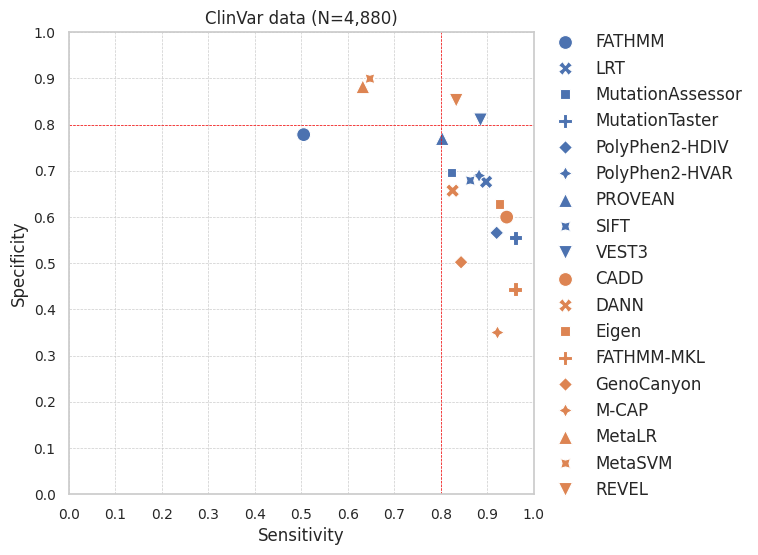

In [ ]:
sns.set(style="whitegrid")
plt.figure(figsize=(6, 6))

sns.scatterplot(data=score[score['category']=='Function Prediction'], x="Sensitivity", y="Specificity", style="Methods", s=100)
sns.scatterplot(data=score[score['category']=='Ensemble'], x="Sensitivity", y="Specificity", style="Methods", s=100)

plt.xlim(0, 1)
plt.ylim(0, 1)
plt.legend(bbox_to_anchor=(1, 1.03), loc='upper left',frameon=False,fontsize=12)
plt.title('ClinVar data (N=4,880)', )# weight='bold')
plt.xlabel('Sensitivity', )
plt.ylabel('Specificity', )
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
plt.grid(True, linestyle='--', linewidth=0.5)
#plt.gca().xaxis.set_major_locator(plt.MultipleLocator(0.1))
#plt.gca().yaxis.set_major_locator(plt.MultipleLocator(0.1))
plt.axvline(x=0.8, color='red', linestyle='--', linewidth=0.5)
plt.axhline(y=0.8, color='red', linestyle='--', linewidth=0.5)

plt.show()

## ref1_missing

In [ ]:
score['Total'] = 4880
score['Missing Rate'] = (score['Missing'] / score['Total']) * 100

<Axes: xlabel='Total', ylabel='Methods'>

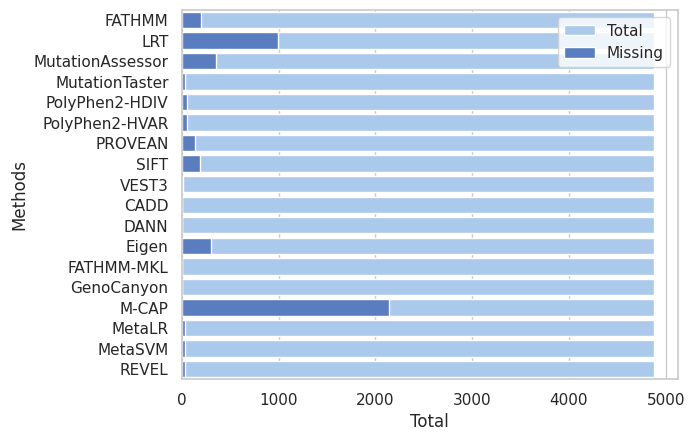

In [ ]:
# Plot the total crashes
sns.set_color_codes("pastel")
sns.barplot(x="Total", y="Methods", data=score,label="Total", color="b")

# Plot the crashes where alcohol was involved
sns.set_color_codes("muted")
sns.barplot(x="Missing", y="Methods", data=score,label="Missing", color="b")

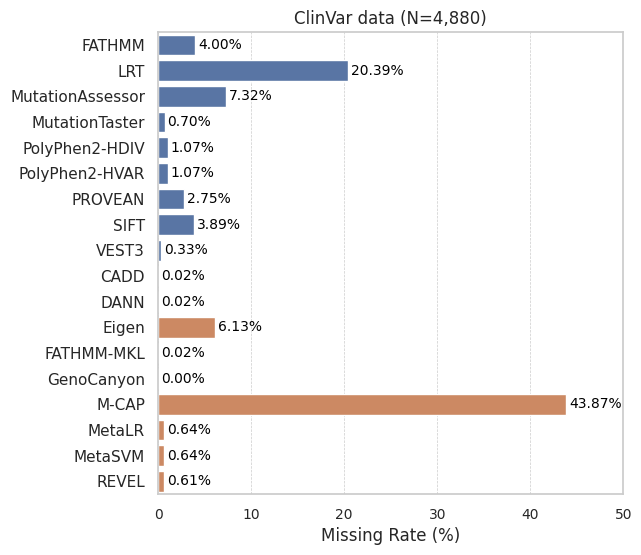

In [ ]:
plt.figure(figsize=(6, 6))
sns.set(style="whitegrid")
ax = sns.barplot(x="Missing Rate", y="Methods", hue='category',data=score,legend=False)

for p in ax.patches:
    ax.annotate(f'{p.get_width() :.2f}%',
                (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', fontsize=10, color='black', xytext=(2, 0),
                textcoords='offset points')

plt.xlabel('Missing Rate (%)')
plt.ylabel('')
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.xlim(0, 50)
plt.xticks(fontsize=10)
#plt.yticks(fontsize=12)
#plt.axvline(x=40, color='red', linestyle='--', linewidth=0.5)
plt.title('ClinVar data (N=4,880)')#, weight='bold')
plt.show()

# ref2_missing

In [ ]:
ref2 = {
    'Methods': ['FATHMM', 'LRT', 'MutationAssessor', 'MutationTaster', 'PolyPhen2' ,'SIFT'],
    'UniProt': [4.05, 10.49, 1.51, 0.04, 3.79, 6.91],
    'VariBench': [3.48, 7.97, 2.23, 0.1, 0.55, 3.83]
}


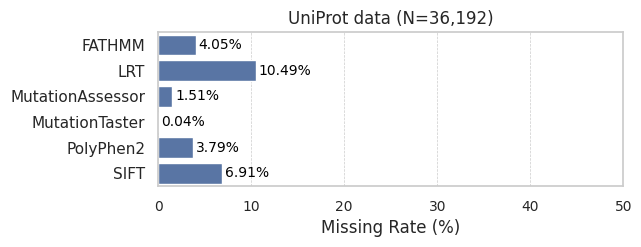

In [ ]:
plt.figure(figsize=(6, 2))
sns.set(style="whitegrid")
ax = sns.barplot(x="UniProt", y="Methods", data=ref2)

for p in ax.patches:
    ax.annotate(f'{p.get_width() :.2f}%',
                (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', fontsize=10, color='black', xytext=(2, 0),
                textcoords='offset points')

plt.xlabel('Missing Rate (%)')
plt.ylabel('')
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.xlim(0, 50)
plt.xticks(fontsize=10)
#plt.yticks(fontsize=12)
#plt.axvline(x=10, color='red', linestyle='--', linewidth=0.5)
plt.title('UniProt data (N=36,192)')
plt.show()

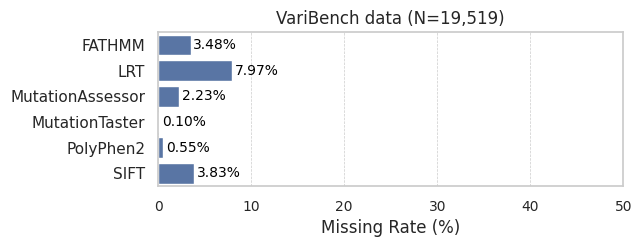

In [ ]:
plt.figure(figsize=(6, 2))
sns.set(style="whitegrid")

ax = sns.barplot(x="VariBench", y="Methods", data=ref2)

for p in ax.patches:
    ax.annotate(f'{p.get_width() :.2f}%',
                (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', fontsize=10, color='black', xytext=(2, 0),
                textcoords='offset points')

plt.xlabel('Missing Rate (%)')
plt.ylabel('')
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)
plt.xlim(0, 50)
#plt.yticks(fontsize=12)
plt.xticks(fontsize=10)
#plt.axvline(x=10, color='red', linestyle='--', linewidth=0.5)
plt.title('VariBench data (N=19,519)')
plt.show()

# missing

In [ ]:
prefix='clinvar'
inFile = fold_here + f'/{prefix}/{prefix}_compare_performace.csv'
print(inFile)
if(os.path.isfile(inFile)):
    score=pd.read_csv(inFile, sep=",", index_col = False, low_memory=False)
    print("ori", score.shape)
    display(score.head(5))
else:
    print("no_file")


/content/drive/MyDrive/Colab Notebooks/2024_model/clinvar/clinvar_compare_performace.csv
ori (26, 22)


,Name,Cutoff,AUC,AUPRC,Accuracy,F1,MCC,Precision,Recall(=Sens),Spec,PPV,NPV,FNR,FPR,TN,FP,FN,TP,N,N_miss,N_miss_0,N_miss_1
0,PRP,0.5,1.0000,1.0000,0.9998,0.9998,0.9996,0.9997,0.9999,0.9997,0.9997,0.9999,0.0001,0.0003,21494.0,7.0,2.0,26413.0,47916.0,0.0,0.0,0.0
1,MetaRNN,0.5,0.9960,0.9940,0.9733,0.9661,0.9441,0.9668,0.9654,0.9785,0.9668,0.9775,0.0346,0.0215,19408.0,427.0,446.0,12450.0,32731.0,15185.0,1666.0,13519.0
2,ClinPred,0.5,0.9946,0.9923,0.9702,0.9631,0.9381,0.9654,0.9609,0.9765,0.9654,0.9734,0.0391,0.0235,19266.0,464.0,527.0,12944.0,33201.0,14715.0,1771.0,12944.0
3,REVEL,0.5,0.9700,0.9558,0.9082,0.8895,0.8134,0.8535,0.9286,0.8948,0.8535,0.9499,0.0714,0.1052,15482.0,1821.0,816.0,10612.0,28731.0,19185.0,4198.0,14987.0
4,gMVP,0.5,0.9649,0.9487,0.8011,0.7898,0.6565,0.6621,0.9786,0.6914,0.6621,0.9812,0.0214,0.3086,10597.0,4729.0,203.0,9268.0,24797.0,23119.0,6175.0,16944.0


In [ ]:
N_num = {'clinvar':47916,'clinvar2':4935,'uniprot':5480, 'cosmic':2946}
_title = {'clinvar':'Training','clinvar2':'Test1','uniprot':'Test2', 'cosmic':'Test3'}

change_name = {'CADD_raw': 'CADD', 'fathmm-XF_coding': 'FATHMM-XF', 'fathmm-MKL_coding': 'FATHMM-MKL',
               'Polyphen2_HDIV':'PolyPhen2_HDiv', 'Polyphen2_HVAR':'PolyPhen2_HVar'}

cat = {'PRP':0, 'ClinPred':2, 'MetaRNN':2, 'REVEL':2, 'gMVP':1, 'MVP':2, 'CADD_raw':2, 'DEOGEN2':2,
       'MetaSVM':2, 'MetaLR':2, 'MutPred':1, 'VEST4':1, 'M-CAP':2, 'MutationAssessor':1, 'PROVEAN':1,
       'FATHMM':1, 'Polyphen2_HVAR':1, 'SIFT4G':1, 'SIFT':1, 'Polyphen2_HDIV':1, 'LIST-S2':1,
       'PrimateAI':1, 'MPC':2, 'DANN':2, 'fathmm-MKL_coding':1, 'fathmm-XF_coding':1}

score['cat'] = 1
for idx, value in enumerate(score['Name']):
    score.loc[idx, 'cat'] = cat[value]
    if value in change_name.keys():
        score['Name'] = score['Name'].replace(value, change_name[value])

score['Missing Rate'] = (score['N_miss'] / N_num[prefix])*100

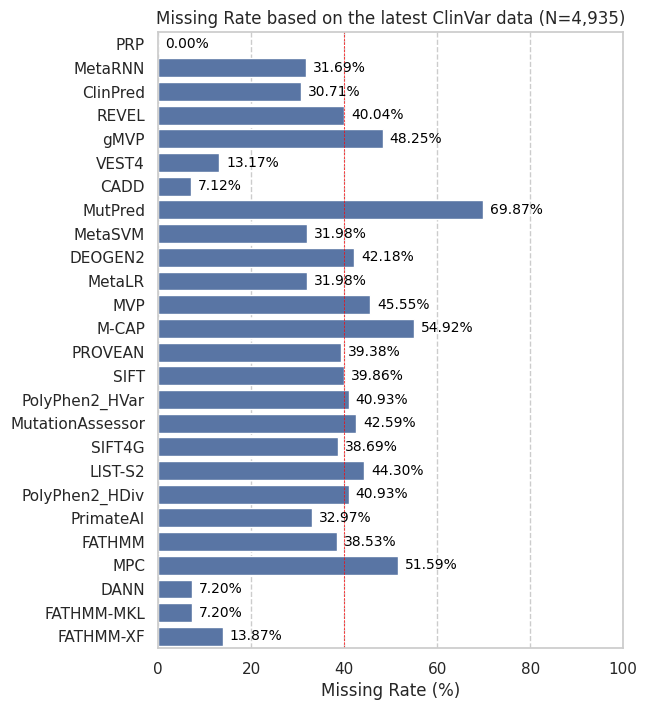

In [ ]:
plt.figure(figsize=(6, 8))

ax = sns.barplot(x="Missing Rate", y="Name", data=score)

for p in ax.patches:
    ax.annotate(f'{p.get_width() :.2f}%',
                (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                textcoords='offset points')

plt.xlabel('Missing Rate (%)')
plt.ylabel('')
plt.grid(True, axis='x', linestyle='--')
plt.xlim(0, 100)

plt.axvline(x=40, color='red', linestyle='--', linewidth=0.5)
plt.title('Missing Rate based on the latest ClinVar data (N=4,935)')
plt.show()

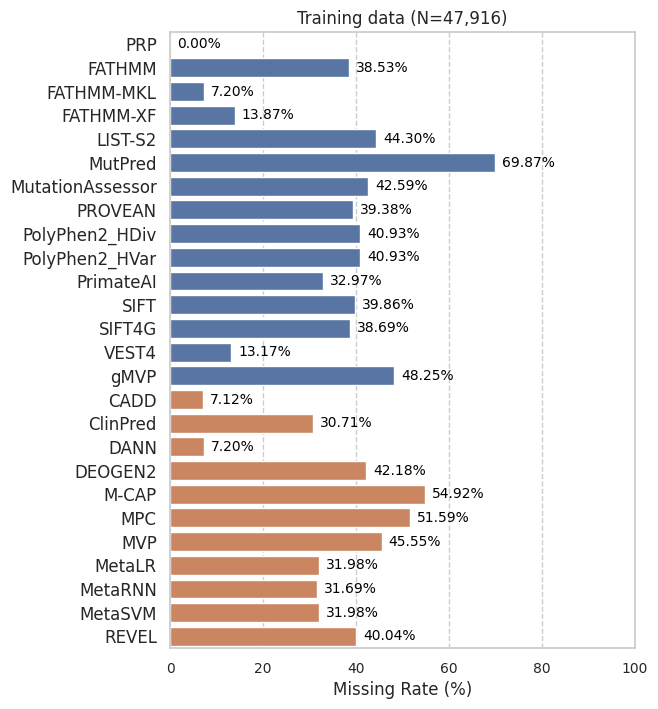

In [ ]:
score = score.sort_values(by=['cat', 'Name'])

plt.figure(figsize=(6, 8))
sns.set(style="whitegrid")
ax = sns.barplot(x="Missing Rate", y="Name", hue='cat',data=score,legend=False,
                 palette={0: 'red', 1: '#4C72B0', 2:'#DC814E'})

for p in ax.patches:
    ax.annotate(f'{p.get_width() :.2f}%',
                (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                textcoords='offset points')

plt.xlabel('Missing Rate (%)', fontsize=12)
plt.ylabel('')
plt.grid(True, axis='x', linestyle='--')
plt.xlim(0, 100)
plt.xticks(fontsize=10)
plt.yticks(fontsize=12)
#plt.axvline(x=40, color='red', linestyle='--', linewidth=0.5)
plt.title(f'{_title[prefix]} data (N={N_num[prefix]:,})')
plt.show()

# sens&spec

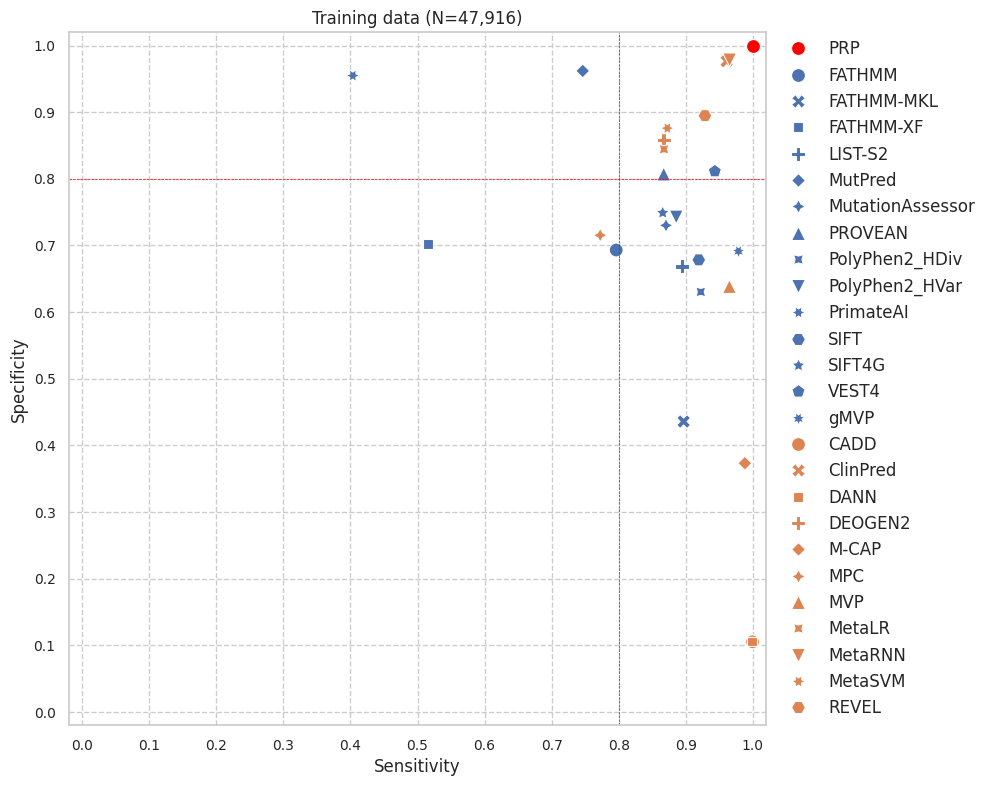

In [ ]:
plt.figure(figsize=(9, 9))
sns.set(style="whitegrid")
sns.scatterplot(data=score[score['cat']==0], x="Recall(=Sens)", y="Spec", style="Name", color='red', s=100)
sns.scatterplot(data=score[score['cat']==1], x="Recall(=Sens)", y="Spec", style="Name", s=100)
sns.scatterplot(data=score[score['cat']==2], x="Recall(=Sens)", y="Spec", style="Name", s=100)

plt.xlim(-0.02, 1.02)
plt.ylim(-0.02, 1.02)
plt.legend(bbox_to_anchor=(1, 1.01), loc='upper left',frameon=False, fontsize=12)
plt.title(f'{_title[prefix]} data (N={N_num[prefix]:,})', fontsize=12)

plt.grid(True, linestyle='--')
#plt.gca().xaxis.set_major_locator(plt.MultipleLocator(0.1))
#plt.gca().yaxis.set_major_locator(plt.MultipleLocator(0.1))
plt.axvline(x=0.8, color='red', linestyle='--', linewidth=0.5)
plt.axhline(y=0.8, color='red', linestyle='--', linewidth=0.5)
plt.xlabel('Sensitivity', fontsize=12)
plt.ylabel('Specificity', fontsize=12)
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
plt.show()

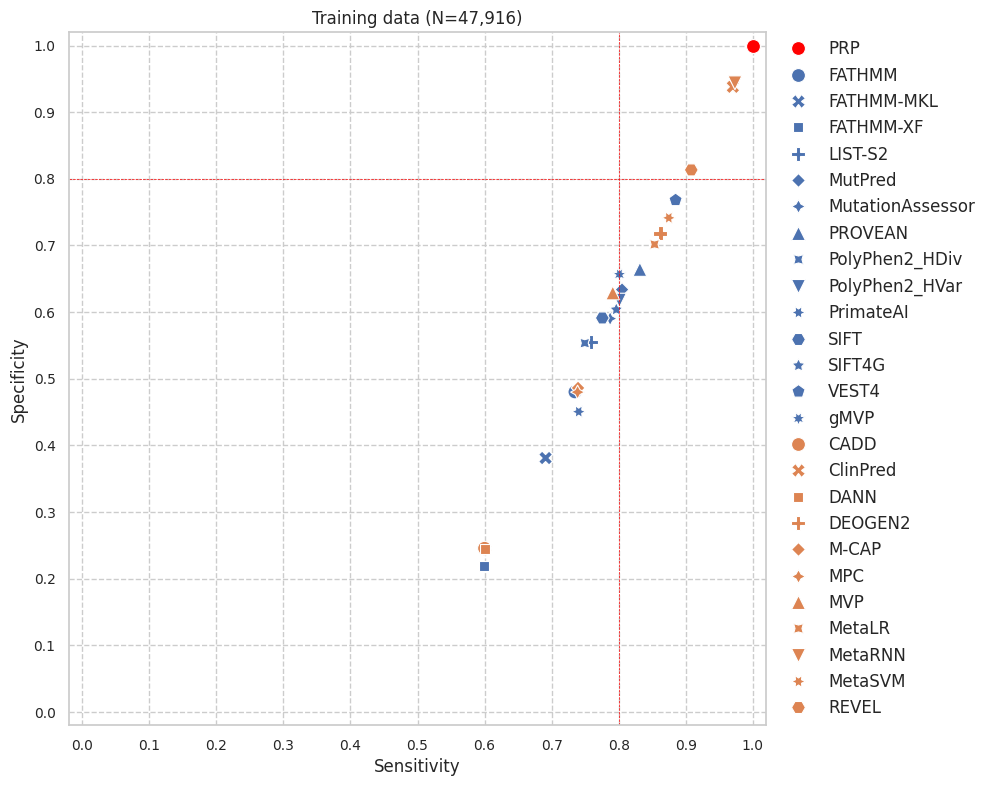

In [ ]:
plt.figure(figsize=(9, 9))
sns.set(style="whitegrid")
xName = 'Accuracy'
yName = 'MCC'
sns.scatterplot(data=score[score['cat']==0], x=xName, y=yName, style="Name", color='red', s=100)
sns.scatterplot(data=score[score['cat']==1], x=xName, y=yName, style="Name", s=100)
sns.scatterplot(data=score[score['cat']==2], x=xName, y=yName, style="Name", s=100)

plt.xlim(-0.02, 1.02)
plt.ylim(-0.02, 1.02)
plt.legend(bbox_to_anchor=(1, 1.01), loc='upper left',frameon=False, fontsize=12)
plt.title(f'{_title[prefix]} data (N={N_num[prefix]:,})', fontsize=12)

plt.grid(True, linestyle='--')
#plt.gca().xaxis.set_major_locator(plt.MultipleLocator(0.1))
#plt.gca().yaxis.set_major_locator(plt.MultipleLocator(0.1))
plt.axvline(x=0.8, color='red', linestyle='--', linewidth=0.5)
plt.axhline(y=0.8, color='red', linestyle='--', linewidth=0.5)
plt.xlabel('Sensitivity', fontsize=12)
plt.ylabel('Specificity', fontsize=12)
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],fontsize=10)
plt.show()

# varType

In [ ]:
prefix='uniprot'
inFile = fold_here + f'/{prefix}/{prefix}_thres_pred.csv'
print(inFile)
if(os.path.isfile(inFile)):
    score=pd.read_csv(inFile, sep=",", index_col = False, low_memory=False)
    print("ori", score.shape)
    display(score.head(5))
else:
    print("no_file")


/content/drive/MyDrive/Colab Notebooks/2024_model/uniprot/uniprot_thres_pred.csv
ori (5480, 28)


,Disease,varType,PRP,SIFT,SIFT4G,Polyphen2_HDIV,Polyphen2_HVAR,MutationAssessor,FATHMM,PROVEAN,VEST4,MetaSVM,MetaLR,MetaRNN,M-CAP,REVEL,MutPred,MVP,gMVP,MPC,PrimateAI,DEOGEN2,ClinPred,LIST-S2,CADD_raw,DANN,fathmm-MKL_coding,fathmm-XF_coding
0,0,m,0,1,1,0,0,-9,0,1,1,0,0,0,1,0,-9,1,1,1,0,0,0,1,1,1,1,1
1,0,m,0,-9,0,-9,-9,-9,-9,-9,0,0,0,0,-9,-9,-9,-9,0,-9,0,-9,0,0,0,1,0,-9
2,0,m,0,0,0,0,0,1,0,0,0,0,0,0,-9,0,-9,0,0,-9,0,0,0,-9,1,1,1,0
3,0,m,0,0,0,0,0,0,0,0,0,0,0,0,-9,0,-9,0,0,0,0,0,0,0,1,0,1,0
4,0,m,0,1,0,1,0,1,0,0,0,0,0,0,-9,0,0,-9,1,0,0,0,0,1,1,1,1,0


In [ ]:
# check eq
score['eq'] = 0
score['eq'] = (score['Disease'] == score['PRP']).astype(int)
score.head()
display(score.groupby('varType')['Disease'].value_counts().unstack(fill_value=0))
score.groupby(['varType', 'eq', 'Disease']).size().reset_index(name='Count')

Disease,0,1
varType,,
m,2991,2489


,varType,eq,Disease,Count
0,m,0,0,24
1,m,0,1,39
2,m,1,0,2967
3,m,1,1,2450


In [ ]:
_title = {'clinvar':'Training','clinvar2':'Test1','uniprot':'Test2', 'cosmic':'Test3'}

In [ ]:
# Calculate the count of each category
category_counts = score['varType'].value_counts().reset_index()
category_counts.columns = ['varType', 'count']
category_counts.loc[category_counts['varType'] == 'm', 'varType1'] = 'Missense'
category_counts.loc[category_counts['varType'] == 'n', 'varType1'] = 'StopGain'
category_counts.loc[category_counts['varType'] == 'i', 'varType1'] = 'StartLoss'
category_counts.loc[category_counts['varType'] == 't', 'varType1'] = 'StopLoss'
category_counts['rate'] = category_counts['count'] / score.shape[0] * 100
display(category_counts)

,varType,count,varType1,rate
0,m,5480,Missense,100.0


In [ ]:
# add uniprot
category_counts.loc[len(category_counts)] = ['n',0,'StopGain', 0]
category_counts.loc[len(category_counts)] = ['i',0,'StartLoss', 0]
category_counts.loc[len(category_counts)] = ['t',0,'StopLoss', 0]
display(category_counts)

,varType,count,varType1,rate
0,m,5480,Missense,100.0
1,n,0,StopGain,0.0
2,i,0,StartLoss,0.0
3,t,0,StopLoss,0.0


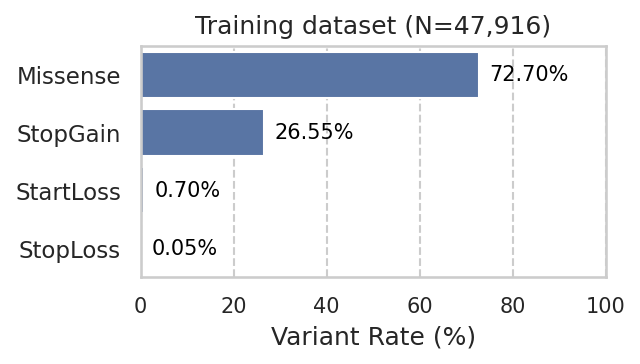

In [ ]:
# Plotting the barplot
sns.set(style="whitegrid")
plt.figure(figsize=(4, 2), dpi=150)
plt.grid(True, axis='x', linestyle='--')
ax=sns.barplot(x='rate', y='varType1', data=category_counts)

for p in ax.patches:
    if p.get_width() > 90:
        xPos = 75
    else:
        xPos = p.get_width()

    ax.annotate(f'{p.get_width() :.2f}%',
                (xPos, p.get_y() + p.get_height() / 2.),
                ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                textcoords='offset points')


# Add title and labels
plt.title(f'{_title[prefix]} dataset (N={score.shape[0]:,})', )
plt.xlabel('Variant Rate (%)', fontsize=12)
plt.ylabel('')
plt.xlim(0, 100)
plt.xticks(fontsize=10)
#plt.yticks(fontsize=12)
plt.show()

In [ ]:
change_name = {'CADD_raw': 'CADD', 'fathmm-XF_coding': 'FATHMM-XF', 'fathmm-MKL_coding': 'FATHMM-MKL',
               'Polyphen2_HDIV':'PolyPhen2_HDiv', 'Polyphen2_HVAR':'PolyPhen2_HVar'}
score = score.rename(columns=change_name)
score.apply(lambda col: (col == -9).sum())

Disease                0
varType                0
PRP                    0
SIFT                 810
SIFT4G               606
PolyPhen2_HDiv       685
PolyPhen2_HVar       685
MutationAssessor     799
FATHMM               713
PROVEAN              750
VEST4                543
MetaSVM              373
MetaLR               373
MetaRNN              336
M-CAP               2840
REVEL                742
MutPred             3093
MVP                 1673
gMVP                1442
MPC                 1543
PrimateAI            434
DEOGEN2              629
ClinPred             373
LIST-S2             1326
CADD                 336
DANN                 355
FATHMM-MKL           355
FATHMM-XF            783
dtype: int64

In [ ]:
cat = {'PRP':0, 'ClinPred':2, 'MetaRNN':2, 'REVEL':2, 'gMVP':1, 'MVP':2, 'CADD':2, 'DEOGEN2':2,
       'MetaSVM':2, 'MetaLR':2, 'MutPred':1, 'VEST4':1, 'M-CAP':2, 'MutationAssessor':1, 'PROVEAN':1,
       'FATHMM':1, 'PolyPhen2_HVar':1, 'SIFT4G':1, 'SIFT':1, 'PolyPhen2_HDiv':1, 'LIST-S2':1,
       'PrimateAI':1, 'MPC':2, 'DANN':2, 'FATHMM-MKL':1, 'FATHMM-XF':1}
colLists = score.loc[:, 'PRP':'FATHMM-XF'].columns.tolist()


In [ ]:
def _count(series):
    return (series == -9).sum()

# missing
count_miss = score.groupby('varType').apply(lambda x: x[colLists].apply(_count)).reset_index()
display(count_miss.T.head())

melt_miss = count_miss.melt(id_vars='varType', var_name='column', value_name='count')
display(melt_miss.head())

melt_miss.loc[melt_miss['varType'] == 'm', 'varType1'] = 'Missense'
melt_miss.loc[melt_miss['varType'] == 'n', 'varType1'] = 'StopGain'
melt_miss.loc[melt_miss['varType'] == 'i', 'varType1'] = 'StartLoss'
melt_miss.loc[melt_miss['varType'] == 't', 'varType1'] = 'StopLoss'

melt_miss['total'] = None
melt_miss['rate'] = None
# Set the value of 'total' to 1 for rows where 'varType' is 'i'

for idx, row in category_counts.iterrows():
    print(row['varType'], row['count'])

    melt_miss.loc[melt_miss['varType'] == row['varType'], 'total'] = row['count']
    melt_miss.loc[melt_miss['varType'] == row['varType'], 'missing_rate'] = (melt_miss.loc[melt_miss['varType'] == row['varType'],'count'] / row['count']) * 100
    melt_miss.loc[melt_miss['varType'] == row['varType'], 'full_rate'] = (100 - melt_miss.loc[melt_miss['varType'] == row['varType'], 'missing_rate'])
    melt_miss.loc[melt_miss['varType'] == row['varType'], 'total_rate'] = (melt_miss.loc[melt_miss['varType'] == row['varType'],'count'] / score.shape[0]) * 100

for key, value in cat.items():
    melt_miss.loc[melt_miss['column'] == key, 'cat'] = value
melt_miss['cat']=melt_miss['cat'].astype('int')
display(melt_miss.head())



,0
varType,m
PRP,0
SIFT,810
SIFT4G,606
PolyPhen2_HDiv,685


,varType,column,count
0,m,PRP,0
1,m,SIFT,810
2,m,SIFT4G,606
3,m,PolyPhen2_HDiv,685
4,m,PolyPhen2_HVar,685


m 5480
n 0
i 0
t 0


,varType,column,count,varType1,total,rate,missing_rate,full_rate,total_rate,cat
0,m,PRP,0,Missense,5480,None,0.000000,100.000000,0.000000,0
1,m,SIFT,810,Missense,5480,None,14.781022,85.218978,14.781022,1
2,m,SIFT4G,606,Missense,5480,None,11.058394,88.941606,11.058394,1
3,m,PolyPhen2_HDiv,685,Missense,5480,None,12.500000,87.500000,12.500000,1
4,m,PolyPhen2_HVar,685,Missense,5480,None,12.500000,87.500000,12.500000,1


<ipython-input-24-01601be21c86>:13: UserWarning: 
The palette list has fewer values (6) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(data=melt_miss[melt_miss['cat']==1], x='varType1', y=y_name, hue='column', dodge=True, jitter=True,
<ipython-input-24-01601be21c86>:16: UserWarning: 
The palette list has fewer values (6) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(data=melt_miss[melt_miss['cat']==2], x='varType1', y=y_name, hue='column', dodge=True, jitter=True,


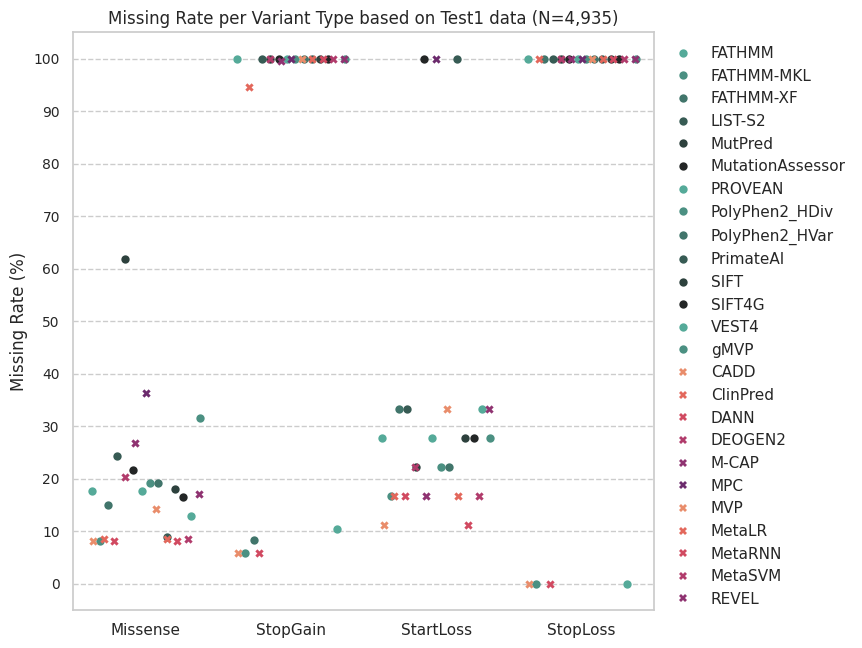

In [ ]:
custom_order = ['m', 'n', 'i', 't']
melt_miss['varType'] = pd.Categorical(melt_miss['varType'], categories=custom_order, ordered=True)

melt_miss = melt_miss.sort_values(by=['cat', 'column','varType'])

sns.set(style="whitegrid")
plt.figure(figsize=(7.5, 7.5))
y_name = 'missing_rate'
#sns.scatterplot(data=melt_miss[melt_miss['cat']==0], x="varType1", y="rate", style="column",s=50, color='red')

#sns.stripplot(data=melt_miss[melt_miss['cat']==0], x='varType1', y=y_name, hue='cat', dodge=True, jitter=True,
#             palette={0: 'red', 1: '#3274A1', 2:'#E1812C'})
sns.stripplot(data=melt_miss[melt_miss['cat']==1], x='varType1', y=y_name, hue='column', dodge=True, jitter=True,
             size=6, palette = sns.color_palette("dark:#5A9_r", as_cmap=False))

sns.stripplot(data=melt_miss[melt_miss['cat']==2], x='varType1', y=y_name, hue='column', dodge=True, jitter=True,
             size=6, palette = sns.color_palette("flare", as_cmap=False), marker="X")
#sns.stripplot(data=melt_miss, x='varType1', y='rate', hue='cat', dodge=True, jitter=True,
#              palette={0: 'red', 1: '#3274A1', 2:'#E1812C'})

plt.legend(bbox_to_anchor=(1, 1), loc='upper left',frameon=False)
plt.xlabel('')
plt.ylabel('Missing Rate (%)')

plt.yticks([0,10,20,30,40,50,60,70,80,90,100], fontsize=10)
plt.grid(True, axis='y', linestyle='--')
plt.grid(False, axis='x',)
plt.title(f'Missing Rate per Variant Type based on {_title[prefix]} data (N={score.shape[0]:,})')
plt.show()

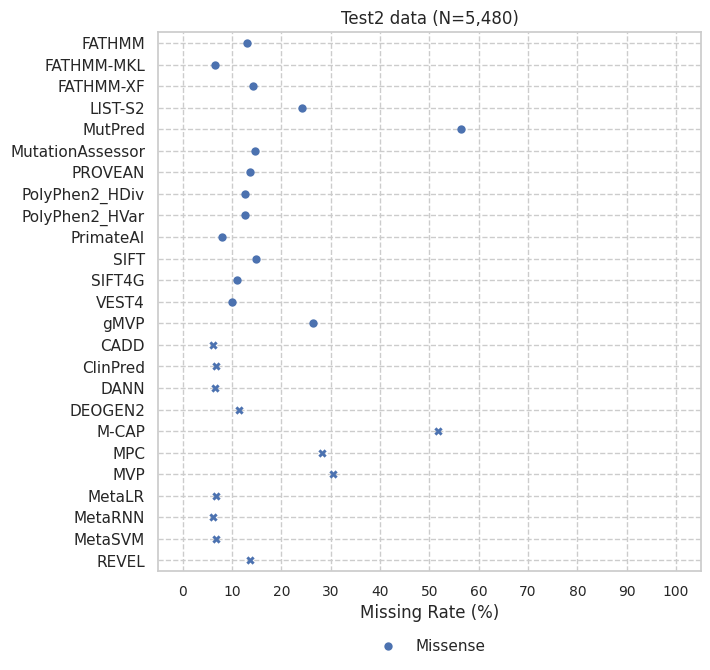

In [ ]:
markers = {'Missense': 'o', 'StopGain': 's', 'StartLoss': '^', 'StopLoss':'^'}

custom_order = ['m', 'n', 'i', 't']
melt_miss['varType'] = pd.Categorical(melt_miss['varType'], categories=custom_order, ordered=True)
melt_miss = melt_miss.sort_values(by=['cat', 'column','varType'])

sns.set(style="whitegrid")
plt.figure(figsize=(7, 7))
#sns.scatterplot(data=melt_miss[melt_miss['cat'] == 1],
#                y='column', x='missing_rate', hue='varType1',
#                style='varType1', markers=markers, #dodge=True,
#                size=6, color='red')
sns.stripplot(data=melt_miss[melt_miss['cat'] == 1], y='column', x='missing_rate', hue='varType1',
              dodge=True, jitter=True,size=6, marker='o')
sns.stripplot(data=melt_miss[melt_miss['cat'] == 2], y='column', x='missing_rate', hue='varType1',
              dodge=True, jitter=True,size=6, marker='X', legend=False)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4,frameon=False,)
plt.xlabel('Missing Rate (%)')
plt.ylabel('')
plt.xlim(-5,105)
plt.xticks([0,10,20,30,40,50,60,70,80,90,100], fontsize=10)
plt.grid(True, axis='y', linestyle='--')
plt.grid(True, axis='x', linestyle='--')
plt.title(f'{_title[prefix]} data (N={score.shape[0]:,})')
plt.show()


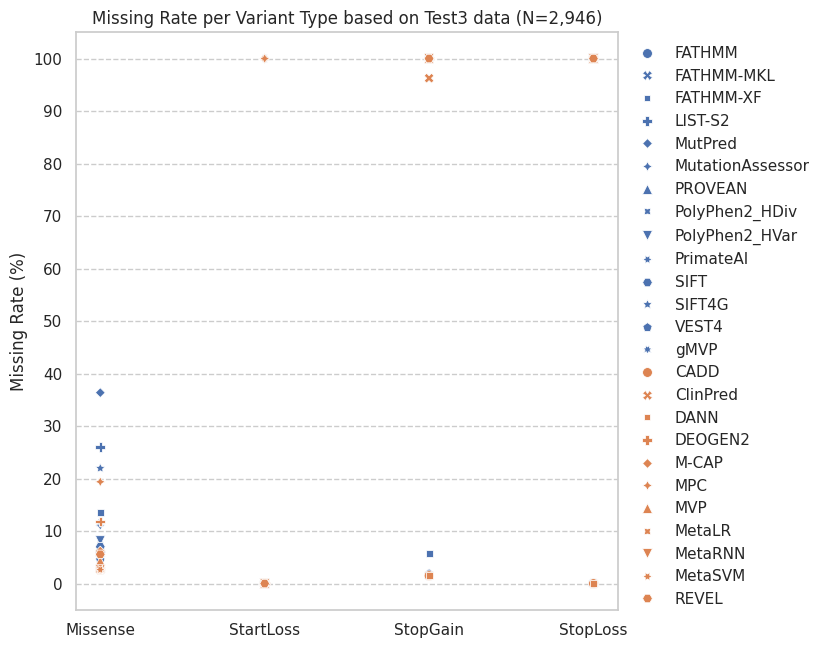

In [ ]:
melt_miss = melt_miss.sort_values(by=['cat', 'column','varType1'])

sns.set(style="whitegrid")
plt.figure(figsize=(7, 7.5))
y_name = 'missing_rate'
#sns.scatterplot(x='varType1', y='rate', hue='column', data=melt_miss, style='column')
#sns.scatterplot(data=melt_miss[melt_miss['cat']==0], x="varType1", y=y_name, style="column",s=50, color='red')
sns.scatterplot(data=melt_miss[melt_miss['cat']==1], x="varType1", y=y_name, style="column",s=50)
sns.scatterplot(data=melt_miss[melt_miss['cat']==2], x="varType1", y=y_name, style="column",s=50)
#sns.scatterplot(data=melt_miss[melt_miss['cat']==0], x="varType1", y=y_name, style="column",s=50,
#                color='red',legend=False)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left',frameon=False,)
plt.xlabel('')
plt.ylabel('Missing Rate (%)')
plt.yticks([0,10,20,30,40,50,60,70,80,90,100])
plt.grid(True, axis='y', linestyle='--')
plt.grid(False, axis='x',)
plt.title(f'Missing Rate per Variant Type based on {_title[prefix]} data (N={score.shape[0]:,})')
plt.show()

In [ ]:
import plotly.express as px

custom_order = ['m', 'n', 'i', 't']
melt_miss['varType'] = pd.Categorical(melt_miss['varType'], categories=custom_order, ordered=True)
melt_miss = melt_miss.sort_values(by=['cat', 'column','varType'], ascending=[False, False, True])

color_map = {
    'Missense': '#5975A4',
    'StopGain': '#DC814E',
    'StartLoss': '#7FB28B',
    'StopLoss': '#B25659'
}
fig = px.bar(melt_miss, y='column', x="full_rate", color="varType1",
             text=melt_miss['full_rate'].round(2),
             color_discrete_map=color_map
             )
fig.update_layout(width=600, height=600,
                  margin_l=10, margin_r=10, margin_b=10, margin_t=30,
                  legend_title_text='',
                  xaxis_title='', yaxis_title='',
                  title = {'text': f'{_title[prefix]} dataset (N={score.shape[0]:,})','x': 0.5,'xanchor': 'center'})

fig.show()

In [ ]:
custom_order = ['m', 'n', 'i', 't']
melt_miss['varType'] = pd.Categorical(melt_miss['varType'], categories=custom_order, ordered=True)
melt_miss = melt_miss.sort_values(by=['cat', 'column','varType'], ascending=[False, False, True])

color_map = {
    'Missense': '#5975A4',
    'StopGain': '#DC814E',
    'StartLoss': '#7FB28B',
    'StopLoss': '#B25659'
}
fig = px.bar(melt_miss, y='column', x="total_rate", color="varType1",
             text=melt_miss['missing_rate'].round(2),
             color_discrete_map=color_map
             )
fig.update_layout(width=600, height=600,
                  margin_l=10, margin_r=10, margin_b=10, margin_t=30,
                  legend_title_text='',
                  xaxis_title='', yaxis_title='',
                  title = {'text': f'{_title[prefix]} dataset (N={score.shape[0]:,})','x': 0.5,'xanchor': 'center'})

fig.show()

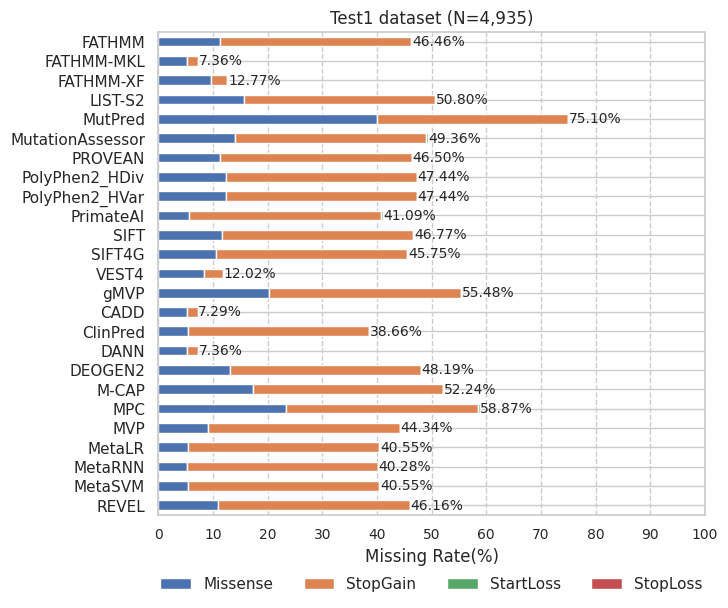

In [ ]:
# cumulate bar chart - missing

df_pivot = melt_miss.pivot(index=['cat','column'], columns='varType1', values='total_rate')
df_pivot = df_pivot[~(df_pivot.index.get_level_values('column') == 'PRP')]
if prefix == 'uniprot':
    df_pivot['StopGain']=0
    df_pivot['StartLoss']=0
    df_pivot['StopLoss']=0

df_pivot = df_pivot[['Missense','StopGain','StartLoss','StopLoss']]
df_pivot = df_pivot.sort_index(level=['cat', 'column'], ascending=[False, False])

# 가로형 스택형 막대 그래프 그리기
ax = df_pivot.plot(kind='barh', stacked=True, figsize=(8, 6))

cumulative_sums = df_pivot.sum(axis=1)

# 누적 값 추가
for index, (col, total) in enumerate(cumulative_sums.items()):
    ax.text(total, index, f'{total:.2f}%', ha='left', va='center', fontsize=10)


#plt.legend(title='', bbox_to_anchor=(0, 0), loc='upper left',frameon=False,)  # 범례를 그래프 밖에 위치시킴
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4,frameon=False,)

plt.xlim(0, 100)
plt.tight_layout()
plt.ylabel('')
plt.xlabel('Missing Rate(%)')
plt.title(f'{_title[prefix]} dataset (N={score.shape[0]:,})')
plt.grid(True, axis='x', linestyle='--')
plt.xticks([0,10,20,30,40,50,60,70,80,90,100],fontsize=10)
ax.set_yticklabels(df_pivot.index.get_level_values('column'))
plt.show()

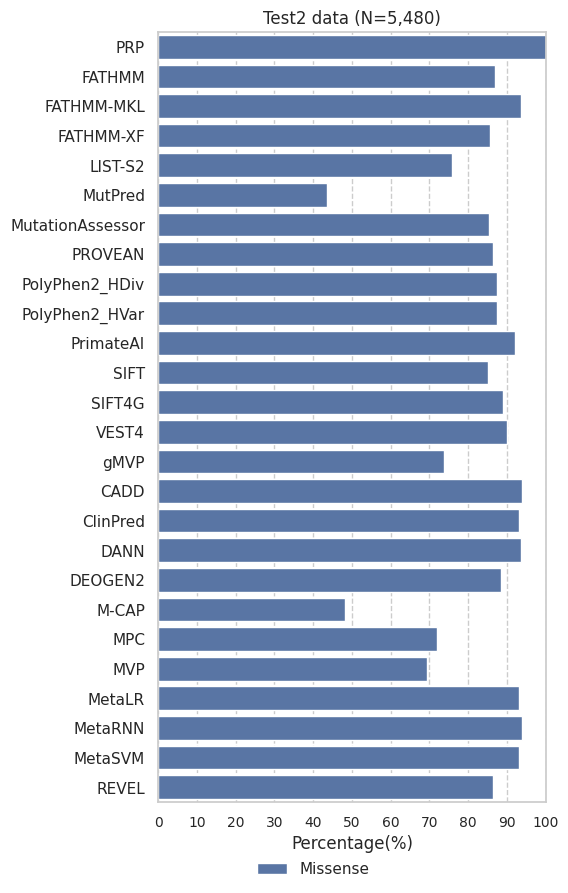

In [ ]:
custom_order = ['m', 'n', 'i', 't']
melt_miss['varType'] = pd.Categorical(melt_miss['varType'], categories=custom_order, ordered=True)
melt_miss = melt_miss.sort_values(by=['cat', 'column','varType'])

plt.figure(figsize=(5, 10))

sns.barplot(melt_miss, x="full_rate", y="column", hue="varType1")
plt.ylabel('')
plt.xlabel('Percentage(%)')
plt.grid(True, axis='x', linestyle='--')
plt.xlim(0, 100)
plt.xticks(fontsize=10)
#plt.legend(bbox_to_anchor=(1, 1), loc='upper left',frameon=False)
plt.legend(loc='upper center', bbox_to_anchor=(0.4, -0.06), ncol=4,frameon=False,)

plt.title(f'{_title[prefix]} data (N={N_num[prefix]:,})')

plt.xticks([0,10,20,30,40,50,60,70,80,90,100],fontsize=10)

plt.show()

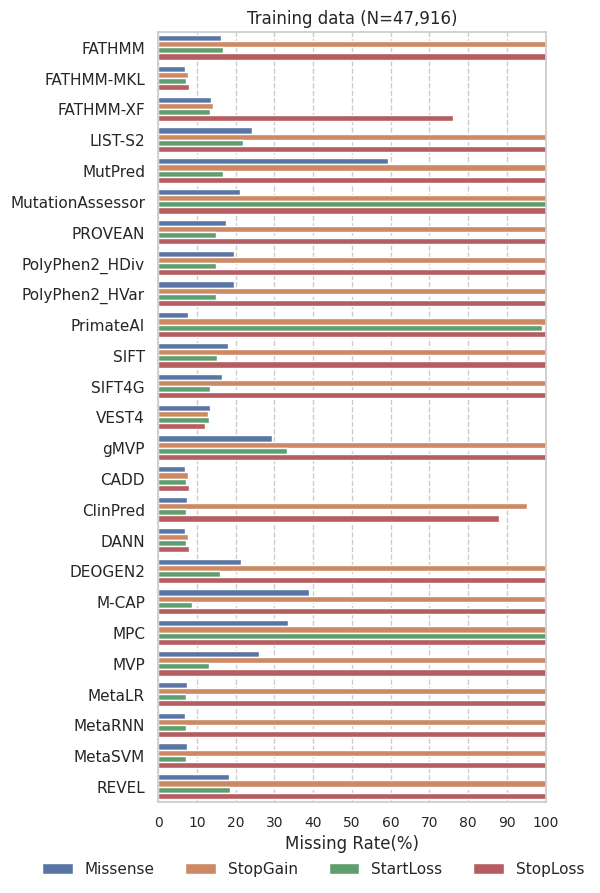

In [ ]:
custom_order = ['m', 'n', 'i', 't']
melt_miss['varType'] = pd.Categorical(melt_miss['varType'], categories=custom_order, ordered=True)
melt_miss = melt_miss.sort_values(by=['cat', 'column','varType'])

plt.figure(figsize=(5, 10))

sns.barplot(melt_miss[~(melt_miss['column'] == 'PRP')],
            x="missing_rate", y="column", hue="varType1")
plt.ylabel('')
plt.xlabel('Missing Rate(%)')
plt.grid(True, axis='x', linestyle='--')
plt.xlim(0, 100)
plt.xticks(fontsize=10)
#plt.legend(bbox_to_anchor=(1, 1), loc='upper left',frameon=False)
plt.legend(loc='upper center', bbox_to_anchor=(0.4, -0.06), ncol=4,frameon=False,)

plt.title(f'{_title[prefix]} data (N={N_num[prefix]:,})')

plt.xticks([0,10,20,30,40,50,60,70,80,90,100],fontsize=10)

plt.show()

In [ ]:
prp = {'data': ['Training','Test1', 'Test2', 'Test3'],
        'Missense': [34834, 3188, 5480, 2409],
        'StopGain': [12722, 1726, 0, 535],
        'StartLoss': [335, 18, 0, 1],
        'StopLoss': [25,3,0,1]}

df_pivot = pd.DataFrame(prp)
df_pivot.set_index('data', inplace=True)
df_pivot

,Missense,StopGain,StartLoss,StopLoss
data,,,,
Training,34834,12722,335,25
Test1,3188,1726,18,3
Test2,5480,0,0,0
Test3,2409,535,1,1


In [ ]:
df_pivot.sum(axis=1)
df_rate=pd.DataFrame()
df_rate = df_pivot.div(df_pivot.sum(axis=1), axis=0) *100

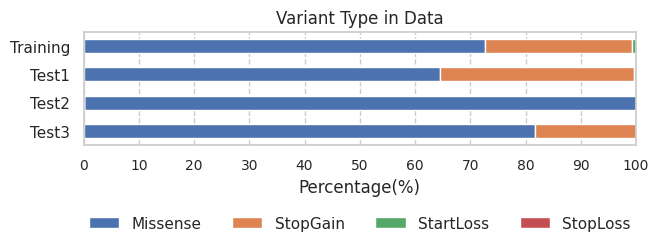

In [ ]:
#df_rate = df_rate.sort_index(level=['data'], ascending=[True])
new_order = ['Test3','Test2','Test1','Training']

# 데이터프레임의 인덱스를 새로운 순서로 재정렬
df_rate = df_rate.reindex(new_order)

df_rate.plot(kind='barh', stacked=True, figsize=(7, 3))

#plt.legend(title='', bbox_to_anchor=(0, 0), loc='upper left',frameon=False,)  # 범례를 그래프 밖에 위치시킴
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.5), ncol=4,frameon=False,)

plt.xlim(0, 100)
plt.tight_layout()
plt.ylabel('')
plt.xlabel('Percentage(%)')
plt.title('Variant Type in Data')
plt.grid(True, axis='x', linestyle='--')
plt.xticks([0,10,20,30,40,50,60,70,80,90,100],fontsize=10)
plt.show()

In [ ]:
# cumulate bar chart - missing

#df_pivot = df_pivot[['Missense','StopGain','StartLoss','StopLoss']]
#df_pivot = df_pivot.sort_index(level=['cat', 'column'], ascending=[False, False])

# 가로형 스택형 막대 그래프 그리기
ax = df_pivot.plot(kind='barh', stacked=True, figsize=(8, 6))

cumulative_sums = df_pivot.sum(axis=1)

# 누적 값 추가
for index, (col, total) in enumerate(cumulative_sums.items()):
    ax.text(total, index, f'{total:.2f}%', ha='left', va='center', fontsize=10)


#plt.legend(title='', bbox_to_anchor=(0, 0), loc='upper left',frameon=False,)  # 범례를 그래프 밖에 위치시킴
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4,frameon=False,)

plt.xlim(0, 100)
plt.tight_layout()
plt.ylabel('')
plt.xlabel('Missing Rate(%)')
plt.title(f'{_title[prefix]} dataset (N={score.shape[0]:,})')
plt.grid(True, axis='x', linestyle='--')
plt.xticks([0,10,20,30,40,50,60,70,80,90,100],fontsize=10)
ax.set_yticklabels(df_pivot.index.get_level_values('column'))
plt.show()

# missing & vartype - pairgrid+stirpplot

In [ ]:
var_dict = {'m':'Missense', 'n':'StopGain', 'i':'StartLoss', 't':'StopLoss'}
cat = {'PRP':0, 'ClinPred':2, 'MetaRNN':2, 'REVEL':2, 'gMVP':1, 'MVP':2, 'CADD':2, 'DEOGEN2':2,
       'MetaSVM':2, 'MetaLR':2, 'MutPred':1, 'VEST4':1, 'M-CAP':2, 'MutationAssessor':1, 'PROVEAN':1,
       'FATHMM':1, 'PolyPhen2_HVar':1, 'SIFT4G':1, 'SIFT':1, 'PolyPhen2_HDiv':1, 'LIST-S2':1,
       'PrimateAI':1, 'MPC':2, 'DANN':2, 'FATHMM-MKL':1, 'FATHMM-XF':1}
var_miss = melt_miss.pivot(index='column', columns='varType', values='count').reset_index()
var_miss = var_miss[var_miss['column'] != 'PRP']

for key, value in cat.items():
    var_miss.loc[var_miss['column'] == key, 'cat'] = value
var_miss['cat'] = var_miss['cat'].astype('int')

for idx, row in category_counts.iterrows():
    var_miss[var_dict[row['varType']]] = (var_miss[row['varType']] / row['count'])*100

var_miss.head()

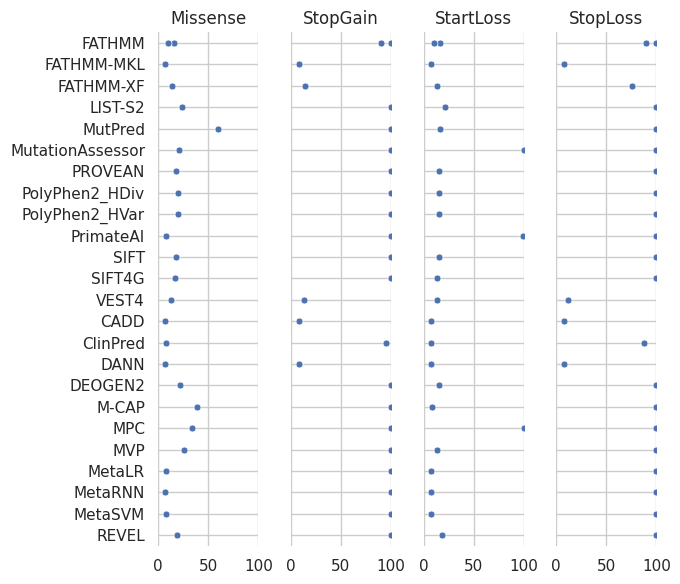

In [ ]:
# Make the PairGrid
from matplotlib.ticker import MultipleLocator
sns.set(style="whitegrid")
colNames = ['Missense', 'StopGain', 'StartLoss', 'StopLoss']
g = sns.PairGrid(var_miss.sort_values(["cat",'column'], ascending=True),
                 x_vars=colNames, y_vars=["column"],
                 height=6, aspect=.25)


# Draw a dot plot using the stripplot function
g.map(sns.stripplot, size=5, orient="h", jitter=False,
      palette="flare_r", linewidth=0.5, edgecolor="w")

# Use the same x axis limits on all columns and add better labels
g.set(xlim=(0, 100),
      xlabel="",
      ylabel="")

#for ax in g.axes.flat:
#    ax.xaxis.set_major_locator(MultipleLocator(0.1))
#    ax.set_xticks(np.arange(0, 1.1, 0.1))

# Use semantically meaningful titles for the columns
titles = colNames

for ax, title in zip(g.axes.flat, titles):

    # Set a different title for each axes
    ax.set(title=title)

    # Make the grid horizontal instead of vertical
    ax.xaxis.grid(True, )
    ax.yaxis.grid(True, )

sns.despine(left=True, bottom=True)

#==================================================

# Train dataset

## read_data

In [ ]:
def read_train_test_file(in_fold, _set,):
    _df = {}
    for _name in _set:
        in_file = in_fold + f"/_{_name}.dataset.train.test"

        _df[_name] = pd.read_csv(in_file, sep="\t", index_col = False, low_memory=False)
        _df[_name]['#chr'] = _df[_name]['#chr'].astype(str)
        _df[_name] = _df[_name].rename(columns = {'v2_AF':'gnomAD_exom_v2_AF',
                                                  'v4_AF':'gnomAD_exom_v4_AF',
                                    'v2_AF_popmax':'gnomAD_exom_v2_AF_popmax',
                                    'v4_AF_popmax':'gnomAD_exom_v4_AF_popmax',})

        print(f'!!! READ({_name})\t{_df[_name].shape}')
        display(_df[_name].head(1))

        # DEF : remove_intra_duplicate
        if _name != 'bn_set':
            _df = remove_intra_duplicate(_df, _name)

    # DEF : make_train_clinvar1()
    _df = make_train_clinvar1(_df, 'clinvar')

    # DEF : add_bn()
    _df = add_bn(_df, ['clinvar','clinvar1'], 'bn_set',['only_0.0003','and_0.0003'])

    # DEF : split_test_group()
    _df = split_test_group(_df, 'test_set')

    # DEF : count_clnSig2()
    #_lists = []
    _lists = count_clnSig2(_df, ['test_set','bn_set'])
    display(pd.concat(_lists, axis=1).T.sort_index())
    return _df

def remove_intra_duplicate(_df, _name):
    _cols = ['#chr', 'pos', 'alRef', 'alAlt']

    _n = _df[_name].shape[0]
    _dup_cnt = _df[_name].duplicated(subset=_cols).sum()
    if _dup_cnt > 0:
        _df[_name] = _df[_name].drop_duplicates(subset=_cols).reset_index(drop=True)
    print(f"!!! CHECK_DUP({_name})\tORI: {_n}\tDUP: {_dup_cnt}\tREMAIN: {_df[_name].shape[0]}")
    return _df

def make_train_clinvar1(_df, _name):
    _name1 = f'{_name}1'
    _df[_name1] = _df[_name][(_df[_name]['gnomAD_exom_v2_AF'].notna()) | (_df[_name]['gnomAD_exom_v4_AF'].notna())].reset_index(drop=True)
    print(f"!!! DATASET\tORI({_name}): {_df[_name].shape[0]}\tNEW({_name1}): {_df[_name1].shape[0]}")
    return _df

def add_bn(_df, _nameL1, _name2, _groupL):
    for _name1 in _nameL1:
        for _group in _groupL:
            _name = f'{_name1}_{_group}'
            _tmp = _df[_name2][_df[_name2]['group']==_group]
            _df[_name] = pd.concat([_df[_name1], _tmp]).reset_index(drop=True)
            print(f"!!! ADD\t{_name1}({_df[_name1].shape[0]}) + {_group}({_tmp.shape[0]}) = {_name}({_df[_name].shape[0]})")
    return _df

def split_test_group(_df, _name):
    for _group in _df[_name]['group'].unique():
        _df[_group] = _df[_name][_df[_name]['group']==_group]

        _name1 = f'{_group}_1'
        _df[_name1] = _df[_group][_df[_group]['24.clnSig2'].isin(['0','1'])].reset_index(drop=True)
        _df[_name1]['clnSig2'] = _df[_name1]['24.clnSig2'].astype('int')
        print(f"!!! SPLIT\t{_group}: {_df[_group].shape[0]}\t{_name1}: {_df[_name1].shape[0]}")
    return _df

def count_clnSig2(_df,_delL):
    _lists = []
    _set = _df.keys()
    for _name in _set:
        _des = _df[_name]['clnSig2'].value_counts()
        _des['Name'] = _name
        _des['Num'] = _df[_name].shape[0]
        _des['Del'] = 'x'

        if _name in _delL:
            _des['Del'] = 'o'
        _lists.append(_des)

    for _name in _delL:
        del _df[_name]
    return _lists

def count_varType(_df):
    print("=== DEF: count_varType()")
    _return = None

    for _k in [None, 0, 1]:
        if _k is None:
            _des = _df['varType'].value_counts().to_frame(name='count')
            _k = 'All'
        else:
            _des = _df.loc[_df['clnSig2'] == _k, 'varType'].value_counts().to_frame(name='count')
            _des[f'{_k}_ratio1'] = (_des['count'] / _df[_df['clnSig2']==_k].shape[0]) * 100

        _des[f'{_k}_ratio'] = (_des['count'] / _df.shape[0]) * 100
        _des.rename(columns={'count': f'{_k}_count'}, inplace=True)
        _des.reset_index(inplace=True)

        if _return is None:
            _return = _des
        else:
            _return = pd.merge(_return, _des, on='varType', how='outer')

    _return = _return.fillna(0)
    _total = ['total'] + list(_return.select_dtypes(include=['number']).sum().values)
    _return.loc[_return.shape[0]] = _total

    return(_return)

In [ ]:
_fold = "01_data"
in_fold = fold_here + "/" + _fold
_set = ['clinvar','bn_set','test_set']
_trainSet = read_train_test_file(in_fold, _set,)
_trainSet.keys()

!!! READ(clinvar)	(47884, 83)


,#chr,pos,strand,alRef,alAlt,clinvarId,dataset,clnSig,clnStat,varType,unique,geneId,ccdsId,MANE,codonPos,codonRef,codonAlt,aaRef1,aaAlt1,codonRefFreq,codonAltFreq,codonSTFreq,aaSTFreq,blosum62,pam250,grantham,pc100pfam,pc470pfam,pp100pfam,pp470pfam,pc100gene,pc470gene,pp100gene,pp470gene,aa1,aa3,p100way2a,p100way5,p470way2a,p470way5,c100way2a,c100way5,c470way2a,c470way5,neigh_aa3RefFreqA,neigh_aa3AltFreqA,multiz_alRefFreq,multiz_alAltFreq,multiz_aaRefFreq,multiz_aaAltFreq,gnomAD_exom_v2_AF,gnomAD_exom_v2_AF_popmax,gnomAD_exom_v4_AF,gnomAD_exom_v4_AF_popmax,v2_pos11,v2_pos12,v2_pos13,v2_pos21,v2_pos22,v2_pos23,v2_pos31,v2_pos32,v2_pos33,v4_pos11,v4_pos12,v4_pos13,v4_pos21,v4_pos22,v4_pos23,v4_pos31,v4_pos32,v4_pos33,pLi,pNull,pRec,syn.oe,mis.oe,lof.oe,syn.zscore,mis.zscore,lof.zscore,constraint,clnSig2
0,1,1014228,+,G,A,402986,1,1,2,m,6602,9636,CCDS6.1,1,2,AGC,AAC,S,N,0.238122,0.518446,0.000324,0.000152,1,1,46.0,NaN,NaN,NaN,NaN,0.251,0.392,0.177,0.953,L,I,-0.004667,-0.396,1.887667,-0.065,0.026667,0.0,0.41,0.058,0.071805,0.046254,0.45,0.3,0.41,0.1,0.359335,0.414589,0.382674,0.407038,0.0,0.0,0.000012,0.0,0.359335,0.0,0.0,0.0,0.0,6.843540e-07,0.0,0.000004,0.0,0.382674,0.0,0.0,6.843550e-07,0.000001,0.11305,0.17524,0.7117,8.9000e-01,0.842,0.76577,NaN,7.1553e+01,238.38,NaN,0


!!! CHECK_DUP(clinvar)	ORI: 47884	DUP: 1	REMAIN: 47883
!!! READ(bn_set)	(12000, 70)


,#chr,pos,strand,alRef,alAlt,clinvarId,dataset,clnSig,clnStat,varType,unique,geneId,ccdsId,MANE,codonPos,codonRef,codonAlt,aaRef1,aaAlt1,codonRefFreq,codonAltFreq,codonSTFreq,aaSTFreq,blosum62,pam250,grantham,pc100pfam,pc470pfam,pp100pfam,pp470pfam,pc100gene,pc470gene,pp100gene,pp470gene,aa1,aa3,p100way2a,p100way5,p470way2a,p470way5,c100way2a,c100way5,c470way2a,c470way5,neigh_aa3RefFreqA,neigh_aa3AltFreqA,multiz_alRefFreq,multiz_alAltFreq,multiz_aaRefFreq,multiz_aaAltFreq,gnomAD_exom_v2_AF,gnomAD_exom_v2_AF_popmax,v2_cAF,v2_cAF_popmax,gnomAD_exom_v4_AF,gnomAD_exom_v4_AF_popmax,v4_cAF,v4_cAF_popmax,pLi,pNull,pRec,syn.oe,mis.oe,lof.oe,syn.zscore,mis.zscore,lof.zscore,constraint,clnSig2,group
0,1,37566982,-,C,T,2594981,29889,2,1,m,6807,29889,CCDS421.1,1,2,CGG,CAG,R,Q,0.200992,0.729797,0.002064,0.000415,1,1,43.0,NaN,NaN,NaN,NaN,0.804,0.781,3.98,4.601,Q,P,1.856,1.166,1.098667,1.135,0.595,0.791,0.617,0.852,0.051384,0.062013,0.41,0.55,0.4,0.37,0.000064,0.000163,0.000064,0.000221,0.000128,0.000149,NaN,NaN,0.000083,0.005495,0.99442,0.89726,0.86838,0.57723,0.78654,1.1348,2.3097,[],0,only_0.0003


!!! READ(test_set)	(38293, 87)


,#chr,pos,strand,alRef,alAlt,clinvarId,dataset,clnSig,clnStat,varType,unique,geneId,ccdsId,MANE,codonPos,codonRef,codonAlt,aaRef1,aaAlt1,codonRefFreq,codonAltFreq,codonSTFreq,aaSTFreq,blosum62,pam250,grantham,pc100pfam,pc470pfam,pp100pfam,pp470pfam,pc100gene,pc470gene,pp100gene,pp470gene,aa1,aa3,p100way2a,p100way5,p470way2a,p470way5,c100way2a,c100way5,c470way2a,c470way5,neigh_aa3RefFreqA,neigh_aa3AltFreqA,multiz_alRefFreq,multiz_alAltFreq,multiz_aaRefFreq,multiz_aaAltFreq,gnomAD_exom_v2_AF,gnomAD_exom_v2_AF_popmax,gnomAD_exom_v4_AF,gnomAD_exom_v4_AF_popmax,v2_pos11,v2_pos12,v2_pos13,v2_pos21,v2_pos22,v2_pos23,v2_pos31,v2_pos32,v2_pos33,v4_pos11,v4_pos12,v4_pos13,v4_pos21,v4_pos22,v4_pos23,v4_pos31,v4_pos32,v4_pos33,pLi,pNull,pRec,syn.oe,mis.oe,lof.oe,syn.zscore,mis.zscore,lof.zscore,constraint,clnSig2,24.clnSig2,24.sig,24.stat,group
0,14,23413823,-,C,G,43085,.,5,.,m,62331,4625,CCDS9601.1,1,2,CGG,CCG,R,P,0.200992,0.116833,0.000095,0.000053,-2,0,103.0,0.804,0.599,4.062,-0.046,0.8,0.64,4.109,1.362,E,A,2.941,7.784,1.665,5.964,0.739,1.0,0.664667,0.999,0.058642,0.050922,0.98,0.0,0.98,0.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.000099,0.000012,0.000028,0.0,0.0,0.000028,0.0,0.0,0.0,0.00003,0.00001,0.000029,0.0,0.000002,0.000034,1.683200e-19,2.060000e-11,1.0,0.883,0.608,0.55621,NaN,1201.6,2599.0,NaN,1,93,93,3.0,clingen


!!! CHECK_DUP(test_set)	ORI: 38293	DUP: 0	REMAIN: 38293
!!! DATASET	ORI(clinvar): 47883	NEW(clinvar1): 35027
!!! ADD	clinvar(47883) + only_0.0003(3000) = clinvar_only_0.0003(50883)
!!! ADD	clinvar(47883) + and_0.0003(3000) = clinvar_and_0.0003(50883)
!!! ADD	clinvar1(35027) + only_0.0003(3000) = clinvar1_only_0.0003(38027)
!!! ADD	clinvar1(35027) + and_0.0003(3000) = clinvar1_and_0.0003(38027)
!!! SPLIT	clingen: 521	clingen_1: 505
!!! SPLIT	uniprot: 32852	uniprot_1: 10852
!!! SPLIT	clinvar2: 4920	clinvar2_1: 4804


clnSig2,1,0,Name,Num,Del
count,26383,21500,clinvar,47883,x
count,NaN,12000,bn_set,12000,o
count,12533,25760,test_set,38293,o
count,13641,21386,clinvar1,35027,x
count,26383,24500,clinvar_only_0.0003,50883,x
count,26383,24500,clinvar_and_0.0003,50883,x
count,13641,24386,clinvar1_only_0.0003,38027,x
count,13641,24386,clinvar1_and_0.0003,38027,x
count,400,121,clingen,521,x
count,390,115,clingen_1,505,x


dict_keys(['clinvar', 'clinvar1', 'clinvar_only_0.0003', 'clinvar_and_0.0003', 'clinvar1_only_0.0003', 'clinvar1_and_0.0003', 'clingen', 'clingen_1', 'uniprot', 'uniprot_1', 'clinvar2', 'clinvar2_1'])

In [ ]:
sns.set(style="whitegrid")

## exe: plot_bar_varType

,varType,varType1,count,rate
0,m,Missense,37803,74.293969
1,n,StopGain,12720,24.998526
2,i,StartLoss,335,0.658373
3,t,StopLoss,25,0.049132


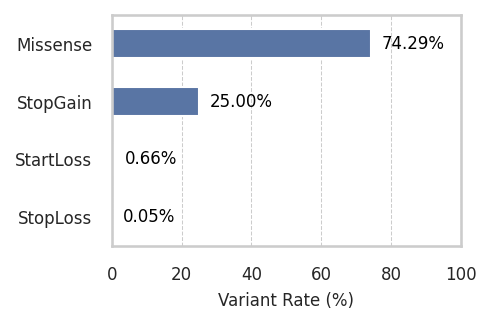

In [ ]:
_tmp = _trainSet['clinvar_and_0.0003']
plot_bar_varType(_tmp, 'test')

## DEF: figure_heatmap(_df, _colL, _chgColL, _orderColL, _method, save_png)

In [ ]:
def figure_heatmap(_df, _colL, _chgColL, _orderColL, _method, save_png):
    _round = 3
    if _colL:
        _df = _df[_colL]

    if _chgColL:
        _df = _df.rename(columns=_chgColL)

    if _orderColL:
        _df = _df[_orderColL]

    _cor = _df.corr(method = _method)
    _df_cor = pd.DataFrame(_cor)

    plt.figure(figsize=(22, 18), dpi=150)  # 이미지 크기 조절
    #sns.heatmap(cor, annot=False, fmt=".2f", cmap='coolwarm', cbar=True)
    #sns.heatmap(cor, annot=False, fmt=".2f", cmap='viridis', cbar=True)
    ax=sns.heatmap(_cor, annot=False, fmt=".2f", cmap='vlag', cbar=True,
                cbar_kws={'label': f'{_method} correlation coefficient'})
    cbar = plt.gcf().axes[-1]  # 색상 바를 나타내는 축 가져오기
    cbar.yaxis.label.set_size(24)
    cbar.tick_params(labelsize=16)

    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)
    #plt.title('Correlation Matrix Heatmap', size=20)

    if save_png:
        print("!!! png: ", save_png)
        plt.savefig(save_png, dpi=150)
    else:
        print("!!! png: No Save")
    plt.show()

    return _df_cor

In [ ]:
colL = ['codonRefFreq','codonAltFreq','codonSTFreq', 'aaSTFreq',
    'pam250','blosum62', 'grantham', 'pp100pfam',
               'pp100gene', 'p100way5','p100way2a',
    'pp470pfam', 'pp470gene', 'p470way5','p470way2a',
               'pc100pfam', 'pc100gene','c100way5', 'c100way2a',
     'pc470pfam', 'pc470gene','c470way2a', 'c470way5',
    'neigh_aa3RefFreqA', 'neigh_aa3AltFreqA',
    'multiz_alRefFreq', 'multiz_aaRefFreq',
  'multiz_alAltFreq', 'multiz_aaAltFreq',
    'gnomAD_exom_v2_AF','gnomAD_exom_v4_AF',
               'pLi','pRec','pNull',
     ]

chgColL={
    'gnomAD_exom_v2_AF':'gnomAD_AFv2', 'gnomAD_exom_v4_AF':'gnomAD_AFv4',
    'gnomAD_exom_v2_AF_popmax':'gnomAD_AFv2max', 'gnomAD_exom_v4_AF_popmax':'gnomAD_AFv4max',
    'c100way2a':'pc100codon', 'c470way2a':'pc470codon',
    'p100way2a':'pp100codon', 'p470way2a':'pp470codon',
    'pc100pfam':'pc100domain', 'pc470pfam':'pc470domain',
    'pp100pfam':'pp100domain', 'pp470pfam':'pp470domain',
    'c100way5':'pc100', 'c470way5':'pc470',
    'p100way5':'pp100', 'p470way5':'pp470',
    'multiz_alRefFreq':'m100_AFref','multiz_aaRefFreq':'m100_AAFref',
    'multiz_alAltFreq':'m100_AFalt','multiz_aaAltFreq':'m100_AAFalt',
    'codonRefFreq':'CFref', 'codonAltFreq':'CFalt',
    'neigh_aa3RefFreqA':'NPFref','neigh_aa3AltFreqA':'NPFalt',
    'codonSTFreq':'codonST', 'aaSTFreq':'aaST' ,
    'v2_AF':'gnomAD_AFv2','v4_AF':'gnomAD_AFv4',
    'v2_AF_popmax':'gnomAD_AFv2max','v4_AF_popmax':'gnomAD_AFv2max',
    'v2_cAF':'gnomAD_cAFv2','v2_cAF_popmax':'gnomAD_cAFv2max',
    }

orderColL = [
 'pc100gene', 'pc470gene', 'pp100gene', 'pp470gene',
 'pc100domain', 'pc470domain', 'pp100domain', 'pp470domain',
 'pc100codon', 'pc470codon', 'pp100codon', 'pp470codon',
 'pc100', 'pc470', 'pp100', 'pp470',
 'm100_AFref','m100_AAFref','m100_AFalt','m100_AAFalt',
 'CFref', 'CFalt', 'NPFref','NPFalt',
 'codonST', 'aaST', 'blosum62', 'pam250', 'grantham',
 'gnomAD_AFv2','gnomAD_AFv4','pLi','pNull','pRec',
]

!!! png:  01_data/0.train.clinvar_and_0.0003.heatmap.spearman.png


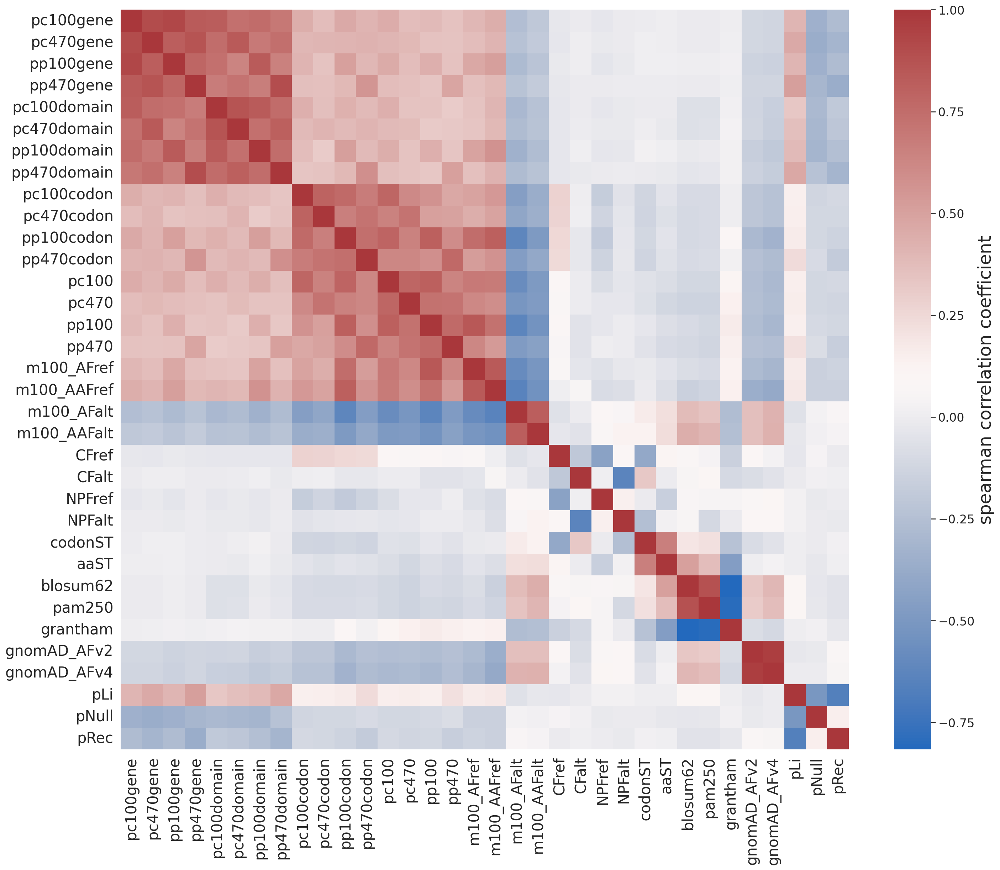

!!! csv:  01_data/0.train.clinvar_and_0.0003.feature.cor.spearman.csv


,pc100gene,pc470gene,pp100gene,pp470gene,pc100domain,pc470domain,pp100domain,pp470domain,pc100codon,pc470codon,pp100codon,pp470codon,pc100,pc470,pp100,pp470,m100_AFref,m100_AAFref,m100_AFalt,m100_AAFalt,CFref,CFalt,NPFref,NPFalt,codonST,aaST,blosum62,pam250,grantham,gnomAD_AFv2,gnomAD_AFv4,pLi,pNull,pRec
pc100gene,1.000000,0.906853,0.922225,0.829802,0.827544,0.732439,0.755669,0.695614,0.440588,0.375244,0.466880,0.414152,0.450396,0.371913,0.388400,0.347390,0.402837,0.441990,-0.259392,-0.200012,-0.022468,-0.008661,-0.035614,-0.012307,-0.005651,0.006175,-0.014538,-0.013122,0.002282,-0.119459,-0.124049,0.408371,-0.347259,-0.276438
pc470gene,0.906853,1.000000,0.815895,0.866814,0.750996,0.839750,0.692582,0.742653,0.397330,0.407600,0.412985,0.419857,0.405287,0.393161,0.348547,0.346509,0.371675,0.411805,-0.236802,-0.187873,-0.030948,0.001844,-0.017295,-0.011036,0.008158,0.003781,-0.013856,-0.008484,0.010135,-0.119300,-0.125867,0.461898,-0.369289,-0.319224
pp100gene,0.922225,0.815895,1.000000,0.786333,0.736313,0.638589,0.835944,0.654246,0.415126,0.346233,0.509664,0.399955,0.456212,0.368465,0.434928,0.350940,0.472140,0.513499,-0.281302,-0.222024,-0.018344,0.003658,-0.037476,-0.021173,0.007529,0.007821,-0.000468,0.001390,0.014593,-0.138321,-0.146616,0.408829,-0.348256,-0.271685
pp470gene,0.829802,0.866814,0.786333,1.000000,0.675195,0.716224,0.671846,0.898541,0.363188,0.359530,0.396772,0.558015,0.373792,0.354546,0.336434,0.489040,0.360470,0.395622,-0.230756,-0.182718,-0.028320,-0.012641,-0.014226,-0.002382,-0.007013,-0.004386,-0.013283,-0.008786,0.010299,-0.127578,-0.128285,0.512921,-0.310037,-0.366733
pc100domain,0.827544,0.750996,0.736313,0.675195,1.000000,0.865718,0.835239,0.756445,0.437151,0.364179,0.432188,0.387344,0.438147,0.344816,0.341950,0.307803,0.344628,0.406984,-0.297321,-0.238394,-0.032184,-0.010640,-0.029151,-0.015845,-0.011534,-0.009310,-0.069904,-0.067143,0.018946,-0.132153,-0.161530,0.327452,-0.288476,-0.197105


In [ ]:
_method = 'spearman'
#_method = 'pearson'
_train = 'clinvar_and_0.0003'
save_png = _fold + f"/0.train.{_train}.heatmap.{_method}.png"
_tmp = _trainSet[_train]
_df_cor=figure_heatmap(_tmp, colL, chgColL, orderColL, _method, save_png)

save_csv = _fold + f"/0.train.{_train}.feature.cor.{_method}.csv"
print("!!! csv: ", save_csv)
_df_cor.to_csv(save_csv, sep="\t",index=True)
display(_df_cor.head())